#Pandas

Img Работа с различными форматами данных (csv, excel, json, sql и т. д.).

Img Фильтрация данных (извлечение данных по условиям).

Img Быстрые математические операции с таблицами и их столбцами.

Img Использование методов статистического анализа.

Img Группировка данных и построение сводных таблиц.

Img Объединение нескольких таблиц.

Img Встроенная визуализация (возможность построения графиков по данным).

In [2]:
import pandas as pd
pd.__version__
print(pd.__name__)

pandas


## Series как структура данных

Series — это упорядоченная изменяемая коллекция объектов, имеющая так называемые ассоциативные метки (индексы). 

Эту структуру можно сравнить со списком: каждому элементу ставится в соответствие индекс, однако, в отличие от списка, индексами могут быть не только порядковые номера — фактически что угодно, например названия компаний, даты, идентификаторы, наименования продуктов.

Также для каждой Series присваивается тип данных её элементов (например int64) и может быть определено имя всего массива. В итоге мы получаем некоторый гибрид списка и словаря.

→ Series в какой-то степени является единицей хранения информации в Pandas. Её можно рассматривать как именованный столбец таблицы с индексами строк.

→ Для создания объекта Series используется команда pd.Series().

In [3]:
# способ №1 — из списка с использованием параметров функции pd.Series():

countries = pd.Series(
    data = ['Англия', 'Канада', 'США', 'Россия', 'Украина', 'Беларусь', 'Казахстан'],
    index = ['UK', 'CA', 'US', 'RU', 'UA', 'BY', 'KZ'],
    name = 'countries'
)
display(countries)

UK       Англия
CA       Канада
US          США
RU       Россия
UA      Украина
BY     Беларусь
KZ    Казахстан
Name: countries, dtype: object

In [4]:
# способ №2 - — из словаря, в котором ключами являются будущие метки, а значениями — будущие значения Series, при этом использование параметра name также возможно:

countries = pd.Series({
    'UK': 'Англия',
    'CA': 'Канада',
    'US' : 'США',
    'RU': 'Россия',
    'UA': 'Украина',
    'BY': 'Беларусь',
    'KZ': 'Казахстан'},
    name = 'countries'
)
display(countries)

UK       Англия
CA       Канада
US          США
RU       Россия
UA      Украина
BY     Беларусь
KZ    Казахстан
Name: countries, dtype: object

В результате выполнения кода выше мы получаем объект Series. При его выводе на экран можно увидеть заданные в параметре index метки — коды стран, соответствующие им значения (названия стран), которые мы задали в параметре data. Также с помощью аргумента name мы явно задали имя для Series.

Внизу, под выводом содержимого, можно увидеть тип данных объектов, хранимых в Series. Типом данных object в Pandas обозначаются строки и смешанные типы данных (кортежи, списки, текст, смешанный с числами, и т. д.).

Доступ к данным в Series

Доступ к элементам осуществляется с использованием loc или iloc.

.loc вызывается с квадратными скобками, в которые передаются метки. В него можно передать как один индекс, так и список, чтобы получилось несколько элементов. 

Например, для получения названия страны по коду "US" можно выполнить следующий код:

print(countries.loc['US'])
# США
Для того чтобы достать информацию по нескольким индексам, необходимо обернуть интересующие индексы в список:

print(countries.loc[['US', 'RU', 'UK']])
Img

.iloc также вызывается с квадратными скобками и принимает на вход порядковые номера элементов Series (нумерация начинаются с 0). В него можно так же передавать как один индекс, так и диапазон чисел. 

Например, для получения элемента по индексу "KZ" нужно обратиться через .iloc по номеру 6:

print(countries.iloc[6])
# Казахстан
Получим срез из исходной Series с первого по третий элемент:

print(countries.iloc[1:4])
Img

На самом деле loc и iloc можно опустить и обращаться к элементам Series напрямую по индексам, например countries[['UK', 'US', 'UA']] или countries[[0, 2, 4]]. Оба варианта являются равноправными для Series, однако в дальнейшем мы будем использовать эти операции при обращении к более сложной структуре — DataFrame, а в контексте этой структуры эти варианты уже неравноправны.

## DataFrame как структура данных

DataFrame является двумерной структурой и представляется в виде таблицы, в которой есть строки и столбцы: столбцами в DataFrame выступают объекты Series, а строки формируются из их элементов. Также в DataFrame есть метки (индексы), которые соответствуют каждой строке таблицы.

In [5]:
# способ №1 — создания DataFrame — из словаря, ключами которого являются имена столбцов будущей таблицы, а значениями — списки, в которых хранится содержимое этих столбцов:

import pandas as pd
countries_df = pd.DataFrame({
    'country': ['Англия', 'Канада', 'США', 'Россия', 'Украина', 'Беларусь', 'Казахстан'],
    'population': [56.29, 38.05, 322.28, 146.24, 45.5, 9.5, 17.04],
    'area': [133396, 9984670, 9826630, 17125191, 603628, 207600, 2724902]
})
display(countries_df)

,country,population,area
0,Англия,56.29,133396
1,Канада,38.05,9984670
2,США,322.28,9826630
3,Россия,146.24,17125191
4,Украина,45.50,603628
5,Беларусь,9.50,207600
6,Казахстан,17.04,2724902


Примечание. В данном коде мы создаём таблицу, столбцы которой соответствуют названиям стран, их населению в миллионах человек и площади в квадратных километрах.

Обратите внимание, что, так как мы не задали метки (индексы) DataFrame, они были сгенерированы автоматически. Исправим это, задав индексы вручную:

In [6]:
countries_df.index = ['UK', 'CA', 'US', 'RU', 'UA', 'BY', 'KZ']
display(countries_df)

,country,population,area
UK,Англия,56.29,133396
CA,Канада,38.05,9984670
US,США,322.28,9826630
RU,Россия,146.24,17125191
UA,Украина,45.50,603628
BY,Беларусь,9.50,207600
KZ,Казахстан,17.04,2724902


In [7]:
# способ №2 — Также DataFrame можно создать из вложенного списка, внутренние списки которого будут являться строками новой таблицы:
countries_df = pd.DataFrame(
    data = [
        ['Англия', 56.29, 133396],
        ['Канада', 38.05, 9984670],
        ['США', 322.28, 9826630],
        ['Россия', 146.24, 17125191],
        ['Украина', 45.5, 603628],
        ['Беларусь', 9.5, 207600],
        ['Казахстан', 17.04, 2724902]
    ],
    columns= ['country', 'population', 'area'],
    index = ['UK', 'CA', 'US', 'RU', 'UA', 'BY', 'KZ']
)
display(countries_df)

,country,population,area
UK,Англия,56.29,133396
CA,Канада,38.05,9984670
US,США,322.28,9826630
RU,Россия,146.24,17125191
UA,Украина,45.50,603628
BY,Беларусь,9.50,207600
KZ,Казахстан,17.04,2724902


В данном варианте создания DataFrame мы задаём имена столбцов в списке с помощью параметра columns, а также инициализируем параметр index для задания меток стран.

## Axis в DataFrame

→ Как уже было сказано, DataFrame является двумерной структурой данных, что означает наличие двух возможных направлений движения в ней: вдоль строк и вдоль столбцов. 

При работе с Pandas важно уметь указывать направление работы метода, который используется. Для этого вводится понятие axis (ось, координата). Движение по строкам в таблице обозначается axis с индексом 0 (по вертикали), а движение по столбцам (по горизонтали) — axis с индексом 1.

Данный параметр заложен во все методы, которые могут работать в двух направлениях и по умолчанию в большинстве из них axis=0, то есть они выполняют операции со строками, если не задавать axis вручную.



In [8]:
# Рассмотрим разницу в результатах работы методов в зависимости от параметра axis 
# на примере использования метода DataFrame mean() — вычисление среднего по таблице.

#Считаем среднее по строкам (axis = 0) в каждом столбце:

countries_df.mean(axis=0, numeric_only=True)



population    9.070000e+01
area          5.800860e+06
dtype: float64

В данном случае среднее было рассчитано по строкам для столбцов population и area.

Обратите внимание на то, что так как не все столбцы в нашей таблице являются числовыми, то нам необходимо установить параметр numeric_only в значение True (вести расчёт только по числовым столбцам). Это делается для того, чтобы не получать предупреждений (warnings).

In [9]:
# Считаем среднее по столбцам (axis = 1) в каждой строке:

countries_df.mean(axis=1, numeric_only=True)

UK      66726.145
CA    4992354.025
US    4913476.140
RU    8562668.620
UA     301836.750
BY     103804.750
KZ    1362459.520
dtype: float64

## Доступ к данным в DataFrame

In [10]:
## Можно обратиться к DataFrame по имени столбца через точку:

countries_df.population
# Однако использование такого способа возможно только тогда, 
# когда имя столбца указано без пробелов.


## Другой вариант — обратиться к DataFrame по индексу и указать имя столбца:

countries_df['population']

UK     56.29
CA     38.05
US    322.28
RU    146.24
UA     45.50
BY      9.50
KZ     17.04
Name: population, dtype: float64

Для того чтобы получить доступ к ячейкам таблицы, используются уже знакомые нам loc и iloc.

При этом, в соответствии с механизмом работы axis, при обращении к DataFrame по индексам с помощью loc (iloc) первым индексом указывается индекс (порядковый номер), соответствующий строкам, а вторым — имя (порядковый номер) столбца.

In [11]:

#1
#Получим площадь Великобритании:
countries_df.loc['UK', 'area']

#2
#Получим население и площадь, соответствующие России:
countries_df.loc['RU', ['population', 'area']]

#3
#Сделаем вырезку из таблицы и получим информацию о населении и площади, 
# соответствующую Украине, Беларуси и Казахстану:
countries_df.loc[['UA', 'BY', 'KZ'],['population', 'area']]

#или
countries_df.iloc[4:8, 1:3]

,population,area
UA,45.50,603628
BY,9.50,207600
KZ,17.04,2724902


## Запись в csv-файл

Самым простым и распространённым источником табличных данных является формат csv (comma-separated values). В данном формате ячейки таблицы обозначаются некоторым разделителем, чаще всего запятой либо точкой с запятой.

 Основные параметры метода DataFrame to_csv()

-  path_or_buf — путь до файла, в который будет записан DataFrame (например, data/my_data.csv);
-  sep — разделитель данных в выходном файле (по умолчанию ',');
-  decimal — разделитель чисел на целую и дробную части в выходном файле (по умолчанию '.');
-  columns — список столбцов, которые нужно записать в файл (по умолчанию записываются все столбцы);
-  index — параметр, определяющий, требуется ли создавать дополнительный столбец с индексами строк в файле (по умолчанию True).

In [12]:
#Заранее создадим папку data в директории, где лежит наш ноутбук. 
#Теперь давайте сохраним наш DataFrame с информацией о странах 
#в csv-файл countries.csv и положим файл в папку data. При этом укажем, 
#что разделителем в нашем файле будет являться символ ';', а также то, 
#что нам не нужен дополнительный столбец с индексами строк:

import pandas as pd
countries_df = pd.DataFrame({
    'country': ['Англия', 'Канада', 'США', 'Россия', 'Украина', 'Беларусь', 'Казахстан'],
    'population': [56.29, 38.05, 322.28, 146.24, 45.5, 9.5, 17.04],
    'area': [133396, 9984670, 9826630, 17125191, 603628, 207600, 2724902]
})

countries_df.to_csv('data/countries.csv', index=False, sep=';')

## Чтение csv-файла

Для чтения таблицы из csv-файла используется функция модуля Pandas read_csv. Функция возвращает DataFrame и имеет несколько важных параметров.

Основные параметры функции read_csv()

-  filepath_or_buffer — путь до файла, который мы читаем;
-  sep — разделитель данных (по умолчанию ',');
-  decimal — разделитель чисел на целую и дробную часть в выходном файле (по умолчанию '.');
-  names — список с названиями столбцов для чтения;
-  skiprows — количество строк в файле, которые нужно пропустить (например, файл может содержать служебную информацию, которая нам не нужна).

In [13]:
#Убедимся, что сохранённый нами ранее файл создался верно. 
# Для этого прочитаем его в переменную countries_data и выведем
# её на экран. Не забудем также о том, что мы использовали 
# в качестве разделителя ';':

countries_data = pd.read_csv('data/countries.csv', sep=';')
display(countries_data)

,country,population,area
0,Англия,56.29,133396
1,Канада,38.05,9984670
2,США,322.28,9826630
3,Россия,146.24,17125191
4,Украина,45.50,603628
5,Беларусь,9.50,207600
6,Казахстан,17.04,2724902


## Чтение csv-файла по ссылке

На самом деле файл с данными не обязательно должен храниться у вас на компьютере. Если он находится в открытом доступе по ссылке (например, на Google Диске или GitHub), его можно прочитать и из интернета — для этого достаточно в функции read_csv() вместо пути до файла указать ссылку на файл. Например:

In [14]:
data = pd.read_csv('https://raw.githubusercontent.com/esabunor/MLWorkspace/master/melb_data.csv')
display(data)

,Unnamed: 0,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,5,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,6,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18391,23540,Williamstown,8/2 Thompson St,2,t,622500.0,SP,Greg,26/08/2017,6.8,...,2.0,1.0,NaN,89.0,2010.0,NaN,-37.86393,144.90484,Western Metropolitan,6380.0
18392,23541,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,...,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0
18393,23544,Yallambie,17 Amaroo Wy,4,h,1100000.0,S,Buckingham,26/08/2017,12.7,...,3.0,2.0,NaN,NaN,NaN,NaN,-37.72006,145.10547,Northern Metropolitan,1369.0
18394,23545,Yarraville,6 Agnes St,4,h,1285000.0,SP,Village,26/08/2017,6.3,...,1.0,1.0,362.0,112.0,1920.0,NaN,-37.81188,144.88449,Western Metropolitan,6543.0


## Запись и чтение в других форматах

Как уже говорилось ранее, Pandas способен работать со многими распространёнными форматами данных.

Методы для записи таблиц в файлы отличных от csv форматов:

to_excel() — запись DataFrame в формат Excel-таблицы (.xlsx);
to_json() — запись DataFrame в формат JSON (.json);
to_xml() — запись DataFrame в формат XML-документа (.xml);
to_sql() — запись DataFrame в базу данных SQL (для реализации этого метода необходимо установить соединение с базой данных).


Методы для чтения таблиц из файлов в отличных от csv форматах:

read_excel() — чтение из формата Excel-таблицы (.xlsx) в DataFrame;
read_json() — чтение из формата JSON (.json) в DataFrame;
read_xml() — чтение из формата XML-документа (.xml) в DataFrame;
read_sql() — чтение из базы данных SQL в DataFrame (также необходимо установить соединение с базой данных).

In [15]:
#Читаем в DataFrame csv-файл, в качестве разделителя 
# у которого значится ';', а первые 20 строк занимает служебная информация

df = pd.read_csv('path/file.csv', sep = ';', skiprows = 20)

# записать DataFrame в csv-файл, в котором разделителем служит ';',
# а целая часть числа отделяется от дробной знаком ','

df.to_csv('path/file.csv', sep = ';', decimal=',')

FileNotFoundError: [Errno 2] No such file or directory: 'path/file.csv'

In [ ]:
melb_data = pd.read_csv('data/melb_data.csv', sep=',')
display(melb_data)

Ранее мы прочитали файл melb_data.csv в DataFrame. Теперь настало время исследовать структуру данных и их основные характеристики.

→ Часто бывает такое, что вывести на экран все строки таблицы является ресурсозатратной операцией, а иногда и вовсе не представляется возможным. В большинстве случаев для того, чтобы понять структуру DataFrame и удостовериться, что таблица подгрузилась верно, достаточно вывести несколько первых или последних строк.

Для этого у DataFrame есть методы head() и tail(), которые возвращают n первых и n последних строк таблицы соответственно (по умолчанию n = 5).

In [ ]:
melb_data = pd.read_csv('data/melb_data.csv', sep=',')
display(melb_data.head())

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,...,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Coordinates
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,...,1.0,202.0,126.0,1970.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0,"-37.7996, 144.9984"
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,...,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0,"-37.8079, 144.9934"
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,...,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0,"-37.8093, 144.9944"
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,...,1.0,94.0,126.0,1970.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0,"-37.7969, 144.9969"
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,...,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0,"-37.8072, 144.9941"


## Размерность таблицы

                   Размерность таблицы

Далее хотелось бы узнать размер таблицы — количество строк и количество столбцов. Это можно сделать с помощью атрибута shape, который возвращает кортеж с количеством строк и столбцов:

In [ ]:
melb_data.shape
# (13580, 23)

(13580, 23)

## Получение информации о столбцах

               Получение информации о столбцах

Для того чтобы получить более детальную информацию о столбцах таблицы, можно использовать метод DataFrame info():

In [ ]:
melb_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   index          13580 non-null  int64  
 1   Suburb         13580 non-null  object 
 2   Address        13580 non-null  object 
 3   Rooms          13580 non-null  int64  
 4   Type           13580 non-null  object 
 5   Price          13580 non-null  float64
 6   Method         13580 non-null  object 
 7   SellerG        13580 non-null  object 
 8   Date           13580 non-null  object 
 9   Distance       13580 non-null  float64
 10  Postcode       13580 non-null  int64  
 11  Bedroom        13580 non-null  float64
 12  Bathroom       13580 non-null  float64
 13  Car            13580 non-null  float64
 14  Landsize       13580 non-null  float64
 15  BuildingArea   13580 non-null  float64
 16  YearBuilt      13580 non-null  float64
 17  CouncilArea    12211 non-null  object 
 18  Lattit

Данный метод выводит:

информацию об индексах;
информацию об общем количестве столбцов;
таблицу, в которой содержится информация об именах столбцов (Column), количестве непустых значений (Non-Null Count) в каждом столбце и типе данных столбца (Dtype), количестве столбцов, в которых используется определённый тип данных;
количество оперативной памяти в мегабайтах, которое тратится на хранение данных.

Из вывода метода info() становится понятно, что в нашей таблице есть столбец CouncilArea с пропущенными значениями — количество непустых значений в столбце меньше, чем количество строк в таблице (12211 < 13580).

Пустыми, или пропущенными, значениями называются значения в ячейках таблицы, которые не заполнены по какой-либо причине, то есть на их месте стоит пустое место. В Pandas такие значения обозначаются символом NaN (Not-a-Number).

→ Мы будем говорить о работе с пропусками в отдельном модуле, посвящённом очистке данных, а пока что не будем обращать на них внимания.

Если вам всё же любопытно, как можно работать с такими значениями в Pandas, то вы можете посмотреть информацию

→ Если присмотреться внимательнее к выводу метода info(), а конкретнее — к типам данных столбцов, становится понятно, что некоторые признаки кодируются не совсем корректными типами данных. 

Например, данные в столбцах, которые отражают количество, должны, по идее, выражаться целым числом (Car, Bedroom, Bathroom и Propertyсount), однако кодируются float64 — числом с плавающей запятой размером 64 бита.

Наконец, данные в столбце с годом постройки (YearBuilt) также представлены в формате чисел с плавающей точкой.

Чтобы исправить это, можно воспользоваться методом astype(), который позволяет преобразовать тип данных столбца:

In [ ]:
melb_data['Car'] = melb_data['Car'].astype('int64')
melb_data['Bedroom'] = melb_data['Bedroom'].astype('int64')
melb_data['Bathroom'] = melb_data['Bathroom'].astype('int64')
melb_data['Propertycount'] = melb_data['Propertycount'].astype('int64')
melb_data['YearBuilt'] = melb_data['YearBuilt'].astype('int64')
melb_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   index          13580 non-null  int64  
 1   Suburb         13580 non-null  object 
 2   Address        13580 non-null  object 
 3   Rooms          13580 non-null  int64  
 4   Type           13580 non-null  object 
 5   Price          13580 non-null  float64
 6   Method         13580 non-null  object 
 7   SellerG        13580 non-null  object 
 8   Date           13580 non-null  object 
 9   Distance       13580 non-null  float64
 10  Postcode       13580 non-null  int64  
 11  Bedroom        13580 non-null  int64  
 12  Bathroom       13580 non-null  int64  
 13  Car            13580 non-null  int64  
 14  Landsize       13580 non-null  float64
 15  BuildingArea   13580 non-null  float64
 16  YearBuilt      13580 non-null  int64  
 17  CouncilArea    12211 non-null  object 
 18  Lattit

В данном коде мы при помощи метода astype() последовательно переопределяем столбцы на них же самих, только с изменённым типом данных: int64 — целочисленное число размером 64 бита.

## Получение описательной статистики

→ Часто при работе с таблицей нужно быстро посмотреть на основные статистические свойства её столбцов. Для этого можно воспользоваться методом DataFrame describe().

По умолчанию метод работает с числовыми (int64 и float64) столбцами и показывает число - непустых значений (count), 
- среднее (mean), 
- стандартное отклонение (std), 
- минимальное значение (min),  
- квантили уровней 0.25, 0.5 (медиана) и 0.75 (25%, 50%, 75%) и 
- максимальное значение (max) для каждого столбца исходной таблицы.

Среднеквадрати́ческое отклонение (среднеквадрати́чное отклонение, стандартное отклонение[1]) — наиболее распространённый показатель рассеивания значений случайной величины относительно её математического ожидания (аналога среднего арифметического с бесконечным числом исходов). Обычно означает квадратный корень из дисперсии случайной величины, но иногда может означать тот или иной вариант оценки этого значения.

В литературе обычно обозначают греческой буквой 
σ
{\displaystyle \sigma } (сигма). В статистике принято два обозначения: 
σ
{\displaystyle \sigma } — для генеральной совокупности и 
s
d
{\displaystyle sd} (с англ. standard deviation — стандартное отклонение) — для выборки.


Кванти́ль в математической статистике — значение, которое заданная случайная величина не превышает с фиксированной вероятностью. Если вероятность задана в процентах, то квантиль называется процентилем или перцентилем (см. ниже).

Например, фраза «90-й процентиль массы тела у новорожденных мальчиков составляет 4 кг»[1] означает, что 90 % мальчиков рождаются с весом, меньшим либо равным 4 кг, а 10 % мальчиков рождаются с весом, большим либо равным 4 кг.

In [ ]:
# Чтобы не увязнуть в обилии информации, выведем на экран значение статистических 
# параметров только для столбцов Distance (расстояние от объекта недвижимости 
# до центра Мельбурна), BuildingArea (площадь здания) и Price (цена объекта):

melb_data.describe().loc[:, ['Distance', 'BuildingArea' , 'Price']]


,Distance,BuildingArea,Price
count,13580.000000,13580.000000,1.358000e+04
mean,10.137776,139.633972,1.075684e+06
std,5.868725,392.217403,6.393107e+05
min,0.000000,0.000000,8.500000e+04
25%,6.100000,122.000000,6.500000e+05
50%,9.200000,126.000000,9.030000e+05
75%,13.000000,129.940000,1.330000e+06
max,48.100000,44515.000000,9.000000e+06


Примечание. Числа с (e+n)  означают 10 в n-ой степени. То есть 
9.0e+06 = 9*10(в шестой степени)

Какие интересные выводы мы можем сделать, исходя из построенной таблицы?

Столбец Distance (расстояние до центра города)

В нашем наборе данных представлены объекты, удалённые от центра города на расстояние до 48 километров.
Столбец BuildingArea (площадь здания)

В нашей таблице представлены участки, на которых отсутствует само здание (его площадь равна 0), то есть владельцы продавали участок земли без строений на нём.
Большая часть объектов (75%) имеет площадь здания до 130 квадратных метров, однако в нашей таблице есть настоящий дворец (судя по его размерам) с площадью в 44 515 квадратных метров.
Столбец Price (цена)

Диапазон цен на недвижимость в Мельбурне варьируется от 85 тысяч до 9 миллионов австралийских долларов.

→ На самом деле метод describe() можно применять не только к числовым признакам. С помощью параметра include можно указать тип данных, для которого нужно вывести описательную информацию.

Например, для типа данных object метод describe() возвращает DataFrame, в котором указаны:

количество непустых строк (count);
количество уникальных значений (unique);
самое частое значение — мода —  (top);
частота — объём использования — этого значения (freq) для каждого столбца типа object исходной таблицы.

In [ ]:
melb_data.describe(include=['object'])

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname,Coordinates
count,13580,13580,13580,13580,13580,13580,12211,13580,13580
unique,314,13378,3,5,268,58,33,8,13097
top,Reservoir,36 Aberfeldie St,h,S,Nelson,27/05/2017,Moreland,Southern Metropolitan,"-37.8361, 144.9966"
freq,359,3,9449,9022,1565,473,1163,4695,12


Также приведём несколько выводов, которые можно сделать из полученной таблицы:

Столбец Suburb (пригород)

Наибольшее количество проданных объектов (359) находилось в пригороде Reservoir.
Столбец Type (тип здания)

Самый популярный тип дома — h (дом, вилла, коттедж).
Столбец SellerG (риелтор)

В наших данных нам известно о 268 различных риэлторских компаниях, однако самой главной «акулой» в этом бизнесе является компания Nelson — они продали 1 565 различных домов.
Столбец Date (дата продажи)

В нашей таблице содержится информация за 58 дней, при этом наибольшее число продаж (473) пришлось на 27 мая 2017 года.

## Получение частоты уникальных значений в столбце

→ Для того чтобы определить, сколько раз в столбце повторяется каждый из вариантов значений (т.е. найти частоту для каждого уникального знания), используется метод value_counts().

In [ ]:
melb_data['Regionname'].value_counts()

Regionname
Southern Metropolitan         4695
Northern Metropolitan         3890
Western Metropolitan          2948
Eastern Metropolitan          1471
South-Eastern Metropolitan     450
Eastern Victoria                53
Northern Victoria               41
Western Victoria                32
Name: count, dtype: int64

Чтобы сделать вывод более интерпретируемым и понятным, можно воспользоваться параметром normalize. При установке значения этого параметра на True результат будет представляться в виде доли (относительной частоты):

In [ ]:
melb_data['Regionname'].value_counts(normalize=True)

Regionname
Southern Metropolitan         0.345729
Northern Metropolitan         0.286451
Western Metropolitan          0.217084
Eastern Metropolitan          0.108321
South-Eastern Metropolitan    0.033137
Eastern Victoria              0.003903
Northern Victoria             0.003019
Western Victoria              0.002356
Name: proportion, dtype: float64

Из результатов мы можем сделать вывод, что наименьшее количество объектов (менее 1%) было продано в районах Victoria, а наибольшее — в районах Metropolitan.

## Агрегирующие методы

 Мы научились выводить информацию о статистических показателях с помощью метода describe(). Однако этот метод становится не очень удобным, когда необходимо найти только один статистический параметр, например только среднюю цену,  и использовать их в дальнейшем коде. Поэтому в Pandas предусмотрены инструменты быстрого вычисления показателей с помощью агрегирующих методов. 

Агрегирующим в Pandas называется метод, который для каждого столбца возвращает только одно значение — показатель (например, вычисление медианы, максимума, среднего и так далее).

Метод	Статистический параметр
.count()	Количество непустых значений
.mean()	Среднее значение
.min()	Минимальное значение
.max()	Максимальное значение
.var()	Дисперсия
.std()	Стандартное отклонение
.sum()	Сумма
.quantile(x)	Квантиль уровня x
.nunique()	Число уникальных значений

Если один из этих методов применить ко всему DataFrame, то в результате его работы будет получен объект типа Series, в котором в качестве индексов будут выступать наименования столбцов, а в качестве значений — статистический показатель. В случае применения метода к отдельному столбцу результатом вычислений станет число.

В каждый метод можно передать некоторые параметры, среди которых:

axis  — определяет, подсчитывать параметр по строкам или по столбцам;
numeric_only — определяет, вычислять параметры только по числовым столбцам/строкам или нет (True/False).

In [ ]:
#Разберём агрегирующие функции на примерах.

#Вычислим среднюю цену на объекты недвижимости:
print(melb_data['Price'].mean())
# 1075684.079455081

#Найдём максимальное количество парковочных мест:
print(melb_data['Car'].max())
# 10

#А теперь представим, что риэлторская ставка для всех компаний за продажу
# недвижимости составляет 12%. Найдём общую прибыльность риэлторского бизнеса
# в Мельбурне. Результат округлим до сотых:
rate = 0.12
income = melb_data['Price'].sum() * rate
print('Total income of real estate agencies:', round(income, 2))
# Total income of real estate agencies: 1752934775.88

#Найдём, насколько медианная площадь территории отличается 
# от её среднего значения. Вычислим модуль разницы между медианой и средним
# и разделим результат на среднее, чтобы получить отклонение в долях:
landsize_median = melb_data['Landsize'].median() 
landsize_mean =  melb_data['Landsize'].mean()
print(abs(landsize_median - landsize_mean)/landsize_mean)
# 0.21205713983546193

В результате получаем долю отклонения медианы от среднего значения. Умножив результат на 100, получим его в процентах. Отклонение медианы от среднего значения на 21% является довольно большим, и это повод задуматься над тем, чтобы исследовать признак на наличие аномалий. 

## Модальное значение

→ Отдельный интерес представляет статический показатель моды — самого распространённого значения в столбце. Он вычисляется с помощью метода mode().

Модальных значений может быть несколько, то есть несколько значений могут встречаться одинаковое количество раз. Поэтому метод mode(), в отличие от агрегирующих методов, возвращает не одно число, а серию.

In [ ]:
#Вычислим, какое число комнат чаще всего представлено на рынке недвижимости:

print(melb_data['Rooms'].mode())

print(melb_data['Regionname'].mode())
# 0    3
# dtype: int64

0    3
Name: Rooms, dtype: int64
0    Southern Metropolitan
Name: Regionname, dtype: object


Примечание. Метод mode() может быть использован не только с числовыми столбцами, но и со столбцами типа object. Так, например, с помощью следующего кода можно найти наиболее распространённое название района:

melb_data['Regionname'].mode()

## Фильтрация данных в DataFrame

 Часто возникает необходимость исследовать определённую группу объектов по какому-то условию, например найти здания с ценой меньше 1 миллиона или выделить из всей таблицы помещения с двумя комнатами.

Такие задачи называются задачами фильтрации.

Под фильтрацией в DataFrame подразумевается получение новой таблицы путём вырезания строк, не удовлетворяющих поставленному условию. 

Разберём классический способ фильтрации в DataFrame — фильтрацию с помощью масок.

Маской называется Series, которая состоит из булевых значений, при этом значения True соответствуют тем индексам, для которых заданное условие выполняется, в противном случае ставится значение False (например, цена > 2 млн).

In [ ]:
# Создадим маску и положим её в переменную с именем mask. 
# Синтаксис очень прост:

mask = melb_data['Price'] > 2000000
display(mask)

0        False
1        False
2        False
3        False
4        False
         ...  
13575    False
13576    False
13577    False
13578     True
13579    False
Name: Price, Length: 13580, dtype: bool

In [ ]:
# Для фильтрации нужно просто подставить переменную mask в индексацию DataFrame.
# Маска показывает, какие строки нужно оставлять в результирующем наборе, 
# а какие — убирать (выведем первые пять строк отфильтрованной таблицы):
mask = melb_data['Price'] > 2000000  
display(melb_data[mask].head())

# либо короче и сразу без создания переменн ой 
# melb_data[melb_data['Price'] > 2000000]

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,...,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Coordinates
80,80,Albert Park,112 Beaconsfield Pde,3,h,2850000.0,PI,Buxton,4/03/2017,3.3,...,0,211.0,198.0,1890,Port Phillip,-37.8481,144.9499,Southern Metropolitan,3280,"-37.8481, 144.9499"
85,85,Albert Park,104 Richardson St,4,h,2300000.0,S,Marshall,7/05/2016,3.3,...,1,153.0,180.0,1880,Port Phillip,-37.8447,144.9523,Southern Metropolitan,3280,"-37.8447, 144.9523"
88,88,Albert Park,29 Faussett St,2,h,2120000.0,S,Greg,10/09/2016,3.3,...,1,199.0,107.0,1900,Port Phillip,-37.8422,144.9554,Southern Metropolitan,3280,"-37.8422, 144.9554"
92,92,Albert Park,2 Dundas Pl,3,h,2615000.0,S,Cayzer,10/12/2016,3.3,...,1,177.0,181.0,1880,Port Phillip,-37.8415,144.9585,Southern Metropolitan,3280,"-37.8415, 144.9585"
93,93,Albert Park,23 Finlay St,5,h,2100000.0,S,Greg,10/12/2016,3.3,...,1,237.0,126.0,1970,Port Phillip,-37.8436,144.9557,Southern Metropolitan,3280,"-37.8436, 144.9557"


Примечание. В результате выполнения фильтрации возвращается новый DataFrame, полученный из исходного, при этом исходная таблица melb_data остаётся без изменений.

Также вовсе не обязательно заносить маску в отдельную переменную — можно сразу вставлять условие в операцию индексации DataFrame, например:

melb_data[melb_data['Price'] > 2000000]

In [ ]:
#Найдём количество зданий с тремя комнатами. Для этого отфильтруем таблицу
# по условию: обратимся к результирующей таблице по столбцу Rooms
# и найдём число строк в ней с помощью атрибута shape:

melb_data[melb_data['Rooms'] == 3].shape[0]
# 5881

Условия можно комбинировать, используя операторы & (логическое И) и | (логическое ИЛИ). Условия при этом заключаются в скобки.

In [ ]:
#Усложним прошлый пример и найдём число трёхкомнатных домов с ценой
# менее 300 тысяч:

melb_data[(melb_data['Rooms'] == 3) & (melb_data['Price'] < 300000)].shape[0]
# 3

In [ ]:
#Немного «ослабим» условие: теперь нас будут интересовать дома
# с ценой менее 300 тысяч, у которых либо число комнат равно 3 
# либо площадь домов более 100 квадратных метров:

melb_data[((melb_data['Rooms'] == 3) | (melb_data['BuildingArea'] > 100)) & (melb_data['Price'] < 300000)].shape[0]
# 68

Примечание. Обратите внимание, что использование привычных операторов and и or будет неверным и приведёт к ошибке, так как они выполняют логические операции между двумя булевыми числами. В нашем случае слева и справа от оператора стоят маски (объекты Series), для которых логическую операцию надо совершить поэлементно, а операторы and и or для такого не предназначены.

In [ ]:
#А теперь более сложный трюк: найдём медианную площадь здания у объектов,
# чья цена выше средней. Для того чтобы оградить наш код от нагромождений, 
# предварительно создадим переменную со средней ценой:

mean_price = melb_data['Price'].mean()
melb_data[melb_data['Price'] > mean_price]['BuildingArea'].median()

# 126.0

## Feature Engineering ( генерацией признаков (фичей).)

Цели данного модуля:

Научиться создавать новые признаки в данных с помощью базовых операций со столбцами.
Освоить методы работы с датой и временем в Pandas.
Научиться применять собственные функции для преобразования столбцов и создания новых признаков.
Познакомиться с новым типом данных category и научиться использовать его при работе с данными.

In [ ]:
# Импортируем Pandas, прочитаем наш csv-файл в DataFrame и выведем 
# первые пять строк таблицы, чтобы убедиться в том, что файл прочитан верно.
import pandas as pd

melb_data = pd.read_csv('data/melb_data_ps.csv', sep=',')
melb_data.head()

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,...,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Coordinates
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,...,1,202.0,126.0,1970,Yarra,-37.7996,144.9984,Northern Metropolitan,4019,"-37.7996, 144.9984"
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,...,0,156.0,79.0,1900,Yarra,-37.8079,144.9934,Northern Metropolitan,4019,"-37.8079, 144.9934"
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,...,0,134.0,150.0,1900,Yarra,-37.8093,144.9944,Northern Metropolitan,4019,"-37.8093, 144.9944"
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,...,1,94.0,126.0,1970,Yarra,-37.7969,144.9969,Northern Metropolitan,4019,"-37.7969, 144.9969"
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,...,2,120.0,142.0,2014,Yarra,-37.8072,144.9941,Northern Metropolitan,4019,"-37.8072, 144.9941"


## Создание копии таблицы

Поэтому, чтобы не переопределять переменную melb_data и тем самым не повредить первоначальный DataFrame, создадим копию melb_df с помощью метода copy():

In [ ]:
melb_df = melb_data.copy()
melb_df.head()

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,...,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Coordinates
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,...,1,202.0,126.0,1970,Yarra,-37.7996,144.9984,Northern Metropolitan,4019,"-37.7996, 144.9984"
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,...,0,156.0,79.0,1900,Yarra,-37.8079,144.9934,Northern Metropolitan,4019,"-37.8079, 144.9934"
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,...,0,134.0,150.0,1900,Yarra,-37.8093,144.9944,Northern Metropolitan,4019,"-37.8093, 144.9944"
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,...,1,94.0,126.0,1970,Yarra,-37.7969,144.9969,Northern Metropolitan,4019,"-37.7969, 144.9969"
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,...,2,120.0,142.0,2014,Yarra,-37.8072,144.9941,Northern Metropolitan,4019,"-37.8072, 144.9941"


⭐ Лайфхак. Старайтесь всегда оставлять переменную с первоначальным DataFrame неизменной, создавайте копию исходной таблицы и совершайте преобразования на ней. Это оградит вас от ошибок, которые можно совершить при подготовке данных. Например, если вы понимаете, что преобразование оказалось неудачным, достаточно будет лишь запустить ячейку, в которой вы производите копирование, а не читать таблицу заново. Особенно критичным это может быть, когда количество строк в таблице исчисляется миллионами и её чтение занимает до нескольких минут.

## Удаление столбцов

За удаление строк и столбцов в таблице отвечает метод drop().

- labels — порядковые номера или имена столбцов, которые подлежат удалению; если их несколько, то передаётся список;
- axis — ось совершения операции, axis=0 — удаляются строки, axis=1 — удаляются столбцы;
- inplace — если параметр выставлен на True, происходит замена изначального DataFrame на новый, при этом метод ничего не возвращает; если на False — возвращается копия DataFrame, из которой удалены указанные строки (столбцы), при этом первоначальный DataFrame не изменяется; по умолчанию параметр равен False.

In [ ]:
# Удалим столбцы index и Coordinates из таблицы с помощью метода drop(). 
# Выведем первые пять строк таблицы и убедимся, что всё прошло успешно.

melb_df = melb_df.drop(['index', 'Coordinates'], axis=1)
melb_df.head()

# Альтернативный вариант:

#melb_df.drop(['index','Coordinates'],axis=1,inplace=True)
#melb_df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067,...,1,1,202.0,126.0,1970,Yarra,-37.7996,144.9984,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067,...,1,0,156.0,79.0,1900,Yarra,-37.8079,144.9934,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067,...,2,0,134.0,150.0,1900,Yarra,-37.8093,144.9944,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067,...,2,1,94.0,126.0,1970,Yarra,-37.7969,144.9969,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067,...,1,2,120.0,142.0,2014,Yarra,-37.8072,144.9941,Northern Metropolitan,4019


## Математические операции со столбцами

→ Pandas поддерживает базовые математические операции между столбцами: столбцы можно складывать, вычитать, умножать, делить между собой, а также возводить в степень. С помощью таких операций мы можем создавать новые признаки или производить преобразования над старыми.

Причём все операции со столбцами совершаются поэлементно, очень быстро, а самое главное — без написания циклов.

In [ ]:
# Например, давайте создадим переменную total_rooms, в которой будем хранить 
# общее количество комнат в здании. Для этого выполним сложение столбцов 
# с количеством комнат, ванн и спален:

total_rooms = melb_df['Rooms'] + melb_df['Bedroom'] + melb_df['Bathroom']
display(total_rooms)

0         5
1         5
2         8
3         8
4         8
         ..
13575    10
13576     8
13577     8
13578     9
13579     9
Length: 13580, dtype: int64

In [ ]:
#А теперь введём признак MeanRoomsArea, который соответствует средней 
# площади одной комнаты для каждого объекта. Для этого разделим площадь 
# здания на полученное ранее общее количество комнат:

melb_df['MeanRoomsArea'] = melb_df['BuildingArea'] / total_rooms
display(melb_df['MeanRoomsArea'])

0        25.200000
1        15.800000
2        18.750000
3        15.750000
4        17.750000
           ...    
13575    12.600000
13576    16.625000
13577    15.750000
13578    17.444444
13579    12.444444
Name: MeanRoomsArea, Length: 13580, dtype: float64

In [ ]:
#Можно ввести ещё один интересный признак — AreaRatio, коэффициент 
# соотношения площади здания (BuildingArea) и площади участка (Landsize). 
# Для этого разницу двух площадей поделим на их сумму:

diff_area = melb_df['BuildingArea'] - melb_df['Landsize']
sum_area = melb_df['BuildingArea'] + melb_df['Landsize']
melb_df['AreaRatio'] = diff_area/sum_area
display(melb_df['AreaRatio'])

0       -0.231707
1       -0.327660
2        0.056338
3        0.145455
4        0.083969
           ...   
13575   -0.676093
13576   -0.429185
13577   -0.551601
13578   -0.693060
13579   -0.527426
Name: AreaRatio, Length: 13580, dtype: float64

Что показывает такой коэффициент? Если присмотреться, можно увидеть, что AreaRatio лежит в интервале от -1 до 1.

Рассмотрим три случая, чтобы понять его значение:

Если рассматриваемые площади равны, то числитель дроби зануляется и коэффициент тоже равен 0.
Если одна из площадей начинает доминировать над другой, то коэффициент начинает расти в отрицательную сторону, если площадь участка больше площади здания, и в положительную сторону, если наоборот.
Наконец, в предельном случае, если площадь здания равна 0, то числитель дроби равен знаменателю со знаком минус, а коэффициент равен -1, а если площадь участка равна 0, то числитель дроби равен знаменателю со знаком плюс, а коэффициент равен 1.
Таким образом, значение в столбце AreaRatio служит своеобразным указателем соотношения площадей объекта недвижимости. Для пустырей — участков без строений — он будет равен -1, для домов без территории — 1, во всех остальных случаях мы можем увидеть, какая площадь больше — здания или участка.

## Работа с датами в DataFrame

# Формат datetime

Многие выгрузки из систем и баз данных имеют свой служебный формат. Например, формат времени из разных систем может отличаться:

2018-11-09 15:45:21;
11/09/2018 3:45:20 PM;
2018-11-09T15:45:21.2984.
Для всех этих случаев необходимо задавать формат распознавания дат и уметь сравнивать их между собой. Для этого был создан единый способ обозначения даты и времени. 

Таким форматом в Pandas является формат datetime, который записывается как YYYY-MM-DD HH: MM: SS, то есть составляющие времени указываются в следующем порядке: год, месяц, день, час, минута, секунда.

In [ ]:
#В наших данных дата записана в виде DD/MM/YYYY,
# например 3/12/2017. Посмотрим на это:

display(melb_df['Date'])

0         3/12/2016
1         4/02/2016
2         4/03/2017
3         4/03/2017
4         4/06/2016
            ...    
13575    26/08/2017
13576    26/08/2017
13577    26/08/2017
13578    26/08/2017
13579    26/08/2017
Name: Date, Length: 13580, dtype: object

Для того чтобы преобразовывать столбцы с датами, записанными в распространённых форматах, в формат datetime, можно воспользоваться функцией pandas.to_datetime(). В нашем случае в функции нужно указать параметр dayfirst=True, который будет обозначать, что в первоначальном признаке первым идет день.

In [ ]:
#Преобразуем столбец Date в формат datetime, передав его в эту функцию:

melb_df['Date'] = pd.to_datetime(melb_df['Date'], dayfirst=True)
display(melb_df['Date'])

0       2016-12-03
1       2016-02-04
2       2017-03-04
3       2017-03-04
4       2016-06-04
           ...    
13575   2017-08-26
13576   2017-08-26
13577   2017-08-26
13578   2017-08-26
13579   2017-08-26
Name: Date, Length: 13580, dtype: datetime64[ns]

В результате мы переопределяем признак Date в формат datetime. При этом так как в изначальном варианте время не было указано, то и после преобразования оно опускается.

Стоит обратить внимание, что изменился тип данных для столбца Date, теперь его тип — datetime64. Рассмотрим несколько возможностей этого типа данных.

# Выделение атрибутов datetime

Тип данных datetime позволяет с помощью специального аксессора dt выделять составляющие времени из каждого элемента столбца, такие как:

date — дата;
year, month, day — год, месяц, день;
time — время;
hour, minute, second — час, минута, секунда;
dayofweek — номер дня недели, от 0 до 6, где 0 — понедельник, 6 — воскресенье;
day_name — название дня недели;
dayofyear — порядковый день года;
quarter — квартал (интервал в три месяца).

In [ ]:
#Например, обратившись по атрибуту dt.year в столбце Date, 
# мы можем «достать» год продажи и понять, за какой интервал
# времени (в годах) представлены наши данные, а также на какой 
# год приходится наибольшее число продаж:

years_sold = melb_df['Date'].dt.year
print(years_sold)
print('Min year sold:', years_sold.min())
print('Max year sold:', years_sold.max())
print('Mode year sold:', years_sold.mode()[0])

0        2016
1        2016
2        2017
3        2017
4        2016
         ... 
13575    2017
13576    2017
13577    2017
13578    2017
13579    2017
Name: Date, Length: 13580, dtype: int32
Min year sold: 2016
Max year sold: 2017
Mode year sold: 2017


В результате обращения к атрибуту datetime melb_df['Date'].dt.year мы получаем объект Series, в котором в качестве значений выступают годы продажи объектов недвижимости. Мы можем занести результат в переменную year_sold и далее работать с ней как с обычным столбцом Series — вычислять максимум, минимум и модальное значение.

Из результатов видно, что данные представлены за интервал с 2016 по 2017 год и наибольшее количество объектов было продано в 2017 году.

Примечание. Так как модальных значений в столбце может быть несколько, метод mode() возвращает объект Series, даже если мода в данных только одна. Чтобы сохранить стилистику вывода информации о годе продажи и выводить только число, а не Series, мы обращаемся к результату работы метода mode() по индексу 0.

In [ ]:
#Теперь попробуем понять, на какие месяцы приходится пик продаж объектов 
# недвижимости. Для этого выделим атрибут dt.month и на этот раз занесём 
# результат в столбец MonthSale, а затем найдём относительную частоту продаж
# для каждого месяца от общего количества продаж — для этого используем метод
# value_counts() с параметром normalize (вывод в долях):

melb_df['MonthSale'] = melb_df['Date'].dt.month
melb_df['MonthSale'].value_counts(normalize=True)

MonthSale
5     0.149411
7     0.145950
9     0.135862
6     0.134757
8     0.114138
11    0.082032
4     0.069882
3     0.049926
12    0.044698
10    0.040574
2     0.032622
1     0.000147
Name: proportion, dtype: float64

Из результатов становится ясно, что наибольшее количество продаж недвижимости приходится на май, июль и сентябрь (пятый, седьмой и девятый месяцы соответственно). Месяцами застоя при этом являются месяцы — октябрь, февраль и январь (десятый, второй и первый месяцы соответственно).

# Работа с интервалами

Часто бывает такая ситуация, что необходимо вычислять интервалы между двумя временными промежутками. Например, можно вычислить, сколько дней прошло с 1 января 2016 года до момента продажи объекта.

In [ ]:
#Для этого можно просто найти разницу между датами продаж и заявленной датой, 
# представленной в формате datetime:

delta_days = melb_df['Date'] - pd.to_datetime('2016-01-01') 
display(delta_days)

0       337 days
1        34 days
2       428 days
3       428 days
4       155 days
          ...   
13575   603 days
13576   603 days
13577   603 days
13578   603 days
13579   603 days
Name: Date, Length: 13580, dtype: timedelta64[ns]

В результате мы получаем Series, элементами которой является количество дней, которое прошло с 1 января 2016 года. Обратите внимание, что данные такого формата относятся к типу timedelta.

In [ ]:
# Чтобы превратить количество дней из формата интервала в формат целого 
# числа дней, можно воспользоваться аксессором dt для формата timedelta 
# и извлечь из него атрибут days:

display(delta_days.dt.days)

0        337
1         34
2        428
3        428
4        155
        ... 
13575    603
13576    603
13577    603
13578    603
13579    603
Name: Date, Length: 13580, dtype: int64

In [ ]:
#Рассмотрим другой пример. Давайте создадим признак возраста объекта 
# недвижимости в годах на момент продажи. Для этого выделим из столбца
# с датой продажи год и вычтем из него год постройки здания. 
# Результат оформим в виде столбца AgeBuilding:

melb_df['AgeBuilding'] = melb_df['Date'].dt.year - melb_df['YearBuilt']
display(melb_df['AgeBuilding'])

0         46
1        116
2        117
3         47
4          2
        ... 
13575     36
13576     22
13577     20
13578     97
13579     97
Name: AgeBuilding, Length: 13580, dtype: int64

Примечание. Обратите внимание, что, так как года кодируются целым числом, в результате мы тоже получаем целочисленный столбец — тип int64 (а не timedelta).

In [ ]:
#На самом деле столбец AgeBuilding дублирует информацию столбца YearBuilt, 
# так как, зная год постройки здания, мы автоматически знаем его возраст. 
# Такие признаки не стоит оставлять вместе, поэтому оставим возраст здания, 
#так как он является более наглядным, а год постройки удалим из таблицы:

melb_df = melb_df.drop('YearBuilt', axis=1)

In [ ]:
melb_df['WeekdaySale'] = melb_df['Date'].dt.day

#weekend_count = melb_df['WeekdaySale']
print(melb_df['WeekdaySale'])


0         3
1         4
2         4
3         4
4         4
         ..
13575    26
13576    26
13577    26
13578    26
13579    26
Name: WeekdaySale, Length: 13580, dtype: int32


In [ ]:
import pandas as pd

melb_df['WeekdaySale'] = melb_df['Date'].dt.dayofweek  # 0 - понедельник, 6 - воскресенье

# Фильтруем выходные (5 - суббота, 6 - воскресенье)
weekend_count = melb_df[melb_df['WeekdaySale'].isin([5, 6])].shape[0]

# Вывод результата
print(weekend_count)


12822


In [ ]:
data_ufo = pd.read_csv('https://raw.githubusercontent.com/justmarkham/pandas-videos/master/data/ufo.csv')
data_ufo['Time'] = pd.to_datetime(data_ufo ['Time']) 
display(data_ufo)

,City,Colors Reported,Shape Reported,State,Time
0,Ithaca,NaN,TRIANGLE,NY,1930-06-01 22:00:00
1,Willingboro,NaN,OTHER,NJ,1930-06-30 20:00:00
2,Holyoke,NaN,OVAL,CO,1931-02-15 14:00:00
3,Abilene,NaN,DISK,KS,1931-06-01 13:00:00
4,New York Worlds Fair,NaN,LIGHT,NY,1933-04-18 19:00:00
...,...,...,...,...,...
18236,Grant Park,NaN,TRIANGLE,IL,2000-12-31 23:00:00
18237,Spirit Lake,NaN,DISK,IA,2000-12-31 23:00:00
18238,Eagle River,NaN,NaN,WI,2000-12-31 23:45:00
18239,Eagle River,RED,LIGHT,WI,2000-12-31 23:45:00


## Создание и преобразование столбцов с помощью функций

Библиотека Pandas предоставляет большое количество возможностей для преобразований данных, однако иногда необходимо совершать более сложные манипуляции над столбцами. Например, из столбцов, содержащих в себе некоторый текст, необходимо специальным образом извлечь определённые слова, даты или числа.

 Для таких случаев Pandas не имеет специальных методов, однако позволяет расширить свою функциональность за счёт использования пользовательских функций. 

Рассмотрим пример. В наших данных есть столбец с адресами объектов недвижимости. Проблема этого столбца в том, что в нём слишком большое количество уникальных значений: почти на каждый объект недвижимости в таблице приходится свой уникальный адрес. Убедимся в этом, вычислив количество уникальных значений в столбце с помощью метода nunique():

In [ ]:
print(melb_df['Address'].nunique())
# 13378

13378


Из-за таких признаков зависимость между целевым признаком, который мы хотим предсказать, и признаками, на основе которых мы делаем предсказание, становится очень сложной. При этом точность моделирования при учёте такого признака может не повыситься, а даже снизиться, а производительность однозначно резко упадёт.

Обычно подобные признаки удаляют, однако можно поступить умнее: давайте извлечём из признака адреса характеристику подтипа улицы (улица, шоссе, авеню, бульвар). Для этого сначала внимательнее посмотрим на структуру адреса, выберем несколько строк столбца Address:

In [ ]:
print(melb_df['Address'].loc[177])
print(melb_df['Address'].loc[1812])
print(melb_df['Address'].loc[9001])
# 2/119 Railway St N
# 9/400 Dandenong Rd
# 172 Danks St

2/119 Railway St N
9/400 Dandenong Rd
172 Danks St


In [ ]:
# Итак, адрес строится следующим образом: сначала указывается номер дома и корпус,
# после указывается название улицы, а в конце — подтип улицы, но в некоторых
# случаях к подтипу добавляется географическая отметка (N — север, S — юг и т. д.),
# она нам не нужна . Для того чтобы выделить подтип улицы, на которой находится
# объект, можно использовать следующую функцию:

# На вход данной функции поступает строка с адресом.
def get_street_type(address):
# Создаём список географических пометок exclude_list.
    exclude_list = ['N', 'S', 'W', 'E']
# Метод split() разбивает строку на слова по пробелу.
# В результате получаем список слов в строке и заносим его в переменную address_list.
    address_list = address.split(' ')
# Обрезаем список, оставляя в нём только последний элемент,
# потенциальный подтип улицы, и заносим в переменную street_type.
    street_type = address_list[-1]
# Делаем проверку на то, что полученный подтип является географической пометкой.
# Для этого проверяем его на наличие в списке exclude_list.
    if street_type in exclude_list:
# Если переменная street_type является географической пометкой,
# переопределяем её на второй элемент с конца списка address_list.
        street_type = address_list[-2]
# Возвращаем переменную street_type, в которой хранится подтип улицы.
    return street_type

In [ ]:
# Теперь применим эту функцию к столбцу c адресом. 
# Для этого передадим функцию get_street_type в аргумент метода столбца apply(). 
# В результате получим объект Series, который положим в переменную street_types:

street_types = melb_df['Address'].apply(get_street_type)
display(street_types)

0        St
1        St
2        St
3        La
4        St
         ..
13575    Cr
13576    Dr
13577    St
13578    St
13579    St
Name: Address, Length: 13580, dtype: object

Обратите внимание, что функция пишется для одного элемента столбца, а метод apply() применяется к каждому его элементу. Используемая функция обязательно должна иметь возвращаемое значение.

In [ ]:
#Итак, мы смогли выделить подтип улицы. Посмотрим, сколько уникальных 
# значений у нас получилось:

print(street_types.nunique())
# 56

56


In [ ]:
#У нас есть 56 уникальных значений. Однако наш результат можно улучшить. 
# Давайте для начала посмотрим на частоту каждого подтипа улицы
# с помощью метода value_counts:

display(street_types.value_counts())

Address
St           8012
Rd           2825
Ct            612
Dr            447
Av            321
Gr            311
Pde           211
Pl            169
Cr            152
Cl            100
La             67
Bvd            53
Tce            47
Wy             40
Avenue         40
Cct            25
Hwy            24
Parade         15
Boulevard      13
Sq             11
Crescent        9
Cir             7
Strand          7
Esplanade       6
Grove           5
Gdns            4
Grn             4
Fairway         4
Mews            4
Crossway        3
Righi           3
Victoria        2
Ridge           2
Crofts          2
Esp             2
Glade           1
Gra             1
Ave             1
Woodland        1
Outlook         1
Hts             1
Highway         1
Athol           1
Summit          1
Grand           1
Res             1
Nook            1
Eyrie           1
Dell            1
East            1
Loop            1
Grange          1
Terrace         1
Cove            1
Qy              1
Co

Из данного вывода можно увидеть, что есть группа наиболее популярных подтипов улиц, а дальше частота подтипов быстро падает.

В таком случае давайте применим очень распространённый метод уменьшения количества уникальных категорий — выделим n подтипов, которые встречаются чаще всего, а остальные обозначим как 'other' (другие).

Для этого к результату метода value_counts применим метод nlargest(), который возвращает n наибольших значений из Series. Зададим n=10, т. е. мы хотим отобрать десять наиболее популярных подтипов.

In [ ]:
# Извлечём их названия с помощью атрибута index, а результат занесём в
# переменную popular_stypes:

popular_stypes =street_types.value_counts().nlargest(10).index
print(popular_stypes)
# Index(['St', 'Rd', 'Ct', 'Dr', 'Av', 'Gr', 'Pde', 'Pl', 'Cr', 'Cl'], dtype='object')

Index(['St', 'Rd', 'Ct', 'Dr', 'Av', 'Gr', 'Pde', 'Pl', 'Cr', 'Cl'], dtype='object', name='Address')


In [ ]:
#Теперь, когда у нас есть список наиболее популярных подтипов улиц, 
# введём lambda-функцию, которая будет проверять, есть ли строка x в этом перечне,
# и, если это так, lambda-функция будет возвращать x, в противном случае она будет
# возвращать строку 'other'. Наконец, применим такую функцию к Series street_types,
# полученной ранее, а результат определим в новый столбец таблицы StreetType:

melb_df['StreetType'] = street_types.apply(lambda x: x if x in popular_stypes else 'other')
display(melb_df['StreetType'])

0           St
1           St
2           St
3        other
4           St
         ...  
13575       Cr
13576       Dr
13577       St
13578       St
13579       St
Name: StreetType, Length: 13580, dtype: object

In [ ]:
# Теперь Посмотрим на результирующее число уникальных подтипов:

print(melb_df['StreetType'].nunique())
# 11

11


In [ ]:
# Теперь, у нас нет потребности хранить признак Address, так как, 
# если конкретное местоположение объекта всё же и влияет на его стоимость, 
# то оно определяется столбцами Longitude и Lattitude.
# Удалим его из нашей таблицы:

melb_df = melb_df.drop('Address', axis=1)

Примечание. Внимательный читатель наверняка обратит внимание на то, что мы допустили небольшую ошибку!

Если присмотреться, то в списке подтипов улиц street_types можно заметить подтипы, которые именуются различным образом, но при этом обозначают одинаковые вещи. Например, подтипы Av и Avenue, Bvd и Boulevard, Pde и Parade. Мы упустили данный момент, хотя в реальных задачах стоит обращать пристальное внимание на результаты преобразований и исправлять неточности в данных.

Такие ошибки в данных (обозначение идентичных категорий различными именами) являются одним из видов «грязных» данных.

Порой отследить такие неточности бывает очень сложно, а при наличии большого количества категорий (например, более ста) — практически невозможно.

Мы предлагаем вам самостоятельно разобраться с этой ошибкой: попробуйте написать функцию-преобразование (lambda-функцию-преобразование), которая возвращала бы вместо значений Avenue, Boulevard и Parade их топографические сокращения, и примените её к данным о подтипах улиц.

→ Обратите внимание, что данное преобразование необходимо применить до сокращения количества уникальных категорий.

Резюмируя, поделимся общими рекомендациями по уменьшению числа уникальных значений в признаке, который описывается категориями:

1
Определите (хотя бы на глаз) соотношение числа уникальных категорий интересующего вас признака к общему числу объектов в таблице. Если это соотношение превышает значение 30 %, то это уже повод задуматься над уменьшением числа категорий и перейти к шагу 2.

2
Если ваш признак уникален для каждого объекта, например адрес, имя или название, то такой признак, скорее всего, не имеет статистической значимости. От таких признаков чаще всего избавляются. Однако можно попробовать выделить из этого признака какие-то общие черты, например, как мы это сделали с подтипами улиц. Такой же трюк можно произвести, например, с названиями компаний, в которых может быть скрыт признак типа организации (из строки «ООО Три Слепые Мыши» можно извлечь ООО — общество с ограниченной ответственностью).

Далее переходите к шагу 3.

3
Если даже после преобразования число уникальных категорий всё ещё велико, можно попробовать с помощью метода value_counts() оценить, есть ли в данных категории, которые употребляются гораздо реже, чем остальные. Если такие категории присутствуют, переходите к шагу 4.

4
Можно подобрать число  популярных категорий таким образом, чтобы эти категории покрывали большую часть ваших данных.

Когда вы выбрали оптимальное число, переходите к шагу 5.

5
Наконец, можно совершить преобразование, обозначив категории, не попавшие в число популярных, как «другие».

## Тип данных Category

# Признаки: категориальные и числовые

Под числовыми признаками обычно подразумевают признаки, которые отражают количественную меру и могут принимать значения из неограниченного диапазона.

Числовые признаки могут быть:

дискретными (например, количество комнат, пациентов, дней, отток сотрудников);
непрерывными (например, масса, цена, площадь).
Дискретные признаки чаще всего представлены целыми числами, а непрерывные — целыми числами и числами с плавающей точкой.

Под категориальными признаками обычно подразумевают столбцы в таблице, которые обозначают принадлежность объекта к какому-то классу/категории.

Категориальные признаки могут быть:

номинальными (например, пол, национальность, район);
порядковыми (например, уровень образования, уровень комфорта, стадия заболевания).
Такие признаки имеют ограниченный набор значений. Они чаще всего представлены в виде текстового описания и кодируются в Pandas типом данных object.

In [ ]:
# Категории в данных о недвижимости

# Давайте определим число уникальных категорий в каждом столбце нашей таблицы
# melb_df. Для этого создадим вспомогательную таблицу unique_counts:

# создаём пустой список
unique_list = []
# пробегаемся по именам столбцов в таблице
for col in melb_df.columns:
    # создаём кортеж (имя столбца, число уникальных значений)
    item = (col, melb_df[col].nunique(),melb_df[col].dtypes) 
    # добавляем кортеж в список
    unique_list.append(item) 
# создаём вспомогательную таблицу и сортируем её
unique_counts = pd.DataFrame(
    unique_list,
    columns=['Column_Name', 'Num_Unique', 'Type']
).sort_values(by='Num_Unique',  ignore_index=True)
# выводим её на экран
display(unique_counts)

,Column_Name,Num_Unique,Type
0,Weekend,2,int64
1,Type,3,object
2,Method,5,object
3,WeekdaySale,5,int32
4,Regionname,8,object
5,Bathroom,9,int64
6,Rooms,9,int64
7,Car,11,int64
8,StreetType,11,object
9,Bedroom,12,int64


Разберём код подробнее:

1
Создаём пустой список, в который будем добавлять кортежи: имя столбца, количество уникальных значений в нём и тип столбца.

2
В цикле перебираем имена столбцов, которые получаем с помощью атрибута columns. В переменной col на каждой итерации находятся имена столбцов — обращаемся к ним в цикле и извлекаем число уникальных элементов с помощью метода nunique(), а также тип столбца с помощью атрибута dtypes. Результат заносим в кортеж и добавляем его в список.

3
Из списка с кортежами (имя столбца, количество уникальных значений в нём, тип столбца) создаём DataFrame, даём названия его столбцам: Column_Name, Num_unique и Type.

4
Сортируем таблицу по столбцу Num_unique в порядке возрастания количества уникальных элементов с помощью метода sort_values() и выводим результат на экран.

Примечание. Мы ещё не изучали сортировку DataFrame методом sort_values() — данную тему мы обсудим в следующем модуле, однако здесь эта функция необходима для более наглядной интерпретации результата.

Итак, с помощью такого несложного кода мы смогли получить вспомогательную таблицу, где в отсортированном виде показано количество уникальных значений во всех столбцах и их типы.

Если присмотреться внимательно, можно увидеть резкий скачок количества уникальных значений, начиная с 14 строки таблицы, где число уникальных значений составляет 152. Учтём этот момент.

Условимся, что категориальными будем считать признаки, у которых число уникальных категорий меньше 150. 

Однако учтём, что признак Date (дата продажи), преобразованный нами ранее в формат datetime, является временным признаком, поэтому далее не будем его воспринимать как категориальный. 

К тому же в наш потенциальный список попали количественные столбцы Rooms, Car, Bedroom и Bathroom. Договоримся, что мы не будем относить их к разряду категориальных, однако, как упоминалось ранее, такое тоже вполне возможно.

Примечание. Ещё раз подчеркиваем, что такая классификация признаков является исключительно субъективной и специфична для задачи.

# Тип данных category

Для хранения и оптимизации работы с категориальными признаками в Pandas предусмотрен специальный тип данных — category.

→ Этот тип данных является гибридным: внешне он выглядит как строка, но внутренне представлен массивом целых чисел. Так как данные вместо изначальных строк хранятся в памяти как число, то объём памяти, занимаемой таблицей при использовании типа category, резко уменьшается, что повышает эффективность хранения и работы с таблицей.

→ Более того, этот тип данных расширяет возможности работы с категориальными признаками: мы можем легко преобразовывать категории, строить графики по таким данным (что сложно сделать для типа данных object). Также резко повышается производительность операций, совершаемых с такими столбцами.

Самый простой способ преобразования столбцов к типу данных category — это использование уже знакомого нам метода astype(), в параметры которого достаточно передать строку 'category'.

In [ ]:
#Рассмотрим это на примере.

#Для начала, выведем информацию о памяти, занимаемой текущей таблицей,
# с помощью метода info():

display(melb_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  object        
 1   Rooms          13580 non-null  int64         
 2   Type           13580 non-null  object        
 3   Price          13580 non-null  float64       
 4   Method         13580 non-null  object        
 5   SellerG        13580 non-null  object        
 6   Date           13580 non-null  datetime64[ns]
 7   Distance       13580 non-null  float64       
 8   Postcode       13580 non-null  int64         
 9   Bedroom        13580 non-null  int64         
 10  Bathroom       13580 non-null  int64         
 11  Car            13580 non-null  int64         
 12  Landsize       13580 non-null  float64       
 13  BuildingArea   13580 non-null  float64       
 14  YearBuilt      13580 non-null  int64         
 15  CouncilArea    1221

None

In [ ]:
#Сделаем преобразование столбцов к типу данных category:
    
cols_to_exclude = ['Date', 'Rooms', 'Bedroom', 'Bathroom', 'Car'] # список столбцов, которые мы не берём во внимание
max_unique_count = 150 # задаём максимальное число уникальных категорий
for col in melb_df.columns: # цикл по именам столбцов
    if melb_df[col].nunique() < max_unique_count and col not in cols_to_exclude: # проверяем условие
        melb_df[col] = melb_df[col].astype('category') # преобразуем тип столбца
display(melb_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  object        
 1   Rooms          13580 non-null  int64         
 2   Type           13580 non-null  category      
 3   Price          13580 non-null  float64       
 4   Method         13580 non-null  category      
 5   SellerG        13580 non-null  object        
 6   Date           13580 non-null  datetime64[ns]
 7   Distance       13580 non-null  float64       
 8   Postcode       13580 non-null  int64         
 9   Bedroom        13580 non-null  int64         
 10  Bathroom       13580 non-null  int64         
 11  Car            13580 non-null  int64         
 12  Landsize       13580 non-null  float64       
 13  BuildingArea   13580 non-null  float64       
 14  YearBuilt      13580 non-null  category      
 15  CouncilArea    1221

None

Разберём код подробнее:

1
Задаём список столбцов, которые мы не берём в рассмотрение (cols_to_exclude), а также условленный нами ранее порог уникальных значений столбца max_unique_count.

2
В цикле перебираем имена столбцов, и, если число уникальных категорий меньше заданного порога и имён столбцов нет в списке cols_to_exclude, то с помощью метода astype() приводим столбец к типу данных category.

3
Итоговый объём памяти — 1.9 Мб. В результате такого преобразования объём памяти, занимаемый таблицей, уменьшился почти в 1.5 раза. Это впечатляет!

Особенно хорошо такое преобразование работает на действительно больших данных, где число строк превышает сотни тысяч или миллионы. Иногда изменение типов может уменьшить объём памяти в десятки раз и существенно увеличить производительность.

# Получение атрибутов category

In [ ]:
# У типа данных category есть свой специальный аксесcор cat, который позволяет
# получать информацию о своих значениях и преобразовывать их. 
# Например, с помощью атрибута этого аксессора categories мы можем
# получить список уникальных категорий в столбце Regionname:

print(melb_df['Regionname'].cat.categories)

Index(['Eastern Metropolitan', 'Eastern Victoria', 'Northern Metropolitan',
       'Northern Victoria', 'South-Eastern Metropolitan',
       'Southern Metropolitan', 'Western Metropolitan', 'Western Victoria'],
      dtype='object')


In [ ]:
# А теперь посмотрим, каким образом столбец кодируется в виде чисел
# в памяти компьютера. Для этого можно воспользоваться атрибутом codes:

display(melb_df['Regionname'].cat.codes)

0        2
1        2
2        2
3        2
4        2
        ..
13575    4
13576    6
13577    6
13578    6
13579    6
Length: 13580, dtype: int8

С помощью метода аксессора rename_categories() можно легко переименовать текущие значения категорий. Для этого в данный метод нужно передать словарь, ключи которого — старые имена категорий, а значения — новые.

In [ ]:
# Рассмотрим на примере: переименуем категории признака типа постройки Type 
# — заменим их на полные названия (напомним, u — unit, h — house, t — townhouse).

melb_df['Type'] = melb_df['Type'].cat.rename_categories({
    'u': 'unit',
    't': 'townhouse',
    'h': 'house'
})
display(melb_df['Type'])

0        house
1        house
2        house
3        house
4        house
         ...  
13575    house
13576    house
13577    house
13578    house
13579    house
Name: Type, Length: 13580, dtype: category
Categories (3, object): ['house', 'townhouse', 'unit']

Подводные камни

А теперь представим ситуацию, что появилась новая партия домов и теперь мы продаём и квартиры (flat). Создадим объект Series new_houses_types, в котором будем хранить типы зданий новой партии домов. Преобразуем тип new_houses_types в такой же тип, как и у столбца Type в таблице melb_data, и выведем результат на экран:

new_houses_types = pd.Series(['unit', 'house', 'flat', 'flat', 'house'])
new_houses_types = new_houses_types.astype(melb_df['Type'].dtype)
display(new_houses_types)


Хммм... С нашими новыми объектами недвижимости произошло нечто странное. По какой-то причине вместо квартир мы получили пустые значения — NaN.

In [ ]:
new_houses_types = pd.Series(['unit', 'house', 'flat', 'flat', 'house'])
new_houses_types = new_houses_types.astype(melb_df['Type'].dtype)
display(new_houses_types)

0     unit
1    house
2      NaN
3      NaN
4    house
dtype: category
Categories (3, object): ['house', 'townhouse', 'unit']

На самом деле причина проста: тип данных category хранит только категории, которые были объявлены при его инициализации. При встрече с новой, неизвестной ранее категорией, этот тип превратит её в пустое значение, так как он просто не знает о существовании этой категории.

In [ ]:
# Решить эту проблему на самом деле не сложно. Можно добавить категорию flat 
# в столбец Type с помощью метода акссесора cat add_categories(), 
# в который достаточно просто передать имя новой категории:

melb_df['Type'] = melb_df['Type'].cat.add_categories('flat')
new_houses_types = pd.Series(['unit', 'house', 'flat', 'flat', 'house'])
new_houses_types = new_houses_types.astype(melb_df['Type'].dtype)
display(new_houses_types)

0     unit
1    house
2     flat
3     flat
4    house
dtype: category
Categories (4, object): ['house', 'townhouse', 'unit', 'flat']

Примечание. Добавление новой категории в столбец Type не отразится на самом столбце — текущие категории не изменятся, однако такое преобразование позволит добавлять в таблицу новые данные о домах с новой категорией — flat.

Из данного примера можно сделать вывод, что если набор категорий в столбце жёстко не зафиксирован и может обновляться в процессе работы, то тип category не является подходящим типом данных для этого столбца или необходимо постоянно писать проверки при обновлении таблицы.

Теперь, когда мы рассмотрели основные моменты и нюансы работы с типом данных category, можно сформулировать несколько рекомендаций по его использованию:

1
Необязательно каждый раз преобразовывать категориальные данные в тип данных category. Зачастую это делается исключительно для оптимизации работы с большими данными.

2
Если набор данных занимает значительный процент используемой оперативной памяти, рассмотрите возможность использования типа category.

3
Если у вас очень серьёзные проблемы с производительностью, обратите внимание на использование типа category.

4
Если вы решили использовать тип category, будьте осторожны при добавлении новой информации в вашу таблицу. Убедитесь, что вы собрали всю необходимую информацию, произведите предобработку данных и только после этого используйте преобразование типов.

In [ ]:
display(melb_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  object        
 1   Rooms          13580 non-null  int64         
 2   Type           13580 non-null  category      
 3   Price          13580 non-null  float64       
 4   Method         13580 non-null  category      
 5   SellerG        13580 non-null  object        
 6   Date           13580 non-null  datetime64[ns]
 7   Distance       13580 non-null  float64       
 8   Postcode       13580 non-null  int64         
 9   Bedroom        13580 non-null  int64         
 10  Bathroom       13580 non-null  int64         
 11  Car            13580 non-null  int64         
 12  Landsize       13580 non-null  float64       
 13  BuildingArea   13580 non-null  float64       
 14  YearBuilt      13580 non-null  category      
 15  CouncilArea    1221

None

In [ ]:
# Определяем 119 самых популярных пригородов
top_Suburb = melb_df['Suburb'].value_counts().nlargest(119).index

# Заменяем все остальные пригороды на 'other'
melb_df['Suburb'] = melb_df['Suburb'].apply(lambda x: x if x in top_Suburb else 'other')
melb_df['Suburb'] = melb_df['Suburb'].astype('category') # преобразуем тип столбца
display(melb_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  category      
 1   Rooms          13580 non-null  int64         
 2   Type           13580 non-null  category      
 3   Price          13580 non-null  float64       
 4   Method         13580 non-null  category      
 5   SellerG        13580 non-null  object        
 6   Date           13580 non-null  datetime64[ns]
 7   Distance       13580 non-null  float64       
 8   Postcode       13580 non-null  int64         
 9   Bedroom        13580 non-null  int64         
 10  Bathroom       13580 non-null  int64         
 11  Car            13580 non-null  int64         
 12  Landsize       13580 non-null  float64       
 13  BuildingArea   13580 non-null  float64       
 14  YearBuilt      13580 non-null  category      
 15  CouncilArea    1221

None

Цели данного модуля:

Научиться сортировать данные.
Получить навыки группировки данных и анализа групп.
Освоить методы построения сводных таблиц и научиться с их помощью исследовать зависимости в признаках.
Научиться работать с данными, представленными в виде нескольких таблиц, и познакомиться с методами их объединения.

In [ ]:
import pandas as pd

melb_df = pd.read_csv('data/melb_data_fe.csv')
melb_df.head()

,Suburb,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom,...,Longtitude,Regionname,Propertycount,MeanRoomsSquare,AreaRatio,MonthSale,AgeBuilding,WeekdaySale,StreetType,Weekend
0,Abbotsford,2,house,1480000.0,S,Biggin,2016-03-12,2.5,3067,2,...,144.9984,Northern Metropolitan,4019,25.20,-0.231707,3,46,5,St,1
1,Abbotsford,2,house,1035000.0,S,Biggin,2016-04-02,2.5,3067,2,...,144.9934,Northern Metropolitan,4019,15.80,-0.327660,4,116,5,St,1
2,Abbotsford,3,house,1465000.0,SP,Biggin,2017-04-03,2.5,3067,3,...,144.9944,Northern Metropolitan,4019,18.75,0.056338,4,117,0,St,0
3,Abbotsford,3,house,850000.0,PI,Biggin,2017-04-03,2.5,3067,3,...,144.9969,Northern Metropolitan,4019,15.75,0.145455,4,47,0,other,0
4,Abbotsford,4,house,1600000.0,VB,Nelson,2016-04-06,2.5,3067,3,...,144.9941,Northern Metropolitan,4019,17.75,0.083969,4,2,2,St,0


In [ ]:
display(melb_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Suburb           13580 non-null  object 
 1   Rooms            13580 non-null  int64  
 2   Type             13580 non-null  object 
 3   Price            13580 non-null  float64
 4   Method           13580 non-null  object 
 5   SellerG          13580 non-null  object 
 6   Date             13580 non-null  object 
 7   Distance         13580 non-null  float64
 8   Postcode         13580 non-null  int64  
 9   Bedroom          13580 non-null  int64  
 10  Bathroom         13580 non-null  int64  
 11  Car              13580 non-null  int64  
 12  Landsize         13580 non-null  float64
 13  BuildingArea     13580 non-null  float64
 14  CouncilArea      12211 non-null  object 
 15  Lattitude        13580 non-null  float64
 16  Longtitude       13580 non-null  float64
 17  Regionname  

None

Обратите внимание, что наше преобразование столбцов к типам datetime и category «слетело».

Почему это произошло?

Ответ на самом деле очень прост: csv-файл не хранит в себе информацию о типах данных столбцов, поэтому при чтении Pandas автоматически определяет тип данных столбца. Не забывайте об этом, обмениваясь преобразованными данными с вашими коллегами.

## Сортировка данных в DataFrame

# Метод sort_values()

Для сортировки значений в DataFrame по значениям одного или нескольких столбцов используется метод sort_values().

In [ ]:
# Отсортируем таблицу по возрастанию цены объектов недвижимости (Price):

melb_df.sort_values(by='Price').head(10)

,Suburb,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom,...,Longtitude,Regionname,Propertycount,MeanRoomsSquare,AreaRatio,MonthSale,AgeBuilding,WeekdaySale,StreetType,Weekend
2652,Footscray,1,unit,85000.0,PI,Burnham,2016-03-09,6.4,3011,1,...,144.89000,Western Metropolitan,7570,42.000000,1.000000,3,9,2,St,0
1805,other,4,house,131000.0,PI,other,2017-02-25,8.9,3162,4,...,145.02420,Southern Metropolitan,2379,17.222222,-0.525994,2,97,5,St,1
7303,Albion,1,unit,145000.0,PI,Biggin,2016-05-28,13.9,3020,2,...,144.82660,Western Metropolitan,2185,31.500000,0.555556,5,46,5,St,1
1927,Coburg,4,house,145000.0,PI,Jellis,2016-04-06,7.8,3058,3,...,144.96580,Northern Metropolitan,11204,20.500000,-0.531429,4,106,2,Rd,0
7940,Hawthorn,1,unit,160000.0,VB,HAR,2017-08-04,4.6,3122,1,...,145.03730,Southern Metropolitan,11308,42.000000,-0.437500,8,8,4,St,0
12666,Brunswick,1,unit,170000.0,VB,Nelson,2017-09-16,5.2,3056,1,...,144.95188,Northern Metropolitan,11918,42.000000,-0.816860,9,47,5,St,1
8811,Footscray,1,unit,170000.0,PI,Burnham,2017-01-07,5.1,3011,1,...,144.89587,Western Metropolitan,7570,8.666667,-0.071429,1,4,5,St,1
8504,West Footscray,1,unit,185000.0,PI,Jas,2017-04-29,8.2,3012,1,...,144.86720,Western Metropolitan,5058,42.000000,1.000000,4,47,5,St,1
7293,Albion,1,unit,185000.0,S,hockingstuart,2016-08-22,13.9,3020,1,...,144.82720,Western Metropolitan,2185,14.333333,-0.964017,8,41,0,Rd,0
7305,Albion,2,unit,190000.0,SP,Burnham,2016-07-30,13.9,3020,2,...,144.82390,Western Metropolitan,2185,25.200000,1.000000,7,46,5,St,1


Также обратите внимание на индексы таблицы — их значения сохранились из исходной таблицы.

In [ ]:
# А теперь отсортируем таблицу по убыванию (от самой последней до самой первой)
# даты продажи объекта (Date). Для этого выставим параметр ascending на False:

melb_df.sort_values(by='Date', ascending=False)

,Suburb,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom,...,Longtitude,Regionname,Propertycount,MeanRoomsSquare,AreaRatio,MonthSale,AgeBuilding,WeekdaySale,StreetType,Weekend
11144,Northcote,4,house,1955000.0,SP,McGrath,2017-12-08,5.3,3070,4,...,144.99375,Northern Metropolitan,11364,12.600000,0.923664,12,47,4,St,0
11217,Surrey Hills,3,house,1775000.0,PI,Jellis,2017-12-08,10.2,3127,3,...,145.08968,Southern Metropolitan,5457,15.750000,-0.721854,12,47,4,Rd,0
11206,St Kilda,4,house,1600000.0,VB,Gary,2017-12-08,5.0,3182,4,...,144.98324,Southern Metropolitan,13240,16.000000,-0.586028,12,107,4,St,0
11207,Strathmore,7,house,2000000.0,SP,Nelson,2017-12-08,8.2,3041,7,...,144.90587,Western Metropolitan,3284,20.882353,-0.262721,12,18,4,Rd,0
11208,Strathmore,4,house,1610000.0,S,other,2017-12-08,8.2,3041,4,...,144.92243,Western Metropolitan,3284,24.909091,-0.517181,12,62,4,St,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1555,Camberwell,4,house,2650000.0,S,Jellis,2016-03-09,7.8,3124,4,...,145.06860,Southern Metropolitan,8920,18.900000,-0.550535,3,126,2,Rd,0
4510,Oak Park,3,house,892000.0,S,Nelson,2016-03-09,11.5,3046,3,...,144.91740,Northern Metropolitan,2651,18.000000,-0.714609,3,46,2,St,0
4388,Northcote,3,house,1200000.0,S,Nelson,2016-03-09,5.5,3070,3,...,144.99090,Northern Metropolitan,11364,17.857143,-0.264706,3,96,2,St,0
6184,Surrey Hills,3,house,1205000.0,S,Fletchers,2016-01-28,11.2,3127,3,...,145.10060,Southern Metropolitan,5457,18.000000,-0.590909,1,46,3,Rd,0


Для сортировки по значениям нескольких столбцов необходимо передать названия этих столбцов в параметр by в виде списка. При этом важно обращать внимание на порядок следования столбцов.

In [ ]:
# Так, например, отсортируем таблицу сначала по возрастанию расстояния от центра
# города (Distance), а затем — по возрастанию цены объекта (Price). 
# Для того чтобы вывод был более наглядным, выделим каждую десятую строку
# из столбцов Distance и Price результирующей таблицы:

melb_df.sort_values(by=['Distance', 'Price']).loc[::10, ['Distance', 'Price']]

,Distance,Price
11428,0.0,387000.0
10512,0.7,600000.0
5727,1.2,485000.0
8671,1.2,595000.0
5736,1.2,740000.0
...,...,...
12011,38.0,680000.0
10673,38.0,810000.0
13429,38.0,1155000.0
11102,41.0,650000.0


Найдём информацию о таунхаусах (Type), проданных компанией (SellerG) McGrath, у которых коэффициент соотнош-я площадей здания и участка (AreaRatio) меньше -0.8. Результат отсортируем по дате продажи (Date) в порядке возрастания, а после проведём сортировку по убыванию коэффициента соотношения площадей. Также обновим старые индексы на новые, установив параметр ignore_index на True. Для наглядности результата выберем из таблицы только столбцы Data и AreaRatio:

In [ ]:
mask1 = melb_df['AreaRatio'] < -0.8
mask2 = melb_df['Type'] == 'townhouse'
mask3 = melb_df['SellerG'] == 'McGrath'
melb_df[mask1 & mask2 & mask3].sort_values(
    by=['Date', 'AreaRatio'],
    ascending=[True, False],
    ignore_index=True
).loc[:, ['Date', 'AreaRatio']]

,Date,AreaRatio
0,2016-07-26,-0.974922
1,2016-09-24,-0.971831
2,2016-11-27,-0.953608
3,2016-12-11,-0.945946
4,2017-08-04,-0.947368
5,2017-08-04,-0.970874


Примечание. Старайтесь не сочетать фильтрацию и метод sort_values() с параметром inplace=True, так как в таком случае у вас возникнет предупреждение (warning) SettingWithCopyWarning: melb_df[melb_df['Rooms'] > 5].sort_values(inplace=True, by=['Rooms']):

C:\Users\Andrey\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingwithCopyWarning:

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/ indexing. html#retu rning-a-view-versus-a-copy

    return func(*args, **kwargs)
Стоит отметить, что это не ошибка и код в таком случае отработает. Однако Pandas предупреждает вас о том, что при использовании такого кода дальнейшие результаты могут быть неожиданными.

Это предупреждение предназначено для обозначения операций «цепного присваивания». Это ситуация, когда вы пытаетесь напрямую изменить подмножество исходных данных. В нашем случае мы пытаемся отсортировать данные с заменой (об этом говорит параметр inplace=True) исходной таблицы на отсортированную.

Чтобы не возникало подобных конфликтов, необходимо использовать метод copy() для явного создания копии отфильтрованного подмножества исходных данных и работать уже с ней (производить сортировку):

filtered = melb_df[melb_df['Rooms'] > 5].copy()

filtered.sort_values(inplace=True, by=['Rooms'])

filtered.head()

##  Группировка данных в DataFrame

# Метод groupby()

- by — имя или список имён столбцов, по которым производится группировка.
- axis — ось, по которой производится группировка (0 — строки, 1 — столбцы). По умолчанию группировка производится по строкам.
- as_index — добавляется ли дополнительный индекс к таблице. По умолчанию установлен на True.

Метод groupby() возвращает объект DataFrameGroupBy, который хранит в себе информацию о том, какие строки относятся к определённой группе, и сам по себе не представляет для нас интереса. 

Однако к этому объекту можно применять уже знакомые нам агрегирующие методы (mean, median, sum и т. д.), чтобы рассчитывать показатели внутри каждой группы.

Данный метод возвращает объект Series, в котором в качестве индексов выступают уникальные категории столбца, а значениями — соответствующая им частота.

Рассмотрим работу value_counts() на примере столбца с названиями районов:

Сначала мы разделяем данные на группы с помощью метода groupby(), после чего к каждой группе применяем агрегацию и объединяем результаты в новую таблицу.

Группировка данных по одному критерию с одной агрегацией

Рассмотрим группировку данных на примере нашей таблицы с недвижимостью.

In [ ]:
# Применим агрегирующую функцию среднего к результату работы groupby(). 
# В качестве столбца для группировки возьмём столбец типа объекта недвижимости 
# (Type):

melb_df.groupby(by='Type').mean(numeric_only=True)

,Rooms,Price,Distance,Postcode,Bedroom,Bathroom,Car,Landsize,BuildingArea,Lattitude,Longtitude,Propertycount,MeanRoomsSquare,AreaRatio,MonthSale,AgeBuilding,WeekdaySale,Weekend
Type,,,,,,,,,,,,,,,,,,
house,3.260874,1.242665e+06,10.979479,3104.080643,3.229336,1.613822,1.772674,617.181924,152.162553,-37.803795,144.994700,7259.025505,18.996731,-0.490031,6.750873,55.669700,4.015769,0.689808
townhouse,2.837522,9.337351e+05,9.851346,3100.777379,2.814183,1.809695,1.555655,279.606822,134.649710,-37.815782,144.996489,7094.459605,18.569847,-0.094916,6.621185,26.690305,3.980251,0.681329
unit,1.963871,6.051275e+05,7.607391,3110.797481,1.966523,1.183295,1.128936,477.314219,102.235863,-37.823710,144.996363,8199.280080,21.068242,0.319883,6.578721,39.703016,3.817368,0.646006


Мы получили таблицу, на пересечении строк и столбцов которой находятся средние значения каждого числового признака в наших данных.

Обратите внимание на структуру получившейся таблицы: теперь на месте индексов стоят значения типа объекта недвижимости Type (house, townhouse, unit).

Примечание. Если мы хотим видеть тип объекта в качестве отдельного столбца таблицы, мы можем выставить параметр as_index на False:

Как правило, нам не нужна информация обо всех столбцах, поэтому агрегирующие методы можно применять только к интересующему нас столбцу.

In [ ]:
# Например, давайте сравним средние цены на объекты в зависимости от их типа:

melb_df.groupby('Type')['Price'].mean()

Type
house        1.242665e+06
townhouse    9.337351e+05
unit         6.051275e+05
Name: Price, dtype: float64

Теперь давайте выясним, какие регионы (Regionname) наиболее удалены от центра Мельбурна.


In [ ]:
# Для этого найдём минимальное значение расстояния от центра города до объекта
# в зависимости от его региона. Результат отсортируем по убыванию расстояния:

melb_df.groupby('Regionname')['Distance'].min().sort_values(ascending=False)

Regionname
Western Victoria              29.8
Eastern Victoria              25.2
Northern Victoria             21.8
South-Eastern Metropolitan    14.7
Eastern Metropolitan           7.8
Western Metropolitan           4.3
Southern Metropolitan          0.7
Northern Metropolitan          0.0
Name: Distance, dtype: float64

# Группировка данных по одному критерию с несколькими агрегациями

Чтобы рассчитать несколько агрегирующих методов, можно воспользоваться методом agg(), который принимает список строк с названиями агрегаций.

Давайте построим таблицу для анализа продаж по месяцам. Для этого найдём количество продаж, а также среднее и максимальное значения цен объектов недвижимости (Price), сгруппированных по номеру месяца продажи (MonthSale). Результат отсортируем по количеству продаж в порядке убывания:

In [ ]:
melb_df.groupby('MonthSale')['Price'].agg(
    ['count', 'mean', 'max']
).sort_values(by='count', ascending=False) 

,count,mean,max
MonthSale,,,
8,1850,1.056371e+06,6500000.0
7,1835,9.314698e+05,9000000.0
5,1644,1.097807e+06,8000000.0
6,1469,1.068981e+06,7650000.0
3,1408,1.146762e+06,5600000.0
4,1246,1.050479e+06,5500000.0
9,1188,1.126349e+06,6400000.0
10,854,1.135970e+06,6250000.0
11,750,1.142503e+06,5050000.0


In [ ]:
# Примечание. Если вам нужна полная информация обо всех основных
# статистических характеристиках внутри каждой группы, вы можете 
# воспользоваться методом agg(), передав в качестве его параметра 
# строку 'describe':

melb_df.groupby('MonthSale')['Price'].agg('describe')

,count,mean,std,min,25%,50%,75%,max
MonthSale,,,,,,,,
1,278.0,9.397921e+05,577668.924214,170000.0,570500.0,795000.0,1111250.0,5200000.0
2,333.0,1.169051e+06,671564.357417,131000.0,710000.0,1020000.0,1478000.0,4735000.0
3,1408.0,1.146762e+06,709573.596867,85000.0,680000.0,945000.0,1400000.0,5600000.0
4,1246.0,1.050479e+06,591892.902979,145000.0,655000.0,905500.0,1298750.0,5500000.0
5,1644.0,1.097807e+06,668492.867996,145000.0,650000.0,905000.0,1371250.0,8000000.0
6,1469.0,1.068981e+06,606010.069052,222000.0,660000.0,900000.0,1325000.0,7650000.0
7,1835.0,9.314698e+05,537390.803161,190000.0,586750.0,800000.0,1150000.0,9000000.0
8,1850.0,1.056371e+06,619617.476541,160000.0,635000.0,892000.0,1310000.0,6500000.0
9,1188.0,1.126349e+06,608734.690742,170000.0,725000.0,980000.0,1360000.0,6400000.0


После базовых математических функций наиболее частым агрегированием является подсчёт числа уникальных значений. Так, например, мы можем вычислить число уникальных риелторских компаний в зависимости от региона, чтобы понять, в каких регионах конкуренция на рынке недвижимости меньше. Это можно сделать, передав в параметр метода agg() строку 'nunique'. 

Более того, метод agg() поддерживает использование и других функций.

In [ ]:
# Передадим дополнительно встроенную функцию set, чтобы получить множество 
# из агентств недвижимости, которые работают в каждом из регионов:

melb_df.groupby('Regionname')['SellerG'].agg(
    		['nunique', set]
)

,nunique,set
Regionname,,
Eastern Metropolitan,26,"{Marshall, McGrath, HAR, Buxton, RW, RT, Purpl..."
Eastern Victoria,11,"{Barry, McGrath, HAR, Fletchers, O'Brien, Ray,..."
Northern Metropolitan,40,"{McDonald, Marshall, McGrath, HAR, RW, RT, Pur..."
Northern Victoria,11,"{McDonald, Barry, McGrath, HAR, YPA, Buckingha..."
South-Eastern Metropolitan,25,"{HAR, McGrath, Buxton, RW, Chisholm, Purplebri..."
Southern Metropolitan,38,"{Marshall, McGrath, HAR, Buxton, RT, RW, Chish..."
Western Metropolitan,34,"{McDonald, HAR, McGrath, RT, RW, Chisholm, Pur..."
Western Victoria,6,"{HAR, YPA, Raine, Ray, other, hockingstuart}"


## Сводные таблицы

# Метод groupby как способ построения сводных таблиц

На самом деле мы с вами уже строили простейшие одномерные сводные таблицы с помощью метода groupby — мы рассматривали сводную таблицу в контексте группировки по одному признаку. 

Например, мы уже умеем строить таблицу, которая показывает зависимость медианной цены и площади здания от числа комнат:

In [ ]:
melb_df.groupby('Rooms')[['Price', 'BuildingArea']].median()

,Price,BuildingArea
Rooms,,
1,385000.0,107.0
2,690000.0,126.0
3,950000.0,126.0
4,1285000.0,142.0
5,1660000.0,176.0
6,1800000.0,126.0
7,1496000.0,216.5
8,1515000.0,126.0
10,900000.0,126.0


In [ ]:
# Также можно построить таблицу, в которой мы будем учитывать не только число 
# комнат, но и тип здания (Type). Для этого в параметрах метода groupby() 
# укажем список из нескольких интересующих нас столбцов.

melb_df.groupby(['Rooms', 'Type'])['Price'].mean()

Rooms  Type     
1      house        8.668655e+05
       townhouse    5.927045e+05
       unit         3.899289e+05
2      house        1.017238e+06
       townhouse    7.101585e+05
       unit         6.104905e+05
3      house        1.109233e+06
       townhouse    9.847087e+05
       unit         8.505963e+05
4      house        1.462283e+06
       townhouse    1.217092e+06
       unit         1.037476e+06
5      house        1.877327e+06
       townhouse    1.035000e+06
6      house        1.869508e+06
       unit         5.200000e+05
7      house        1.920700e+06
8      house        1.510286e+06
       unit         2.250000e+06
10     house        9.000000e+05
Name: Price, dtype: float64

В результате выполнения такого кода мы получаем Series, которая обладает несколькими уровнями индексов: первый уровень — число комнат, второй уровень — тип здания. Такая организация индексов называется иерархической. Вычисление параметра (средней цены) происходит во всех возможных комбинациях признаков.

Для того, чтобы финальный результат был представлен в виде сводной таблицы (первый группировочный признак по строкам, а второй — по столбцам), а не в виде Series с иерархическими индексами, к результату чаще всего применяют метод unstack(), который позволяет переопределить вложенный индекс в виде столбцов таблицы:

In [ ]:
melb_df.groupby(['Rooms', 'Type'])['Price'].mean().unstack()

Type,house,townhouse,unit
Rooms,,,
1,8.668655e+05,5.927045e+05,3.899289e+05
2,1.017238e+06,7.101585e+05,6.104905e+05
3,1.109233e+06,9.847087e+05,8.505963e+05
4,1.462283e+06,1.217092e+06,1.037476e+06
5,1.877327e+06,1.035000e+06,NaN
6,1.869508e+06,NaN,5.200000e+05
7,1.920700e+06,NaN,NaN
8,1.510286e+06,NaN,2.250000e+06
10,9.000000e+05,NaN,NaN


В результате мы получаем сводную таблицу, столбцы в которой представляют типы домов (house, townhouse, unit), строки — число комнат, а на пересечении строк и столбцов находится средняя стоимость объекта с такими показателями.

?
Какие интересные выводы можно сделать из этой таблицы?

1
Пропуски в сводной таблице (NaN) говорят о том, что в наших данных нет соответствующих комбинаций признаков. Например, у нас нет информации о ценах на таунхаусы, где количество комнат больше пяти.

2
Наибольшей средней стоимостью (2,25 млн. австралийских долларов) обладают объекты типа unit с восемью жилыми комнатами. Наименьшая средняя стоимость — у однокомнатных домов типа unit (чуть меньше 400 тыс. австралийских долларов).

3
Сколько бы комнат ни было в доме, цена на объекты типа unit всегда ниже других (за исключением восьмикомнатных объектов).

# Метод pivot_table для построения сводных таблиц

На самом деле метод groupby редко используется при двух параметрах, так как для построения сводных таблиц существует специальный и более простой метод — pivot_table().

- values — имя столбца, по которому необходимо получить сводные данные, применяя агрегирующую функцию;
- index — имя столбца, значения которого станут строками сводной таблицы;
- columns — имя столбца, значения которого станут столбцами сводной таблицы;
- aggfunc — имя или список имён агрегирующих функций (по умолчанию — подсчёт среднего, 'mean');
- fill_value — значение, которым необходимо заполнить пропуски (по умолчанию пропуски не заполняются).

Давайте построим ту же самую таблицу, но уже с использованием метода pivot_table. В качестве параметра values укажем столбец Price, в качестве индексов сводной таблицы возьмём Rooms, а в качестве столбцов — Type. Агрегирующую функцию оставим по умолчанию (среднее). Дополнительно заменим пропуски в таблице на значение 0. Финальный результат для наглядности вывода округлим с помощью метода round() до целых.

In [ ]:
melb_df.pivot_table(
    values='Price',
    index='Rooms',
    columns='Type',
    fill_value=0
).round()

Type,house,townhouse,unit
Rooms,,,
1,866866.0,592705.0,389929.0
2,1017238.0,710158.0,610491.0
3,1109233.0,984709.0,850596.0
4,1462283.0,1217092.0,1037476.0
5,1877327.0,1035000.0,0.0
6,1869508.0,0.0,520000.0
7,1920700.0,0.0,0.0
8,1510286.0,0.0,2250000.0
10,900000.0,0.0,0.0


А теперь давайте проанализируем продажи в каждом из регионов в зависимости от того, будний был день или выходной. Для этого построим сводную таблицу, в которой строками будут являться названия регионов (Regionname), а в столбцах будет располагаться наш «признак-мигалка» выходного дня (Weekend), который равен 1, если день был выходным, и 0 — в противном случае. В качестве значений сводной таблицы возьмём количество продаж.

In [ ]:
melb_df.pivot_table(
    values='Price',
    index='Regionname',
    columns='Weekend',
    aggfunc='count'
)

Weekend,0,1
Regionname,,
Eastern Metropolitan,447,1024
Eastern Victoria,13,40
Northern Metropolitan,1258,2632
Northern Victoria,11,30
South-Eastern Metropolitan,123,327
Southern Metropolitan,1534,3161
Western Metropolitan,960,1988
Western Victoria,8,24


Из результирующей таблицы можно сделать два вывода:

1
Число продаж резко возрастает в выходные вне зависимости от региона (приблизительно в 2-3 раза). То есть вероятность того, что дом продадут в выходные, гораздо выше вероятности, что его продадут в будний день.

2
В отдалённых регионах (Victoria) коэффициент роста числа продаж выше, чем в центральных. Если в центральных регионах Metropolitan продажи по выходным в 2-2.5 раза выше, чем по будням, то в регионах Victoria число продаж в выходные вырастает примерно в 3 раза.

Такой рост можно даже попытаться объяснить логически: в выходные дни у людей появляется свободное время, чтобы доехать до отдалённых пригородов с целью покупки дома.

Разберём ещё один пример: найдём, как зависит средняя и медианная площадь участка (Landsize) от типа объекта (Type) и его региона (Regionname). Чтобы посмотреть несколько статистических параметров, нужно передать в аргумент aggfunc список из агрегирующих функций. Построим такую сводную таблицу, где пропущенные значения заменим на 0:

In [ ]:
melb_df.pivot_table(
    values='Landsize',
    index='Regionname',
    columns='Type',
    aggfunc=['median', 'mean'],
    fill_value=0
)

median                        mean              \
Type                        house townhouse unit        house   townhouse   
Regionname                                                                  
Eastern Metropolitan        674.0     233.5  203   717.422847  269.440678   
Eastern Victoria            843.0       0.0  230  3108.960000    0.000000   
Northern Metropolitan       459.5     134.0    0   619.249092  317.325733   
Northern Victoria           724.0       0.0    0  3355.463415    0.000000   
South-Eastern Metropolitan  630.5     240.0  199   664.306701  212.160000   
Southern Metropolitan       586.0     246.0    0   569.643881  278.858824   
Western Metropolitan        531.0     198.0   62   507.883406  244.560669   
Western Victoria            599.5       0.0    0   655.500000    0.000000   

                                        
Type                              unit  
Regionname                              
Eastern Metropolitan        330.444444  
Eastern Victoria            295.333333  
Northern Metropolitan       495.026538  
Northern Victoria             0.000000  
South-Eastern Metropolitan  357.864865  
Southern Metropolitan       466.380245  
Western Metropolitan        557.637232  
Western Victoria              0.000000

Обратите внимание на добавление дополнительных индексов столбцов median и mean. Здесь медианное и среднее значения рассчитаны отдельно для каждой комбинации признаков.

Здесь в глаза бросаются объекты типа house в регионах Eastern Victoria и Northern Victoria — в них среднее и медиана отличаются более чем в три раза. Вероятно, это связано с тем, что в этих районах очень большой разброс цен: есть несколько объектов с гигантской площадью, а остальные объекты имеют небольшую площадь. Из-за этого среднее значение искажается, в то время как медиана нечувствительна к такому разбросу и не искажает результат.

# Многомерные сводные таблицы

До этого мы рассматривали, как некоторый статистический показатель может зависеть от двух признаков. Однако, как уже упоминалось, сводные таблицы позволяют наблюдать зависимость и от большего числа признаков. Такие сводные таблицы называются многомерными. 

Для того чтобы исследовать зависимость от большего числа признаков, можно передать список признаков в параметр index или параметр columns.

Давайте построим таблицу, в которой по индексам будут располагаться признаки метода продажи (Method) и типа объекта (Type), по столбцам — наименование региона (Regionname), а на пересечении строк и столбцов будет стоять медианная цена объекта (Price):

In [ ]:
melb_df.pivot_table(
    values='Price',
    index=['Method','Type'],
    columns='Regionname',
    aggfunc='median',
    fill_value=0
)

Regionname        Eastern Metropolitan  Eastern Victoria  \
Method Type                                                
PI     house                   1244000            780000   
       townhouse                760000                 0   
       unit                     650000                 0   
S      house                   1127000            675000   
       townhouse                828000                 0   
       unit                     645750            492000   
SA     house                    932500            950000   
       townhouse                807500                 0   
       unit                          0                 0   
SP     house                   1050000            672500   
       townhouse                910000                 0   
       unit                     515000            400000   
VB     house                   1100000            712500   
       townhouse                892500                 0   
       unit                     500000                 0   

Regionname        Northern Metropolitan  Northern Victoria  \
Method Type                                                  
PI     house                     900000             500000   
       townhouse                 632500                  0   
       unit                      410000                  0   
S      house                     920000             555000   
       townhouse                 750000                  0   
       unit                      525500                  0   
SA     house                     817500             540000   
       townhouse                 425000                  0   
       unit                      616000                  0   
SP     house                     900000             521000   
       townhouse                 690000                  0   
       unit                      470000                  0   
VB     house                    1050000             690000   
       townhouse                 640000                  0   
       unit                      450000                  0   

Regionname        South-Eastern Metropolitan  Southern Metropolitan  \
Method Type                                                           
PI     house                          865000                1725000   
       townhouse                     1190000                1055000   
       unit                           525000                 571250   
S      house                          883300                1611000   
       townhouse                      875000                1135000   
       unit                           606000                 655000   
SA     house                          880000                1390000   
       townhouse                           0                1141000   
       unit                                0                 580000   
SP     house                          770000                1521750   
       townhouse                      800000                1162500   
       unit                           601000                 550000   
VB     house                          850000                1800000   
       townhouse                           0                1250000   
       unit                           700000                 500000   

Regionname        Western Metropolitan  Western Victoria  
Method Type                                               
PI     house                    870000            630000  
       townhouse                670000                 0  
       unit                     360000                 0  
S      house                    870000            397500  
       townhouse                729000                 0  
       unit                     489000                 0  
SA     house                    772500                 0  
       townhouse                467500                 0  
       unit                     571000                 0  
SP     house                    865000            360000  
       t

Первым индексом в таблице идёт метод продажи здания, далее для метода указывается тип недвижимости. По столбцам расположены регионы. В ячейках таблицы указана медианная цена для каждой такой комбинации.

Такие таблицы уже сложнее читать, однако с помощью них можно более глубоко исследовать закономерности. Например, можно видеть, что вне зависимости от метода продажи и региона цена на объекты типа house практически всегда выше, чем на объекты другого типа.

# Доступ к данным в сводной таблице

Как получить доступ к данным или произвести фильтрацию в сложной сводной таблице, где есть дополнительные индексы?

Давайте рассмотрим, что собой представляют столбцы сложной сводной таблицы.

In [ ]:
# Запишем сводную таблицу, которую мы создавали ранее в переменную pivot:

pivot = melb_df.pivot_table(
    values='Landsize',
    index='Regionname',
    columns='Type',
    aggfunc=['median', 'mean'],
    fill_value=0
)

# Выведем её столбцы с помощью атрибута columns:

pivot.columns

MultiIndex([('median',     'house'),
            ('median', 'townhouse'),
            ('median',      'unit'),
            (  'mean',     'house'),
            (  'mean', 'townhouse'),
            (  'mean',      'unit')],
           names=[None, 'Type'])

В результате мы получаем объект MultiIndex. Этот объект хранит в себе шесть комбинаций пар столбцов (два статистических параметра и три типа здания), то есть есть шесть возможных вариантов обращения к столбцам таблицы.

Мультииндексы раскрываются подобно вложенным словарям — по очереди, как матрёшка. Чтобы получить доступ к определённому столбцу, вы должны сначала обратиться к столбцу, который находится уровнем выше.

In [ ]:
# Так, из таблицы pivot мы можем получить средние значения площадей участков
# для типа здания unit, просто последовательно обратившись по имени столбцов:

display(pivot['mean']['unit'])

Regionname
Eastern Metropolitan          330.444444
Eastern Victoria              295.333333
Northern Metropolitan         495.026538
Northern Victoria               0.000000
South-Eastern Metropolitan    357.864865
Southern Metropolitan         466.380245
Western Metropolitan          557.637232
Western Victoria                0.000000
Name: unit, dtype: float64

Аналогично производится и фильтрация данных. Например, если нам нужны регионы, в которых средняя площадь здания для домов типа house меньше их медианной площади, то мы можем найти их следующим образом:

In [ ]:
mask = pivot['mean']['house'] < pivot['median']['house']
filtered_pivot = pivot[mask]
display(filtered_pivot)

median                       mean              \
Type                   house townhouse unit       house   townhouse   
Regionname                                                            
Southern Metropolitan  586.0     246.0    0  569.643881  278.858824   
Western Metropolitan   531.0     198.0   62  507.883406  244.560669   

                                   
Type                         unit  
Regionname                         
Southern Metropolitan  466.380245  
Western Metropolitan   557.637232

In [ ]:
# Чтобы получить индексы отфильтрованной таблицы, можно воспользоваться атрибутом
# index и обернуть результат в список:

print(list(filtered_pivot.index))
# ['Southern Metropolitan', 'Western Metropolitan']

['Southern Metropolitan', 'Western Metropolitan']


Таким образом, сводные таблицы изначально кажутся сложной структурой, но на самом деле это обычные DataFrame со вложенными индексами строк или столбцов. 

Умение читать и анализировать сложные сводные таблицы — это важный навык, который помогает проводить углублённый анализ данных.

In [ ]:
# Примечание. 
# На самом деле мультииндексные таблицы можно создавать и вручную. 
# Давайте посмотрим на синтаксис данной конструкции:

import numpy as np
mser = pd.Series(
    np.random.rand(8),
	index=[['white','white','white','blue','blue','red','red','red'], 
           ['up','down','right','up','down','up','down','left']])
display(mser)

white  up       0.831272
       down     0.739306
       right    0.450358
blue   up       0.768679
       down     0.979527
red    up       0.331675
       down     0.254301
       left     0.838895
dtype: float64

В данном примере мы создаём объект Series со вложенными индексами. Мы передаём в качестве индексов Series вложенный список, где первый список задаёт внешний уровень вложенности, а второй список — внутренний уровень вложенности. Значения Series — случайные числа от 0 до 1, сгенерированные функцией np.random.rand() (ваши значения могут отличаться).

In [ ]:
# Если посмотреть на индексы Series, можно увидеть, 
# что они являются мультииндексами:

print(mser.index)

MultiIndex([('white',    'up'),
            ('white',  'down'),
            ('white', 'right'),
            ( 'blue',    'up'),
            ( 'blue',  'down'),
            (  'red',    'up'),
            (  'red',  'down'),
            (  'red',  'left')],
           )


In [ ]:
# Аналогично создаются DataFrame со вложенными признаками (вложенными столбцами)
# — для этого вложенный список передаётся в параметр columns при инициализации
# таблицы:

mframe = pd.DataFrame(
    np.random.randn(16).reshape(4,4),
    index=[['white','white','red','red'], ['up','down','up','down']],
    columns=[['pen','pen','paper','paper'],[1,2,1,2]]
)
display(mframe)

pen               paper          
                   1         2         1         2
white up   -0.519621  1.170492 -0.266959  0.989500
      down -0.102657 -0.596720  1.129760  1.196406
red   up   -1.138404  0.554872 -0.086833 -1.381060
      down  0.572190  2.359554 -1.854831 -2.215198

## Объединение DataFrame: concat

Следуя нашему плану объединения таблиц, первым делом мы должны склеить таблицы ratings1 и ratings2 по строкам.

Для этого воспользуемся встроенной функцией Pandas concat(), которая позволяет склеивать (конкатенировать) таблицы как по строкам, так и по столбцам.

"Основные параметры функции concat()"

- objs — список объектов DataFrame ([df1, df2,…]), которые должны быть сконкатенированы;
- axis — ось определяет направление конкатенации: 0 — конкатенация по строкам (по умолчанию), 1 — конкатенация по столбцам;
- join — либо inner (пересечение), либо outer (объединение); рассмотрим этот момент немного позже;
- ignore_index — по умолчанию установлено значение False, которое позволяет значениям индекса оставаться такими, какими они были в исходных данных. Если установлено значение True, параметр будет игнорировать исходные значения и повторно назначать значения индекса в последовательном порядке.

Итак, давайте склеим  ratings1 и ratings2 по строкам, так как они имеют одинаковую структуру столбцов. Для этого передадим их списком в функцию concat(). Помним, что параметр axis по умолчанию равен 0, объединение происходит по строкам, поэтому не трогаем его. 


Примечание.

 Обратите внимание, что concat является функцией библиотеки, а не методом DataFrame. Поэтому её вызов осуществляется как pd.concat(...).

In [ ]:
import pandas as pd

ratings1_df = pd.read_csv('data/ratings1.csv')
ratings2_df = pd.read_csv('data/ratings2.csv')

ratings = pd.concat([ratings1_df, ratings2_df])
display(ratings)

,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0
...,...,...,...
60831,610,166534,4.0
60832,610,168248,5.0
60833,610,168250,5.0
60834,610,168252,5.0


По умолчанию concat сохраняет первоначальные индексы объединяемых таблиц, а обе наши таблицы индексировались, начиная от 0. Чтобы создать новые индексы, нужно выставить параметр ignore_index на True:

In [ ]:
import pandas as pd

dates_df = pd.read_csv('data/dates.csv')

In [ ]:
ratings = pd.concat(
    [ratings1_df, ratings2_df],
    ignore_index=True
)
display(ratings)

,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0
...,...,...,...
100832,610,166534,4.0
100833,610,168248,5.0
100834,610,168250,5.0
100835,610,168252,5.0


In [ ]:
# Казалось бы, совсем другое дело! Но это ещё не всё. 
# Давайте узнаем количество строк в таблицах ratings и dates, 
# ведь нам предстоит вертикально склеить их между собой:

print('Число строк в таблице ratings: ', ratings.shape[0])
print('Число строк в таблице dates: ', dates_df.shape[0])
print(ratings.shape[0] == dates_df.shape[0])

Число строк в таблице ratings:  100837
Число строк в таблице dates:  100836
False


Размерность таблиц разная — как такое могло произойти?

На самом деле очень просто: при выгрузке данных информация об оценках какого-то  пользователя попала в обе таблицы (ratings1 и ratings2). В результате конкатенации случилось дублирование строк. В данном примере их легко найти — выведем последнюю строку таблицы ratings1 и первую строку таблицы ratings2:

In [ ]:
display(ratings1_df.tail(1))
display(ratings2_df.head(1))

,userId,movieId,rating
40000,274,5621,2.0


,userId,movieId,rating
0,274,5621,2.0


Чтобы очистить таблицу от дублей, мы можем воспользоваться методом DataFrame drop_duplicates(), который удаляет повторяющиеся строки в таблице. Не забываем обновить индексы после удаления дублей, выставив параметр ignore_index в методе drop_duplicates() на значение True:

In [ ]:
ratings = ratings.drop_duplicates(ignore_index=True)
print('Число строк в таблице ratings: ', ratings.shape[0])
# Число строк в таблице ratings: 100836

Число строк в таблице ratings:  100836


In [ ]:
# Наконец, мы можем добавить к нашей таблице с оценками даты их выставления. 
# Для этого конкатенируем таблицы ratings и dates по столбцам:

ratings_dates = pd.concat([ratings, dates_df], axis=1)
display(ratings_dates.tail(7))

,userId,movieId,rating,date
100829,610,164179,5.0,2017-05-03 21:07:11
100830,610,166528,4.0,2017-05-04 06:29:25
100831,610,166534,4.0,2017-05-03 21:53:22
100832,610,168248,5.0,2017-05-03 22:21:31
100833,610,168250,5.0,2017-05-08 19:50:47
100834,610,168252,5.0,2017-05-03 21:19:12
100835,610,170875,3.0,2017-05-03 21:20:15


## Объединение DataFrame: join, merge

Типы объединений в Pandas тесно связаны с операцией join из SQL, которую мы будем рассматривать в курсе в дальнейшем.

- inner (внутреннее)

При использовании такого типа объединения в результирующей таблице остаются только те записи, которые есть в обеих таблицах.

Строки, для которых совпадение не было найдено, удаляются.

- outer (внешнее)

Данный тип делится на три подтипа:

full — используется как outer по умолчанию, объединяет все варианты в обеих таблицах.

left — для всех записей из «левой» таблицы (например, ratings) ведётся поиск соответствий в «правой» (например, movies). В результирующей таблице останутся только те значения, которым были найдены соответствия, то есть только значения из ratings.

right — аналогично предыдущему, но остаются значения только из «правой» таблицы. 

Во всех трёх случаях, если совпадений между таблицами не найдено, на этом месте ставится пропуск (NaN).

# Метод объединения join

Для объединения двух таблиц по индексам используется метод DataFrame join(). Однако данный метод можно применить и для того, чтобы объединить таблицы по ключевому столбцу (в нашем случае это movieId).


other — таблица, которую мы присоединяем. При объединении она является «правой», а исходная таблица, от имени которой вызывается метод, является «левой».
how — параметр типа объединения. Он может принимать значения 'inner', 'left' (left outer), 'right' (right outer), и 'outer' (full outer). По умолчанию параметр установлен на 'left'.
on — параметр, который определяет, по какому столбцу в «левой» таблице происходит объединение по индексам из «правой».
lsuffix и rsuffix — дополнения (суффиксы) к названиям одноимённых столбцов в «левой» и «правой» таблицах.

Если использовать метод join() «в лоб» (без указания ключевого столбца), то объединение произойдёт, как и задумано — по индексам двух таблиц согласно установленному типу объединения.

In [ ]:
import pandas as pd

movies_df = pd.read_csv('data/movies.csv')

In [ ]:
# Проверим это, объединив таблицы типом left. Так как в наших таблицах
# есть одноимённые столбцы, установим один из суффиксов, чтобы избежать ошибки:

joined_false = ratings_dates.join(
    movies_df,
    rsuffix='_right',
    how='left'
)
display(joined_false)

,userId,movieId,rating,date,movieId_right,title,genres
0,1,1,4.0,2000-07-30 18:45:03,1.0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,1,3,4.0,2000-07-30 18:20:47,2.0,Jumanji (1995),Adventure|Children|Fantasy
2,1,6,4.0,2000-07-30 18:37:04,3.0,Grumpier Old Men (1995),Comedy|Romance
3,1,47,5.0,2000-07-30 19:03:35,4.0,Waiting to Exhale (1995),Comedy|Drama|Romance
4,1,50,5.0,2000-07-30 18:48:51,5.0,Father of the Bride Part II (1995),Comedy
...,...,...,...,...,...,...,...
100831,610,166534,4.0,2017-05-03 21:53:22,NaN,NaN,NaN
100832,610,168248,5.0,2017-05-03 22:21:31,NaN,NaN,NaN
100833,610,168250,5.0,2017-05-08 19:50:47,NaN,NaN,NaN
100834,610,168252,5.0,2017-05-03 21:19:12,NaN,NaN,NaN


Однако это не тот результат, который мы хотели, ведь мы не получили соответствия фильмов и их рейтингов. Чтобы совместить таблицы по ключевому столбцу с помощью метода join(), необходимо использовать ключевой столбец в «правой» таблице в качестве индекса. Это можно сделать с помощью метода set_index(). Также необходимо указать название ключа в параметре on.

In [ ]:
joined = ratings_dates.join(
    movies_df.set_index('movieId'),
    on='movieId',
    how='left'
)
display(joined.head())

,userId,movieId,rating,date,title,genres
0,1,1,4.0,2000-07-30 18:45:03,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,1,3,4.0,2000-07-30 18:20:47,Grumpier Old Men (1995),Comedy|Romance
2,1,6,4.0,2000-07-30 18:37:04,Heat (1995),Action|Crime|Thriller
3,1,47,5.0,2000-07-30 19:03:35,Seven (a.k.a. Se7en) (1995),Mystery|Thriller
4,1,50,5.0,2000-07-30 18:48:51,"Usual Suspects, The (1995)",Crime|Mystery|Thriller


В результате такого объединения для каждого идентификатора фильма movieId в таблице ratings_dates найден совпадающий с ним идентификатор movieId в таблице movies и присоединена информация о самом фильме (title и genres). Это как раз то, что нам нужно.

Обратите внимание, что в результате такого объединения остался лишь один столбец movieId.

Примечание. Join() также можно использовать с параметром how='outer'.

# Метод объединения merge

Аналогично предыдущему, метод merge() предназначен для слияния двух таблиц по ключевым столбцам или по индексам. Однако, в отличие от join(), метод merge() предлагает более гибкий способ управления объединением, благодаря чему является более популярным.

Основные параметры метода merge()

- right — присоединяемая таблица. По умолчанию она является «правой».
- how — параметр типа объединения. По умолчанию принимает значение 'inner'.
- on — параметр, который определяет, по какому столбцу происходит объединение. Определяется автоматически, но рекомендуется указывать вручную.
- left_on — если названия столбцов в «левой» и «правой» таблицах не совпадают, то данный параметр отвечает за наименования ключевого столбца исходной таблицы.
- right_on — аналогично предыдущему, параметр отвечает за наименование ключевого столбца присоединяемой таблицы.

→ Метод merge() в первую очередь предназначен для слияния таблиц по заданным ключам, поэтому он не требует установки ключевых столбцов в качестве индекса присоединяемой таблицы. Кроме того, данный метод позволяет объединять даже таблицы с разноимёнными ключами. Таким образом, merge() проще в использовании и более многофункционален, чем схожие методы.

In [ ]:
# Посмотрим на метод merge() в действии. Произведём слияние наших таблиц и 
# получим ту же таблицу, что и ранее:

merged = ratings_dates.merge(
    movies_df,
    on='movieId',
    how='left'
)
display(merged.head())

,userId,movieId,rating,date,title,genres
0,1,1,4.0,2000-07-30 18:45:03,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,1,3,4.0,2000-07-30 18:20:47,Grumpier Old Men (1995),Comedy|Romance
2,1,6,4.0,2000-07-30 18:37:04,Heat (1995),Action|Crime|Thriller
3,1,47,5.0,2000-07-30 19:03:35,Seven (a.k.a. Se7en) (1995),Mystery|Thriller
4,1,50,5.0,2000-07-30 18:48:51,"Usual Suspects, The (1995)",Crime|Mystery|Thriller


In [ ]:
# Проверим, что число строк в таблице ratings_dates совпадает с числом строк в результирующей таблице merged:

print('Число строк в таблице ratings_dates: ', ratings_dates.shape[0])
print('Число строк в таблице merged: ', merged.shape[0])
print(ratings_dates.shape[0] == merged.shape[0])

Число строк в таблице ratings_dates:  100836
Число строк в таблице merged:  100836
True


Возникает вопрос: почему мы выбрали тип объединения left, а не full, например?

Найти ответ нам поможет пример. Объединим ratings_dates с movies по ключевому столбцу movieId, но с параметром how='outer' (full outer) и выведем размер таблицы, а также её «хвост»:

In [ ]:
merged2 = ratings_dates.merge(
    movies_df,
    on='movieId',
    how='outer'
)
print('Число строк в таблице merged2: ', merged2.shape[0])
display(merged2.tail())

Число строк в таблице merged2:  100854


,userId,movieId,rating,date,title,genres
100849,NaN,30892,NaN,NaN,In the Realms of the Unreal (2004),Animation|Documentary
100850,NaN,32160,NaN,NaN,Twentieth Century (1934),Comedy
100851,NaN,32371,NaN,NaN,Call Northside 777 (1948),Crime|Drama|Film-Noir
100852,NaN,34482,NaN,NaN,"Browning Version, The (1951)",Drama
100853,NaN,85565,NaN,NaN,Chalet Girl (2011),Comedy|Romance


Результирующее число строк в таблице увеличилось. Но за счёт чего?

Оказывается, в таблице movies содержались фильмы, которым ещё не были выставлены оценки. В результате объединения типом full outer информация о фильмах перенеслась из таблицы movies в результирующую таблицу. Однако, поскольку оценки фильмам ещё не были выставлены, соответствующие столбцы таблицы ratings_dates заполнились пропусками (NaN). Такие фильмы были записаны в конец таблицы.

Важно! Учитывайте такие нюансы при работе с несколькими таблицами и всегда проверяйте результат объединения.

→ Метод merge() с внешним (outer) типом объединения может использоваться как аналог метода concat() при объединении таблиц с одинаковой структурой (одинаковые количество и названия столбцов) по строкам. В таком случае все одноимённые столбцы таблиц будут считаться ключевыми.

In [ ]:
# Рассмотрим пример: объединим таблицы ratings1 и ratings2, как мы уже делали 
# раньше, но теперь используем метод merge():

merge_ratings = ratings1_df.merge(ratings2_df, how='outer')
print('Число строк в таблице merge_ratings: ', merge_ratings.shape[0])
display(merge_ratings)
# Число строк в таблице merge_ratings: 100836

Число строк в таблице merge_ratings:  100836


,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0
...,...,...,...
100831,610,166534,4.0
100832,610,168248,5.0
100833,610,168250,5.0
100834,610,168252,5.0


Обратите внимание, что при использовании метода merge() для склейки двух таблиц у нас автоматически пропали дубликаты, которые мы видели при использовании метода concat(). Это особенность метода merge() — автоматическое удаление дублей.

## визуализация

1. По данным учёных (причём не только британских!), с помощью зрения человек получает около 80 % информации.

Что касается процессов запоминания, то из услышанного человек запоминает в среднем 10 %, из прочитанного — 20 %, а из увиденного — 80 %.
2. Доказано, что скорость восприятия увеличивается в 60 000 раз, если информация представлена в виде диаграмм.
3. Выделив цветом главные показатели, вы легко сможете обратить на них внимание окружающих.
4. Такой способ представления информации не только делает ваш отчёт о проделанной работе эстетически привлекательным, но и помогает сделать результаты анализа понятными, интерпретируемыми, убедительными и удобными для восприятия вашими коллегами.

Предположим, вы построили модель, которая прогнозирует среднемесячную зарплату в России, и хотите убедить коллег в том, что ваша модель отлично справляется с поставленной задачей. Можете показать им вот такой график, который отражает разницу между истинным значением ЗП и значением, спрогнозированным вами.
5. Наконец, главное для нас с вами — это то, что визуализация помогает исследователю упростить анализ большого объёма данных со сложной структурой.

Визуализация является одним из основных инструментов разведывательного анализа данных — EDA (Exploratory Data Analysis) — который в больших проектах всегда предшествует построению моделей.

Благодаря графикам становится легче отслеживать взаимосвязи между переменными, проверять гипотезы, находить аномалии в данных, делать важные для бизнеса выводы и строить хорошие модели.



Ось абсцисс — горизонтальная ось в прямоугольной системе координат. Традиционно её называют осью X.

Ось ординат — вертикальная ось в прямоугольной системе координат. Традиционно её называют осью Y.

 Основные типы визуализации:

- линейный график;
- гистограмма;
- диаграмма рассеяния;
- коробчатая диаграмма;
- круговая диаграмма;
- столбчатая диаграмма;
- тепловая карта.

- график (lineplot)

Это самый простой тип графика. Вы, несомненно, рисовали такие на уроках математики в школе.

Линейный график представляет собой последовательность точек, соединённых линией. Каждая точка — это пара координат x и y, которые отображены по осям абсцисс и ординат (в двумерном случае). 

На практике, в Data Science такие графики чаще всего используются для визуализации временных рядов, например чтобы отследить динамику продаж во времени, число активных пользователей по дням, изменение курса валют и акций.

График бывает особенно полезен, когда вы пытаетесь спрогнозировать ряд и вам необходимо увидеть свой прогноз на графике и сравнить его с действительностью.

Несмотря на свою простоту, при правильном применении линейный график может быть очень информативным и полезным: он позволяет выявить тенденцию движения показателя и найти ключевые точки его роста или падения.

In [ ]:
# Линейный график (lineplot)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

vg_data = pd.read_csv('data/vgsales.csv')
dinamic_by_region = vg_data[
        ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Year_of_Release']
    ].groupby('Year_of_Release').sum()

fig = plt.figure(figsize=(12, 6))
lineplot = sns.lineplot(data=dinamic_by_region)
lineplot.set_title('Динамика продаж видеоигр', fontsize=16)
lineplot.set_xlabel('Год выпуска')
lineplot.set_ylabel('Суммарный объём продаж')

- гистограмма (histogram)

Гистограмма — это способ визуализации частоты попадания признака в некоторый численный интервал. Гистограмма состоит из прямоугольников, расположенных вдоль оси x.

Ось разбита на интервалы, их ещё называют корзинами (bins), их число задаётся пользователем. Ширина интервалов одинакова и задаёт ширину прямоугольника.

По оси y откладывается высота прямоугольника — количество наблюдений, которые попали в интервал. Чем выше столбик, тем больше наблюдений находятся в интервале.

Гистограммы часто используются для оценки распределения числового признака, например мы можем понять, как распределены цены на товары, число шагов, которые делает пользователь умных часов, масса метеоритов, падающих на землю.

In [ ]:
# гистограмма (histogram)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

melb_data = pd.read_csv('data/melb_data.csv')

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
plt.subplots_adjust(hspace=.0)

histplot1 = sns.histplot(
    data=melb_data, 
    x='Price', 
    bins=30,
    ax=axes[0],
)
histplot1.set_title('Распределение стоимости недвижимости в Мельбурне', fontsize=16)
histplot1.set_xlabel('Цена объекта (млн. австралийских долларов)')
histplot1.set_ylabel('Число объектов')

histplot2 = sns.histplot(
    data=melb_data,
    x='Price',
    y='Type',
    bins=30,
    color='green',
    ax=axes[1]
)
histplot2.set_xlabel('Цена объекта (млн. австралийских долларов)')
histplot2.set_ylabel('Тип объекта')

- Диаграмма рассеяния (scatterplot)

Другое название этого графика — точечная диаграмма.

График представляет собой облака точек: по оси абсцисс откладывается одна числовая переменная, по оси ординат — вторая, а каждая точка на графике — это запись из таблицы.

Диаграммы рассеяния являются стандартным средством визуализации связи между двумя числовыми переменными. Однако через настройки графика в исследование зависимости можно добавить и несколько категориальных переменных.

Диаграммы рассеяния являются мощным инструментом, который очень широко используется в Data Science. С их помощью мы можем увидеть, как зависит (или не зависит) давление от возраста пациента, объём продаж товаров от количества показанной рекламы и т. д.

Оценив взаимосвязь признаков, мы можем принять решение об использовании какого-то из признаков для предсказания.

In [ ]:
# Диаграмма рассеяния (scatterplot)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

penguins_df = sns.load_dataset("penguins")

fig = plt.figure(figsize=(10, 5))

scatterplot = sns.scatterplot(
    data=penguins_df,
    x='bill_length_mm',
    y='flipper_length_mm',
    hue='species',
    s=100,
    size='sex',
    sizes=(50, 300)

)
scatterplot.set_title('Взаимосвязь размеров параметров тела разных видов пингвинов', fontsize=16)
scatterplot.set_xlabel('Длина клюва')
scatterplot.set_ylabel('Длина крыльев')

- Круговая диаграмма (pie chart)

Синонимичные названия диаграммы — пироговая диаграмма и секторная диаграмма.

Круговая диаграмма представляет собой круг, разделённый на секторы. Весь круг составляет 100 %. Каждый из секторов отображает долю одной из категорий в данных, размер сектора соответствует части целого от круга.

Диаграмма является способом визуализации для категориального признака: например, можно визуализировать и сравнивать доли от выручки, которые делает каждый продавец. 

Круговые диаграммы наглядны, когда нужно показать, как делится на части что-либо целое: например, так можно визуализировать вклад каждого из продавцов в выручку магазина. Однако круговые диаграммы неудобны, когда рассматривается больше одного признака — в этом случае приходится добавлять отдельную диаграмму. Из-за большей информативности столбчатых диаграмм специалисты склонны выбирать именно их.

In [ ]:
# Круговая диаграмма (pie chart)

import matplotlib.pyplot as plt
import pandas as pd

game_of_thrones_df = pd.read_csv('data/character-deaths.csv')
game_of_thrones_df['Allegiances'] = game_of_thrones_df['Allegiances'].str.replace('House ', '')
fig = plt.figure(figsize=(12, 6))
ax = fig.add_axes((1, 1, 1, 1))
deaths_count = game_of_thrones_df['Allegiances'].value_counts().sort_values(ascending=False).head(7)
pie = ax.pie(
    deaths_count,
    labels=deaths_count.index,
    autopct='%1.1f%%',
    startangle=90
)
title = ax.set_title('Смертность персонажей в GoT в зависимости от их верности', fontsize=16)
plt.show(pie)

- столбчатая диаграмма (bar chart)

Столбчатая диаграмма также максимально проста: по оси x откладывается некоторый категориальный признак, для каждой категории которого рассчитан некоторый показатель (средняя цена товаров, медианная стоимость нефти, максимальная зафиксированная концентрация газа). Высота столбца и есть значение этого показателя. 

Основное применение столбчатых диаграмм в Data Science — сравнение категорий друг с другом. Например, сравнение ресторанов по суммарной прибыли, сравнение средних расходов пользователей, сравнение медианной стоимости квартир по районам и т. д.

Преимущество столбчатых диаграмм над круговыми в том, что в столбчатые диаграммы можно добавлять разделение по другим категориальным признакам и рассматривать совместное распределение показателей, тем самым повышая информативность. Такие диаграммы называются многоуровневыми.

In [ ]:
# столбчатая диаграмма (bar chart)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

amazon_data = pd.read_csv('data/amazon_com.csv')

def replace_url(brand_name):
    if 'ref=' in brand_name:
        if 'Calvin' in brand_name:
            return 'Calvin-Klein'
        elif 'Wacoal' in brand_name:
            return 'Wacoal'
        else:
            return 'b.tempt'
    else:
        return brand_name
    
amazon_data['brand_name'] = amazon_data['brand_name'].apply(replace_url)
amazon_data['price'] = amazon_data['price'].str.replace('$', '').astype('float64')
amazon_data['brand_name'].unique()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
barplot1 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    orient='v',
    ax = axes[0],
    ci=None
)
barplot1.tick_params(axis='x', rotation=70);
barplot1.set_title('Средняя стоимость товаров по брендам', fontsize=16);
barplot1.set_xlabel('Название бренда', fontsize=14);
barplot1.set_ylabel('Средняя цена', fontsize=14);
barplot1.grid()

barplot2 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    hue='product_category',
    orient='v',
    ax = axes[1],
    ci=None,
    dodge=False
)
barplot2.tick_params(axis='x', rotation=70);
barplot2.set_title('Средняя стоимость товаров по брендам и категориям', fontsize=16);
barplot2.set_xlabel('Название бренда', fontsize=14);
barplot2.set_ylabel('Средняя цена', fontsize=14);
barplot2.grid()

ГИСТОГРАММЫ И СТОЛБЧАТЫЕ ДИАГРАММЫ: РАЗЛИЧИЯ
Начинающие исследователи часто путают столбчатые диаграммы с гистограммами. Приведём основные различия этих двух видов графиков:

Признак		
Что показывают?

   Гистограмма:
Распределение числового признака (как часто значения признака попадают в каждый из выделенных интервалов)
   Столбчатая диаграмма:
Сравнение категорий признака по заданному показателю

Признак		
Число столбцов

   Гистограмма:
Задаётся пользователем
   Столбчатая диаграмма:
Равно числу категорий

Признак		
Размещение столбцов	
   Гистограмма:
Непрерывно	
   Столбчатая диаграмма:
Дискретно

Признак		
Пример применения	

   Гистограмма:
Распределение размера заработной платы в России (до 20 тысяч, от 21 до 40 тысяч, от 41 до 60 тысяч…)
   Столбчатая диаграмма:
Средняя заработная плата по отраслям экономики, субъектам РФ, полу и прочее

- Тепловая карта (heatmap)

Тепловая карта — это графическое представление некоторой таблицы, где значения в ячейках выделяются определённым цветом или интенсивностью цвета. Таблицей может быть как DataFrame, так и, например, изображение.

Способы применения тепловых карт разнообразны: от визуализации категорий объектов на изображениях до графического представления матриц.

При исследовании табличных данных тепловые карты чаще всего применяются для визуализации сводных таблиц.

In [ ]:
# Тепловая карта (heatmap)

tweets_df = pd.read_csv("https://bit.ly/3cngqgL", 
                 parse_dates=['date_utc'], 
                 dtype={'hour_utc':int,'minute_utc':int,'id':str}
                )
g = tweets_df.groupby(['hour_utc','minute_utc','username'])
tweet_cnt = g.id.nunique()
jb_tweet_cnt = tweet_cnt.loc[:,:,'JoeBiden'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
dt_tweet_cnt = tweet_cnt.loc[:,:,'realDonaldTrump'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 12))
jb_heatmap = sns.heatmap(
    jb_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[0]
)
jb_heatmap.set_title('@JoeBiden');
jb_heatmap.set_xlabel('Минута часа');
jb_heatmap.set_ylabel('Час дня');

dt_heatmap = sns.heatmap(
    dt_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[1]
)

dt_heatmap.set_title('@realDonaldTrump');
dt_heatmap.set_xlabel('Минута часа');
dt_heatmap.set_ylabel('Час дня');

- Коробчатая диаграмма (boxplot, box and whisker plot)

Синонимичные названия диаграммы — ящик с усами и диаграмма размаха.

Коробчатые диаграммы, которые были введены в употребление Джоном Тьюки в 1977 году, являются новым типом диаграмм для исследования распределения числового признака по отношению к предыдущим. Диаграмма основана на понятии квантилей.

Приведём общую схему построения диаграммы:

Img

Для построения коробчатой диаграммы надо знать три характеристики:

 — 25 % квантиль;
 — 50 % квантиль, или медиана;
 — 75 % квантиль.
Основные составляющие графика:

1
Ящик, или коробка. Левая граница коробки соответствует значению , правая — , а линия внутри коробки — медиане. Ширина ящика называется межквартильным размахом (Interquartile range) и вычисляется как .

2
Усы ящика, длина которых равна . Крайние точки усов часто обозначаются в литературе как min и max и называются границами распределения. Фактически эти точки не всегда являются истинными минимумом и максимумом признака.

3
Потенциальные выбросы — точки, лежащие за пределами границ.

Согласно теории Тьюки, эти точки следует считать аномалиями и они подлежат исключению из данных. Однако на практике так бывает не всегда, и необходимо проводить дополнительное исследование. Об этом мы будем говорить подробнее в модуле по очистке данных.

Коробчатые диаграммы часто используются для поиска потенциальных выбросов в данных, а также для сравнения показателей нескольких распределений друг с другом: например, можно визуально сравнить медианные стоимости товаров разных магазинов или размах цен на квартиры в районах Москвы (размеры ящиков).

Коробчатые диаграммы часто являются более совершенными аналогами гистограмм.

In [ ]:
# Коробчатая диаграмма (boxplot, box and whisker plot)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

citibike_df = pd.read_csv('data/citibike-tripdata.csv')
citibike_df['age'] = 2018 - citibike_df['birth year']

fig = plt.figure(figsize=(12, 6))
boxplot = sns.boxplot(data=citibike_df, x='age', y='usertype')
boxplot.set_title('Boxplot для возраста пользователей приложения CitiBike', fontsize=16)
boxplot.set_xlabel('Возраст пользователя')
boxplot.set_ylabel('Тип пользователя')

Источник изображения
Мы будем изучать методы визуализации, используя два набора данных:

1
covid_data — данные о показателях заболеваемости за каждый день в различных регионах 187 стран. (источник данных)

2
country_vaccinations — данные о процессе вакцинирования людей в 221 стране мира. (источник данных)

In [ ]:
covid_data = pd.read_csv('data/covid_data.csv')
display(covid_data.head())

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0


Мы будем работать со следующими столбцами:

date — дата наблюдения;
province/state — наименование провинции/штата;
country — наименование страны;
confirmed — общее число зафиксированных случаев на указанный день;
deaths — общее число зафиксированных смертей на указанный день;
recovered — общее число выздоровлений на указанный день.

In [ ]:
vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
display(vaccinations_data.head())

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


Данная таблица содержит следующие столбцы:

country — наименование страны;
date — дата наблюдения;
total_vaccinations — общее число введённых вакцин в стране на указанный день;
people_vaccinated — общее число привитых первым компонентом в стране на указанный день;
people_vaccinated_per_hundred — процент привитых первым компонентом в стране на указанный день (рассчитывается как );
people_fully_vaccinated — общее число привитых вторым компонентом в стране на указанный день (первый компонент уже был введён им ранее);
people_fully_vaccinated_per_hundred — процент привитых вторым компонентом в стране на указанный день (рассчитывается как );
daily_vaccination — ежедневная вакцинация (число вакцинированных в указанный день);
vaccines — комбинации вакцин, используемые в стране.

Немного об особенностях данных

В таблице covid_data данные о заболеваемости представлены для каждого региона (штата) страны за каждый день. Например, для США (United States) записи за 29 мая 2021 года имеют вид:

В таблице vaccinations_data параметры вакцинирования отображены для всех стран на каждый день, без учёта регионов. Вот часть таблицы для тех же Соединённых Штатов за 29 мая 2021 года. Как видите, она всего одна:

В данных много пропусков, а также неверно введённых значений. Например, для США (United States) и Великобритании (United Kingdom) в большинстве записей таблицы covid_data число выздоровевших людей равно 0. В данном модуле мы закроем на это глаза, но вообще эти страны подлежали бы исключению из данных или нам понадобился бы дополнительный источник данных, из которого мы смогли бы получить недостающую информацию.

Обратите внимание, что признаки confirmed, deaths, recovered, total_vaccination, people_vaccinated, people_fully_vaccinated — это суммарные показатели по стране, то есть с каждым днём они должны расти. Такие признаки называют накопительными.

Возникает большое желание объединить таблицы. Для этого необходимо учитывать следующие нюансы:

1
В таблице covid_data необходимо предварительно рассчитать суммарное ежедневное число заболевших во всех провинциях/штатах в каждой стране.

2
В таблицах не совпадает число стран, а иногда и их названия. 

При объединении таблиц по столбцу мы определённо теряем данные (в данной задаче потери незначительны). Избежать этого можно ручными преобразованиями данных — искать различия в названиях стран в таблицах и преобразовывать их. Однако это не является темой данного модуля.

3
Таблицы имеют разные периоды наблюдений (вакцины появились позже, чем сам вирус). Объединив данные с типом inner, мы можем потерять большое количество наблюдений в таблице covid_data.

# Предобработка данных

In [ ]:
# В таблице covid_data:

# 1
#Группируем таблицу по дате и названию страны и рассчитываем суммарные
# показатели по всем регионам. Тем самым переходим от данных по регионам 
# к данным по странам:

covid_data = covid_data.groupby(
    ['date', 'country'], 
    as_index=False
)[['confirmed', 'deaths', 'recovered']].sum()

#2
#Преобразуем даты в формат datetime с помощью функции pd.to_datetime():

covid_data['date'] = pd.to_datetime(covid_data['date'])

#3
#Создадим признак больных на данный момент (active). 
# Для этого вычтем из общего числа зафиксированных случаев число смертей
# и число выздоровевших пациентов:

covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']

#4
# Создадим признак ежедневного прироста числа заболевших, умерших 
# и выздоровевших людей. Для этого отсортируем данные по названиям стран,
# а затем по датам. После этого произведём группировку по странам и рассчитаем
# разницу между «вчера и сегодня» с помощью метода diff():

covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()

In [ ]:
display(covid_data.head())

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12051,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12299,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
# В таблице vaccinations_data достаточно будет преобразовать столбцы
# в формат datetime:

vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])

In [ ]:
display(vaccinations_data.head())

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


## Графические возможности библиотеки Pandas

Для этого селана отдельная библиотека 

D:\dev\demo\Skillfactor\DS_2_5_Visualization_Pandas.ipynb

# Базовая визуализация в Pandas

Основные параметры метода plot()

x — название признака, который будет отложен по оси абсцисс;
y — название признака, который будет отложен по оси ординат;
figsize — размер графика (кортеж из ширины и высоты в дюймах);
kind —тип визуализации. Основные типы:
'line' — линейный график (по умолчанию);
'bar' — столбчатая диаграмма;
'barh' — горизонтальная столбчатая диаграмма;
'hist' — гистограмма;
'box' — коробчатая диаграмма (boxplot);
'pie' — круговая диаграмма;
'scatter' — диаграмма рассеяния.
grid — отображение сетки (по умолчанию False);
legend — отображение легенды (по умолчанию False);
title — название графика;
color — цв

In [ ]:

# Определяем минимальную и максимальную дату из предыдущего задания
min_date = covid_data['date'].min()
max_date = covid_data['date'].max()
# Фильтрация данных из vaccinations_data по найденному периоду
vaccinations_data = vaccinations_data[(vaccinations_data['date'] >= min_date) & (vaccinations_data['date'] <= max_date)]

# Объединение таблиц по столбцам date и country с типом объединения "inner"
covid_df = covid_data.merge(vaccinations_data, on=['date', 'country'], how='left')

# Вывод количества строк и столбцов
print(f"{covid_df.shape[0]}-{covid_df.shape[1]}")

In [ ]:
# Создание признаков летальности и выздоровления
covid_df['death_rate'] = (covid_df['deaths'] / covid_df['confirmed']) * 100
covid_df['recover_rate'] = (covid_df['recovered'] / covid_df['confirmed']) * 100

# Проверка на наличие бесконечности и NaN
covid_df['death_rate'].replace([float('inf'), -float('inf')], 0, inplace=True)
covid_df['recover_rate'].replace([float('inf'), -float('inf')], 0, inplace=True)
covid_df['death_rate'].fillna(0, inplace=True)
covid_df['recover_rate'].fillna(0, inplace=True)

# Просмотр первых строк новой таблицы
print(covid_df[['country', 'date', 'deaths', 'recovered', 'confirmed', 'death_rate', 'recover_rate']].head())


# Основные объекты matplotlib

За визуализацию графиков в Matplotlib отвечает модуль pyplot. Традиционно он импортируется под псевдонимом plt. Для более корректного отображения графиков в ноутбуках используется команда %matplotlib inline.

import matplotlib.pyplot as plt
%matplotlib inline


Примечание. Если вы используете тёмную тему в VS Code, то для корректного отображения графиков на тёмном фоне выполните следующую команду по установке стиля отображения:

plt.style.use('default')

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')

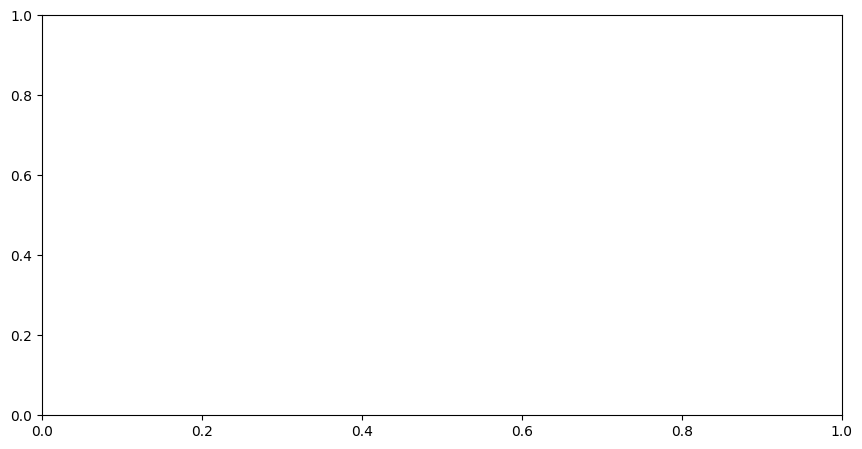

In [ ]:
fig = plt.figure(figsize=(8, 4))
ax = fig.add_axes([0, 0, 1, 1])

Теперь на созданной системе координат мы можем построить график. 

Утверждается, что коллективная вакцинация позволяет минимизировать риск заражения коронавирусной инфекцией (но только после второго компонента). Давайте проверим это на примере США: построим диаграмму рассеяния, которая покажет зависимость числа ежедневно обнаруживаемых случаев заражения (daily_confirmed) от общего количества привитых вторым компонентом вакцины (people_fully_vaccinated) в США.

Основные параметры метода scatter()

x, y — последовательности, которые будут отложены по осям абсцисс и ординат;
s — размер маркеров;
marker — вид маркеров ('o' — точки, '^' — треугольники);
c — цвет маркеров.

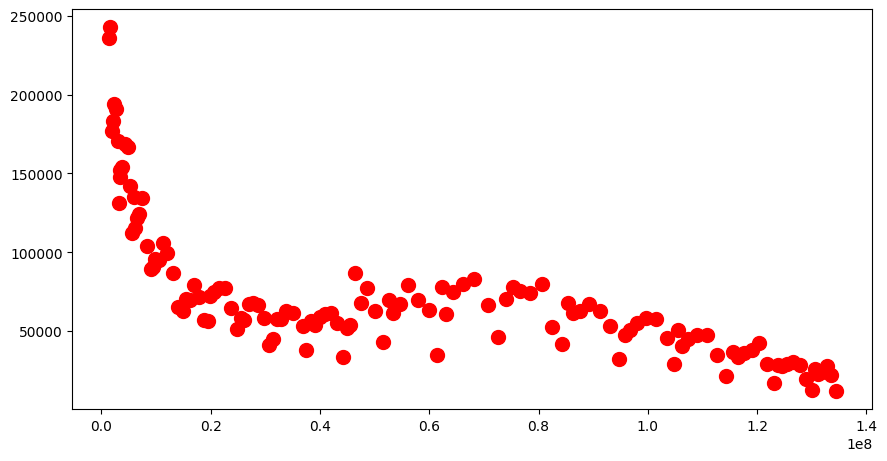

In [ ]:
# На диаграмме рассеяния по оси абсцисс откладываем суммарное число поставленных 
# вакцин, а по оси ординат — ежедневный прирост заболевших:

us_data = covid_df[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'], 
    s=100,
    marker='o',
    c = 'red'
);

Основные параметры метода pie()

x — значения, по которым будет строиться круговая диаграмма;
labels — метки, соответствующие значениям;
autopct — формат отображения долей на диаграмме (например, '%.1f%%' означает, что округление будет производиться до первого знака после запятой и при выводе будет указан знак "%"; открывающий и закрывающий проценты означают форматирование, а внутренний — вывод знака "%");
explode — последовательность, которая определяет долю смещения сектора от центра для каждого значения из x.

ТОП-10 комбинаций вакцин (vaccines) по распространённости мы находим с помощью метода value_counts(). Круговую диаграмму строим на полученных значениях, метки для каждого значения — индексы промежуточной таблицы. Будем отображать доли в процентах и округлять их до одного знака после запятой. Самую распространённую вакцину сместим на 10 % от центра:

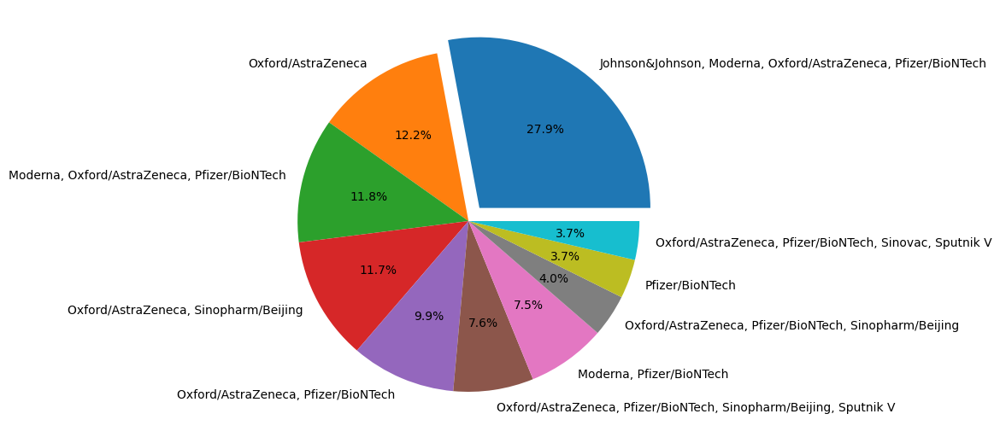

In [ ]:
vaccine_combinations = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combinations,
    labels=vaccine_combinations.index,
    autopct='%.1f%%',
    explode = [0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
);

# Добавление информативности в графики

Вы, наверное, заметили, что до этого мы не подписывали графики. График не имеет смысла, если без лишних слов непонятно, что на нём изображено. Управлять информативностью графика можно с помощью методов координатной плоскости axes. Перечислим основные из них (не пугайтесь, запоминать их не обязательно — вы всегда сможете подсмотреть их в документации):

axes.set_title() — заголовок диаграммы, а также его настройки (например, параметр fontsize отвечает за размер шрифта);
axes.set_xlabel() — название оси абсцисс;
axes.set_ylabel() — название оси ординат;
axes.set_xticks() — установка отметок на оси абсцисс;
axes.set_yticks() — установка отметок на оси ординат;
axes.xaxis.set_tick_params() — управление параметрами отметок на оси абсцисс (например, параметр rotation отвечает за поворот отметок в градусах);
axes.yaxis.set_tick_params() — управление параметрами отметок на оси ординат;
axes.legend() — отображение легенды;
axes.grid() — установка сетки.

Например, изобразим на одном графике, как росла общая заболеваемость (confirmed), число зафиксированных смертей (deaths), выздоровевших пациентов (recovered) и активных случаев (active) в Китае.

Для построения линейных графиков в Matplotlib используется метод plot() (не путайте с методом plot() в Pandas!). При вызове метода без параметров по оси ординат откладываются значения столбца таблицы, по оси абсцисс — индексы (в нашем случае это будут даты). 

Дополнительно в параметрах метода указываем параметр label — название графика, которое будет отображаться на легенде, а также lw — ширину линии графика. Добавим к графику заголовок, названия осей, установим метки по оси y с частотой в 10 000, повернём метки по оси x на 30 градусов, а также добавим легенду (метки для легенды выставляются в параметре label метода plot()):

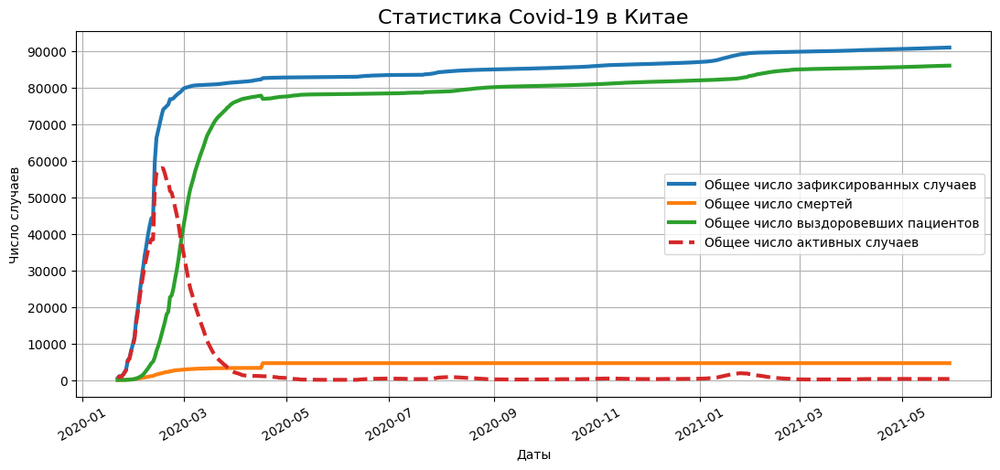

In [ ]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()

#визуализация графиков
fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.plot(china_grouped['confirmed'], label='Общее число зафиксированных случаев', lw=3)
axes.plot(china_grouped['deaths'], label='Общее число смертей', lw=3)
axes.plot(china_grouped['recovered'], label='Общее число выздоровевших пациентов', lw=3)
axes.plot(china_grouped['active'], label='Общее число активных случаев', lw=3, linestyle='dashed')

#установка параметров отображения
axes.set_title('Статистика Covid-19 в Китае', fontsize=16)
axes.set_xlabel('Даты')
axes.set_ylabel('Число случаев')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

# Использование нескольких систем координат

→ Вы можете размещать несколько систем координат на одной фигуре, что позволит нам отображать вспомогательную информацию на основном графике.

Для добавления второй системы координат необходимо повторно применить к объекту fig метод add_axes, указав новое имя для второй системы координат.

Например, отобразим ТОП-5 стран по общему числу привитых вторым компонентом людей (people_fully_vaccinated), а также ТОП-5 стран по числу полностью привитых на 100 человек населения (people_fully_vaccinated_per_hundred).

Основные параметры метода bar()

x — названия категорий, которые будут располагаться по оси абсцисс;
height — высота столбцов диаграммы, массив из показателей для визуализации (например, среднее, максимальное значение и т. д.);
width — ширина столбцов диаграммы;
color — цвет.


Группируем таблицу по странам, находим последний по дате зафиксированный показатель с помощью метода last() и выбираем ТОП-5 стран с использованием метода nlargest().

При отображении графиков создаём две координатные плоскости main_axes и insert_axes, на каждой из них отдельно строим столбчатые диаграммы.

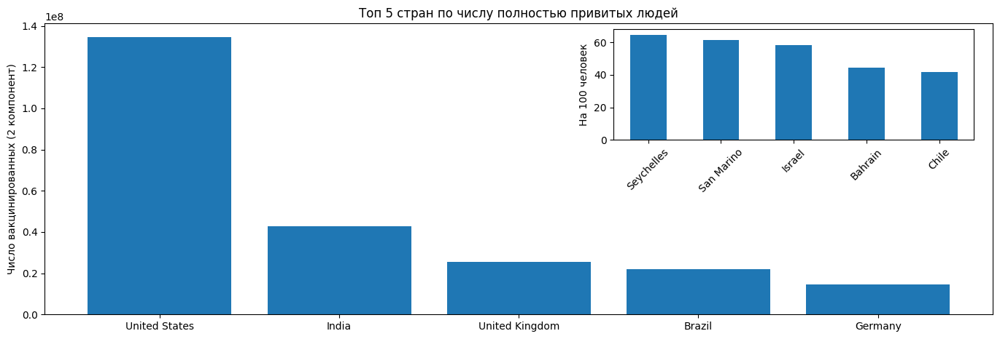

In [ ]:
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

#визуализация главного графика
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_country.index, height = vacc_country);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_title('Топ 5 стран по числу полностью привитых людей')

#визуализация вспомогательного графика
insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x = vacc_country_per_hundred.index, height = vacc_country_per_hundred, width=0.5);
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

# Subplots

Создание дополнительных систем координат с помощью метода add_axes() полезно, однако используется не так часто.

В большинстве случаев для отображения нескольких систем координат используется функция subplots(). Она создаёт целую таблицу из систем координат на одной фигуре. Функция возвращает новую фигуру, а также список координатных плоскостей.

Основные параметры метода subplots()

nrows — число строк;
ncols — число столбцов;
figsize — общий размер фигуры в дюймах (ширина и высота).

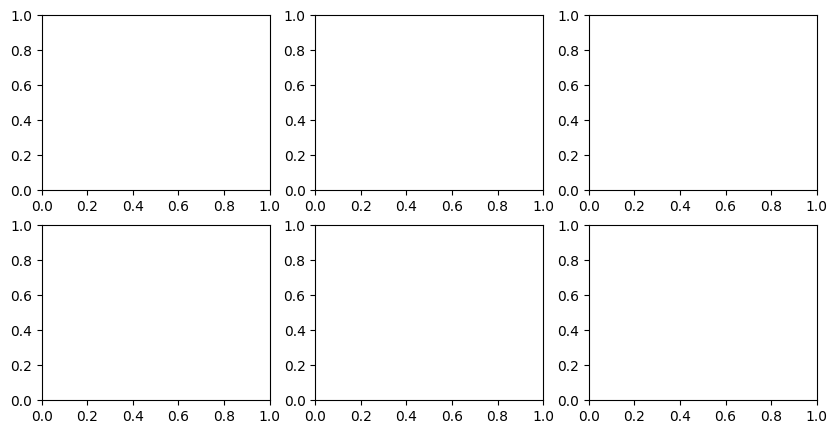

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))


Теперь, обладая знаниями о методе subplots(), построим три графика:

Столбчатую диаграмму, которая покажет динамику ежедневной вакцинации в России.
Линейный график изменения ежедневной заболеваемости в стране.
Гистограмму ежедневной заболеваемости в стране.
За построение гистограмм в библиотеке Matplotlib отвечает метод hist().

Основные параметры метода hist()

x — массив чисел, для которого строится гистограмма;
bins — число столбцов (корзин);
orientation — ориентация гистограммы (по умолчанию 'vertical');
color — цвет.

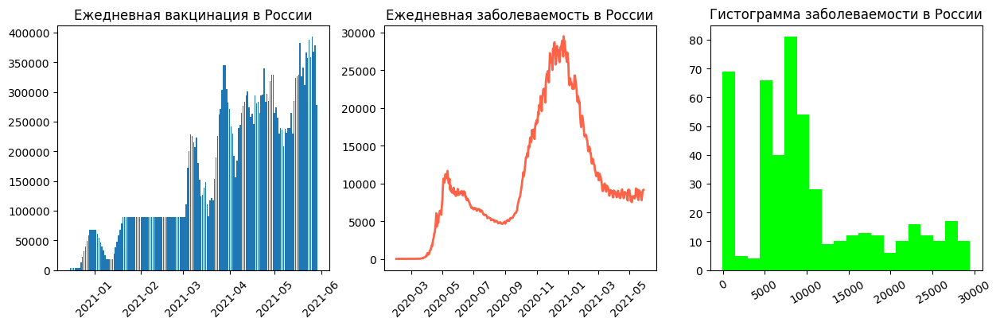

In [ ]:
russia_data = covid_df[covid_df["country"] == "Russia"]

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_data["date"],
    height=russia_data["daily_vaccinations"],
    label="Число вакцинированных",
)
axes[0].set_title("Ежедневная вакцинация в России")
axes[0].xaxis.set_tick_params(rotation=45)

# линейный график
axes[1].plot(
    russia_data["date"],
    russia_data["daily_confirmed"],
    label="Число заболевших",
    color="tomato",
    lw=2,
)
axes[1].set_title("Ежедневная заболеваемость в России")
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_data["daily_confirmed"], label=["Число заболевших"], color="lime", bins=20
)
axes[2].set_title("Гистограмма заболеваемости в России")
axes[2].xaxis.set_tick_params(rotation=30)

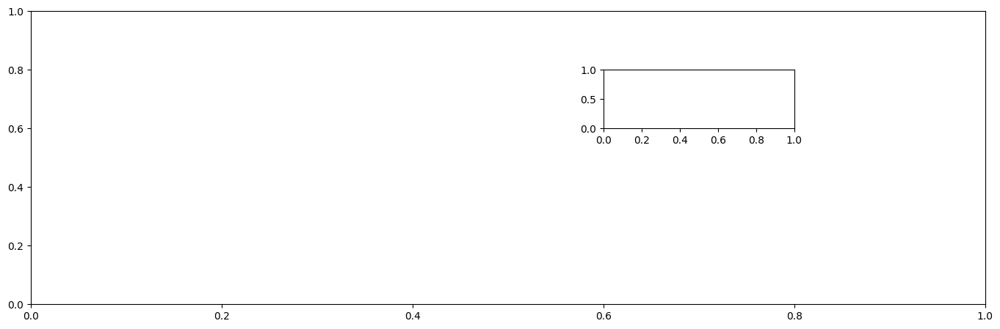

In [ ]:
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
insert_axes = fig.add_axes([0.6, 0.6, 0.2, 0.2])


## Графические возможности библиотеки Seaborn

Seaborn — надстройка над библиотекой Matplotlib, которая значительно расширяет её возможности, позволяя создавать графики более высокого уровня с эстетичным оформлением. Библиотека предоставляет большое количество дополнительных опций для творчества при визуализации данных.

Установка библиотеки стандартна. В командной строке (или командной строке Anaconda) выполните следующее:

pip install seaborn

In [ ]:
import seaborn as sns
print(sns.__version__)

0.13.2


В данном разделе мы будем сравнивать несколько стран: Россию, Австралию, Германию, Канаду и Великобританию. Создадим специальный DataFrame croped_covid_df для этих данных.

Для фильтрации по списку значений используем метод isin(), который проверяет, есть ли запись в столбце в переданном в метод списке. В результате возвращается привычная нам маска.

⭐ А теперь снова немного магии Feature Engineering, чтобы показатели по странам стали сопоставимыми: добавим информацию о населении стран, чтобы рассчитать ежедневную заболеваемость на 100 человек — заболеваемость в процентах от общего количества населения (daily_confirmed_per_hundred).

In [ ]:
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000


Начнём с гистограммы. Для визуализации гистограмм в библиотеке Seaborn используется метод histplot().

У данного метода (как и у всех методов библиотеки Seaborn) огромнейшее количество параметров. Мы приведём лишь основные.

Основные параметры метода histplot()

data — DataFrame, по которому строится график;
x — признак, который будет отложен по оси абсцисс;
y — признак, который будет отложен по оси ординат;
hue — группировочный категориальный признак, который позволяет строить отдельный график для каждой категории (не стоит использовать его для гистограмм, но он широко используется для других видов графиков в Seaborn);
ax — система координат Matplotlib, в которой строится график;
color — цвет графика;
bins — число столбцов в гистограмме (по умолчанию вычисляется автоматически с помощью специальных формул);
kde — параметр, указывающий, стоит ли сглаживать гистограмму кривой (по умолчанию False).

Построим сразу две гистограммы: одна будет иллюстрировать общее распределение ежедневной заболеваемости (daily_confirmed), а вторая — то же распределение в разрезе стран. 

Для этого создаём две координатные плоскости с помощью метода subplots(). 

На первой координатной плоскости рисуем простую гистограмму с 25 столбцами, а также добавим на неё сглаживающую кривую. 

На второй гистограмме добавляем параметр названия страны по оси y. В таком случае количество наблюдений будет обозначаться на диаграмме яркостью цвета (чем темнее полоса, тем больше наблюдений находится в интервале).

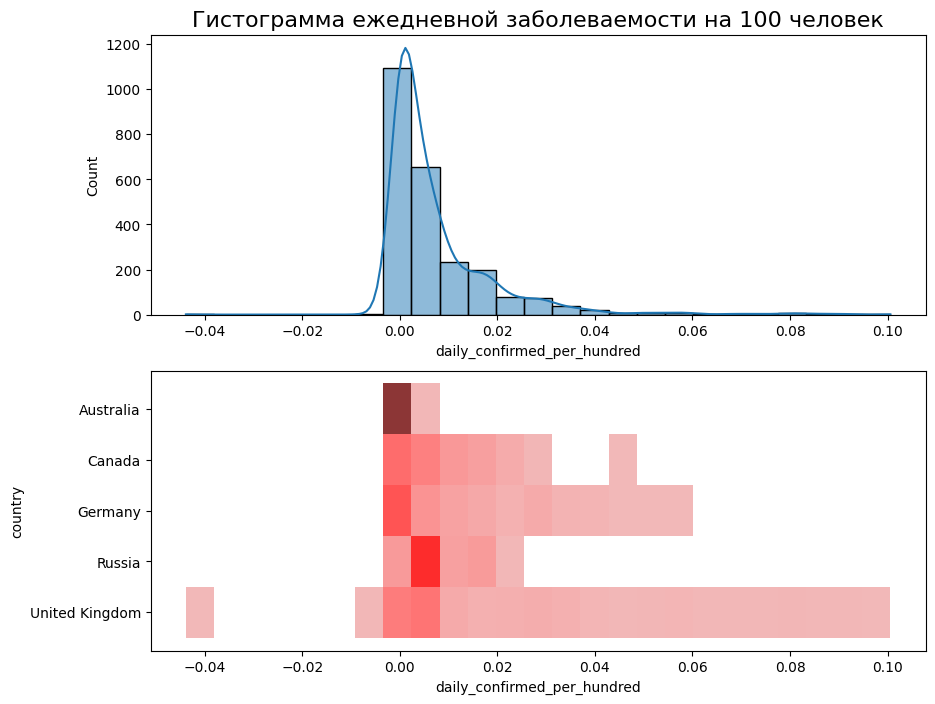

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);

Рассмотрим пример — построим коробчатые диаграммы признака летальности (death_rate), который вы создавали ранее в задании 3.3.

Коробчатые диаграммы в Seaborn строятся с помощью метода boxplot().

Ящики отразим горизонтально (для этого по оси x отложим признак летальности, а по оси y — страны), параметр orient отвечает за ориентацию диаграммы, а width — за ширину коробок:

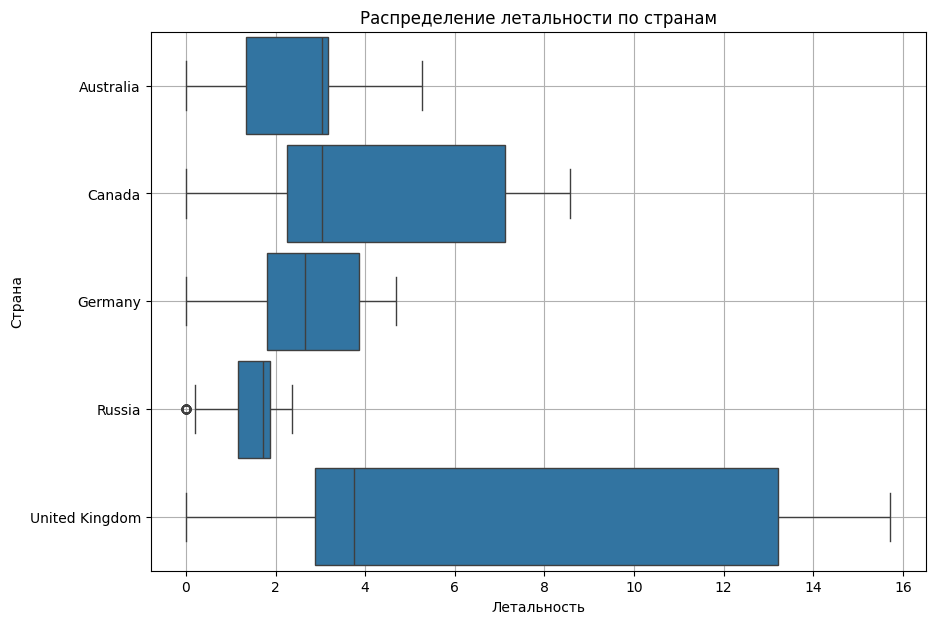

In [ ]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()

Теперь рассмотрим пример многоуровневой столбчатой диаграммы. С помощью неё мы можем, например, посмотреть на средний ежедневный процент заболевших в странах по кварталам.

Для построения столбчатых диаграмм в Seaborn используется метод barplot(). По умолчанию метод отображает среднее по столбцу, который указан в параметре x (вместо среднего можно вычислить и любую другую статистическую характеристику, наименование которой задаётся в параметре estimator). Для добавления многоуровневости используется параметр hue, который позволяет группировать данные по признаку:

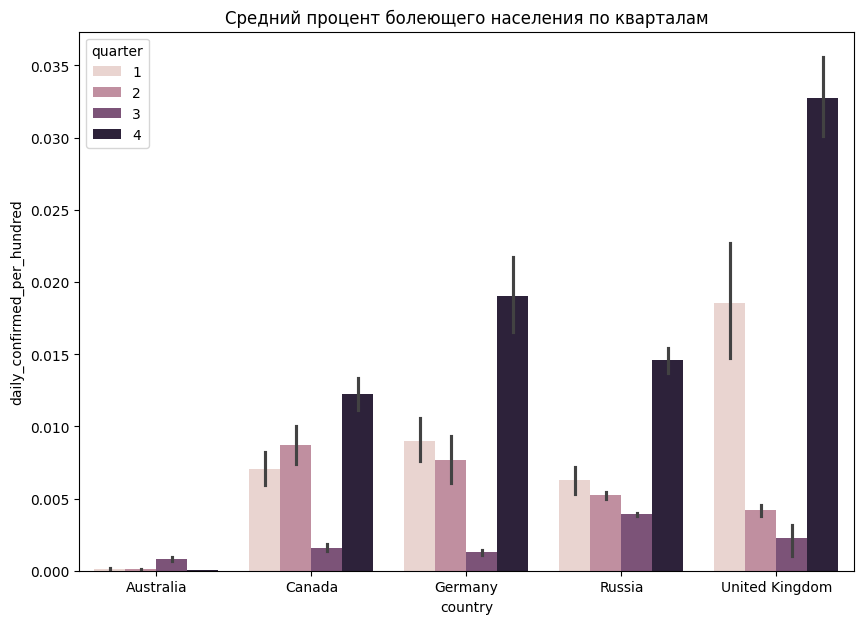

In [ ]:
fig = plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
)
barplot.set_title('Средний процент болеющего населения по кварталам');

Построим один из самых любимых дата-сайентистами графиков — jointplot() — в котором совмещены диаграмма рассеяния и гистограмма. Это довольно удобный и полезный инструмент, когда мы хотим одновременно посмотреть и на распределения переменных, и сразу оценить их взаимосвязь.

Построим jointplot зависимости ежедневной заболеваемости в странах от общей численности населения в процентах (daily_confirmed_per_hundred) от числа полностью вакцинированных в процентах (people_fully_vaccinated_per_hundred).

Параметры xlim и ylim определяют диапазон отображения осей x и y. Параметр height отвечает за высоту и ширину графика (он квадратный).

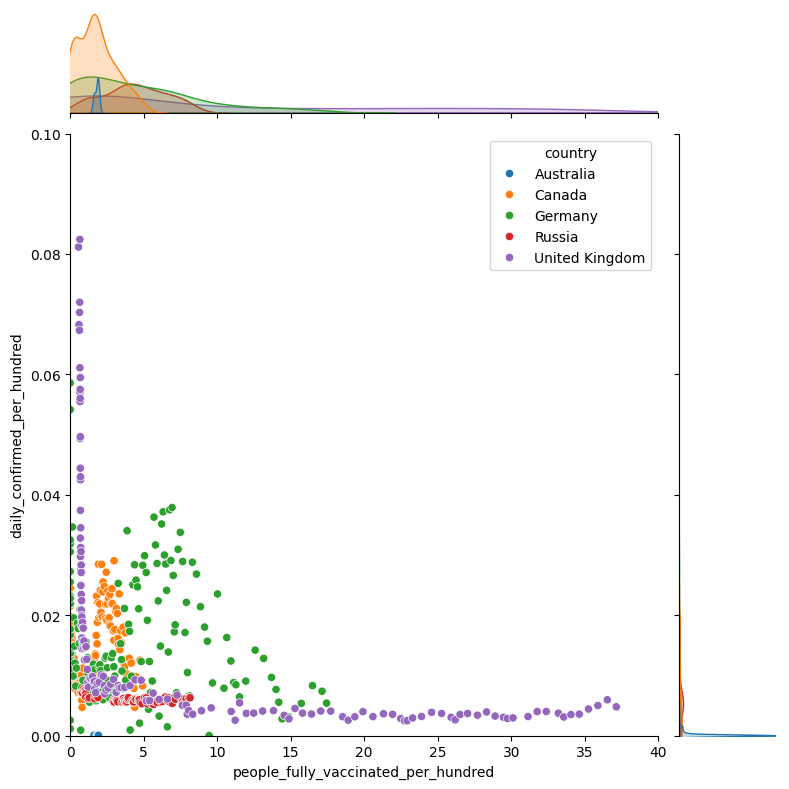

In [ ]:
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)

Допустим, мы хотим сравнить темпы вакцинации по странам во времени. Вы, скорее всего, сразу подумали о линейном графике. Но давайте мыслить шире. Когда мы хотим сравнить скорость изменения показателей по малому количеству категорий (в данном случае — по странам, а их у нас их всего пять), нагляднее всего будет тепловая карта.

Предварительно создадим сводную таблицу: по столбцам отложим признак даты, а по строкам — страны. В ячейках таблицы будет находиться процент вакцинированных (первым компонентом) людей в стране на определённую дату. Чтобы даты отображались на тепловой карте верно, их необходимо привести к типу string.

In [ ]:
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


Для построения тепловой карты в Seaborn используется метод heatmap(). Данный метод работает с табличными данными и визуализирует все ячейки таблицы с помощью цвета. Параметр annot отвечает за отображение легенды (аннотации), параметр cmap — за цветовую гамму графика.

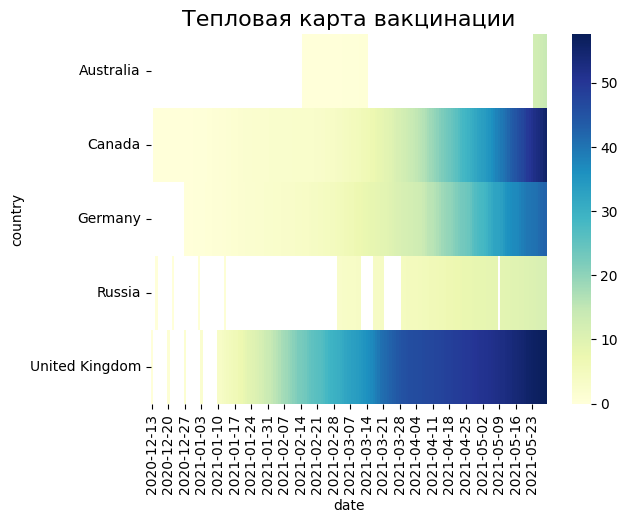

In [ ]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

Создайте новый признак confirmed_per_hundred, который покажет процентное отношение заболевших вирусом к общему числу населения в странах ().
Постройте тепловую карту, которая покажет, как росло число заболевших в процентах от общего числа населения (confirmed_per_hundred) в странах из таблицы croped_covid_df.

Text(0.5, 1.0, 'Тепловая карта заболеваемости')

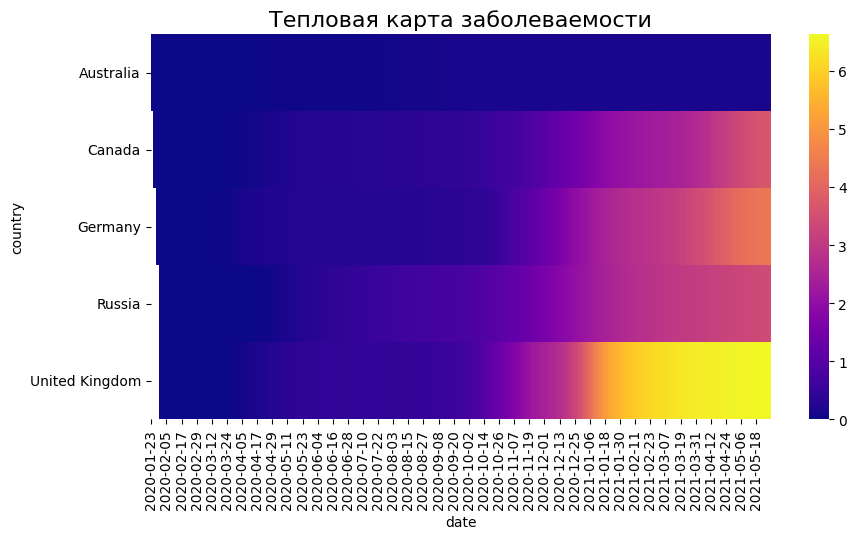

In [ ]:
croped_covid_df['confirmed_per_hundred'] = croped_covid_df['confirmed'] / croped_covid_df['population'] * 100

#Формирование таблицы для тепловой карты

# создаём сводную таблицу: столбцы  — дата, строки — страна, значения — confirmed_per_hundred
pivot = croped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
# Визуализация тепловой карты
pivot.columns = pivot.columns.astype('string')
fig = plt.figure(figsize=(10, 5))

heatmap = sns.heatmap(data=pivot, cmap='plasma')
heatmap.set_title('Тепловая карта заболеваемости', fontsize=16)

Постройте коробчатую диаграмму для признака recover_rate (отношение выздоровлений к числу зафиксированных случаев заболевания в процентах).

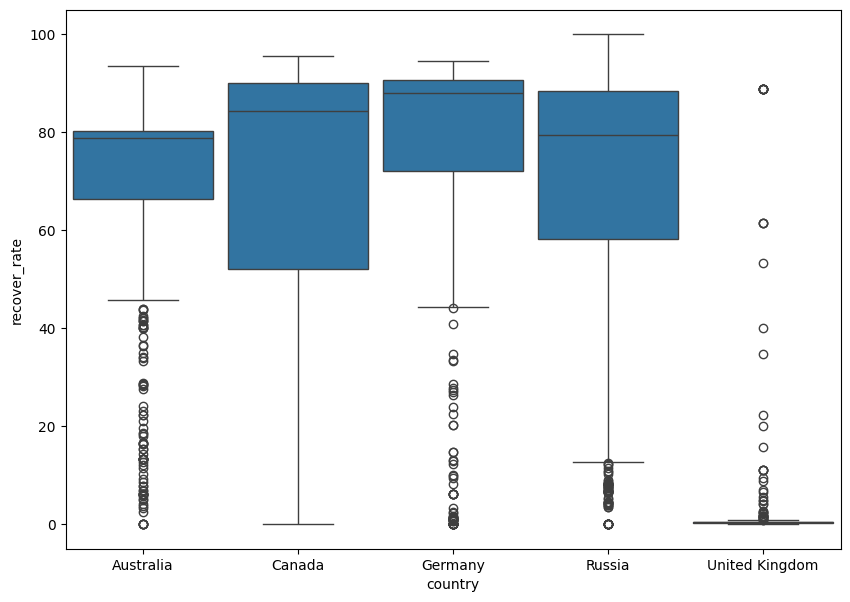

In [ ]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    x='country',
    y='recover_rate',
    orient='v',
    width=0.9
)

## Графические возможности библиотеки Plotly

Библиотека нуждается в дополнительной установке. Для этого введите в командной строке (или командной строке Anaconda) следующее:

pip install plotly
pip install --upgrade nbformat

Из библиотеки нам понадобятся модуль express, он традиционно импортируется под псевдонимом px.

In [ ]:
import plotly
import plotly.express as px
print(plotly.__version__)

6.0.1


→ Работа с plotly.express напоминает работу с библиотекой Seaborn. Отличие лишь в том, что все настройки графика (размеры, подписи осей, текста на графике) прописываются в самом методе.

С помощью экспресс-режима (px) можно строить уже знакомые нам графики:

line() — линейные графики;
histogram() — гистограммы;
scatter() — диаграммы рассеяния;
box() — коробчатые диаграммы;
bar() — столбчатые диаграммы;
pie() — круговые диаграммы.
Также есть множество других графиков — их список вы можете посмотреть в документации.


Рассмотрим процесс визуализации на примере. Посмотрим, как выглядит линейный график, построенный с помощью метода line() из модуля express. В документации к методу приведена пара десятков его параметров (они схожи с параметрами других методов) — мы приведём основные из них.

Кликните на плашку, чтобы увидеть информацию ↓

Основные параметры метода line()

data_frame — DataFrame, по которому строится график;
x — признак по оси абсцисс;
y — признак по оси ординат;
height — высота графика;
width — ширина графика;
title — название графика.

Построим график роста зафиксированного числа случаев заражения (confirmed), смертей (deaths), выздоровлений (recovered) и активных случаев (active) за всё время. Для этого просуммируем статистику по дням и передадим полученный DataFrame в метод line().

Для отображения созданной методом line() фигуры используется метод fig.show():

In [ ]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

Давайте рассмотрим ещё один пример — построим столбчатую диаграмму, показывающую ТОП-10 стран по среднему проценту выздоравливающих пациентов (recover_rate). Для этого используем метод bar() модуля express. Добавим несколько параметров:

color — группирующий признак, в соответствии с которым будут раскрашены столбцы диаграммы;
text — текст, который будет подписан на столбцах диаграммы;
orientation — ориентация графика ('v' — вертикальная, 'h' — горизонтальная).

In [ ]:
#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(10, columns=['recover_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recover_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recover_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

А теперь давайте построим что-нибудь, специфичное для библиотеки Plotly. Например, график treemap() (древесная, или иерархическая, диаграмма). Такой график используется для исследования показателя, когда число возможных категорий велико (например, число стран в таблице covid_df).

→ Данный вид диаграммы схож с круговой диаграммой и столбчатой диаграммой, однако, в отличие от них, позволяет вместить информацию о гораздо большем числе категорий, не потеряв при этом информативность.

При построении этого графика выделенное пространство разбивается на прямоугольники, соответствующие величине показателя для каждой из категорий: чем меньше прямоугольник, тем меньше в нём значение показателя.

Основные параметры метода treemap()

data_frame — DataFrame, по которому строится график;
path — категориальные признаки (их может быть несколько), в разрезе которых строится диаграмма;
values — показатель, по которому рассчитываются размеры прямоугольников.

In [ ]:
#считаем среднее ежедневно фиксируемое количество выздоровевших по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

# Анимация графиков во времени

С помощью plotly.express можно строить даже анимированные графики. Мы рассмотрим только базовые приёмы анимации, но на самом деле это очень интересная и глубокая тема. Если вы захотите, то сможете ознакомиться с ней более детально здесь и здесь.

Для нашей задачи отлично подойдёт график под названием choropleth() (тепловая картограмма) — это тепловая карта, которая строится на географической карте мира. Чтобы увидеть, как изменяется значение показателя на карте во времени, можно добавить в график анимацию.

Основные параметры метода choropleth()

data_frame — DataFrame, по которому строится график;
locations — название столбца, из которого берутся локации (столбец со странами или регионами);
locationmode — режим геопривязки; определяет, как будет производиться сопоставление данных с картой в Plotly (возможно сопоставление по названию страны, "country_name", или по её трёхзначному шифру, согласно международному стандарту ISO-3);
range_color — диапазон изменения цвета;
animation_frame — анимирующий признак, изменяя который, мы получаем визуализацию во времени;
color_continuous_scale — цветовая палитра.

Итак, построим фоновую картограмму, которая покажет распространение (confirmed) коронавируса в мире во времени.

Предварительно для правильного отображения на анимационном бегунке даты в таблице covid_df необходимо перевести обратно в строковый тип данных.

In [ ]:
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

# Трёхмерная визуализация

На самом деле общий принцип построения 3D-графиков ничем не отличается от построения обычных. Просто добавляется ещё один параметр — ось z (ось аппликат).

Давайте рассмотрим пример.

Построим 3D-диаграмму рассеяния, которая покажет, как число ежедневно обнаруживаемых случаев и число ежедневных смертей влияют на желание людей вакцинироваться. Для того чтобы нам было проще рассматривать диаграмму (точки будут более сгруппированными), построим её в логарифмическом масштабе по осям абсцисс и ординат.

Для построения такой диаграммы используем метод scatter_3d(). Добавим несколько параметров:

z — параметр по оси аппликат;
log_x — установка логарифмического масштаба по оси x;
log_y — установка логарифмического масштаба по оси y.
Чтобы не перегрузить график, будем строить зависимость только в нескольких странах: США, России, Великобритании, Бразилии и Франции. Наблюдения для каждой страны окрасим разными цветами.

In [ ]:
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()
fig.write_html("plotly/scatter_3d.html")

FileNotFoundError: [Errno 2] No such file or directory: 'plotly\\scatter_3d.html'

# Сохранение графика plotly

Чтобы сохранить интерактивный график, построенный в библиотеке Plotly, чаще всего используется метод фигуры fig.write_html('path/to/file.html'), который сохраняет график в формате HTML, после чего вы можете вставлять его на свой сайт, в веб-приложение или просто делиться им с коллегами. 

Сохраним график трёхмерной диаграммы рассеяния:

fig.write_html("plotly/scatter_3d.html")
В результате в папке plotly (которую необходимо создать заранее) у вас появится файл с графиком.

In [ ]:
fig.write_html("plotly/scatter_3d.html")

In [ ]:
line_data = covid_df.groupby('date', as_index=False)['daily_vaccinations'].sum()
fig = px.line(data_frame=line_data, x = 'date', y='daily_vaccinations')
fig.show()

Задание 7.6

Постройте анимированную тепловую картограмму для числа поставленных вакцин во всём мире (total_vaccinations). На полученной карте найдите, чему равно количество вакцинированных в Японии (Japan) на 24 марта 2021 года (2021-03-24). Ответ приведите в тысячах (без нулей) и округлите до целого числа.

Примечание. Если в jupyter notebook в VS Code не запускается анимация тепловой карты, попробуйте отобразить график командой fig.show(renderer='notebook').

In [ ]:
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="total_vaccinations", #от чего зависит цвет
    hover_name="country", #группирующая переменная
    animation_frame="date", #анимационный бегунок
    color_continuous_scale='Reds', #палитра цветов
    range_color=[0, 600e6] #диапазон цвета
)

fig.show()

## Искусство визуализации

Общие рекомендации к созданию визуализации

1
Первое и самое главное правило — график должен быть информативным и понятным. То есть любой человек, взглянув на ваш график, должен понять, что на нём изображено.

Для этого всегда подписывайте оси графика или сам график, делайте интервалы между отметками на осях, не используйте слишком много графиков на одной координатной плоскости.

2
Одна плоскость — один вид графика. Не стоит смешивать типы визуализации, это делает результат нечитабельным.

3
Принцип минимализма: чем проще график, тем лучше — не нужно добавлять сглаживающие кривые, многочисленные подписи, лишние отметки на осях, яркие, отвлекающие внимание цвета, если это не помогает вам донести идею.

4
Если тип значений всего один, легенда не нужна.

5
Не используйте сложный дизайн там, где это не требуется. Прежде чем строить для презентации 3D-график, подумайте, можно ли обойтись без него.

6
Если у вас несколько диаграмм, используйте единую цветовую гамму.

7
Время всегда указывается по горизонтальной оси слева направо. Размещайте отметки времени так, чтобы они не сливались друг с другом (например, под углом 45 градусов).

8
При построении графиков необходимо отталкиваться от их предназначения: например, не надо строить линейный график на категориальных данных — он не предназначен для этого.

Рекомендации по использованию популярных типов диаграмм

Столбчатая диаграмма

Столбчатая диаграмма (bar plot) — один из самых популярных видов графиков, однако не все исследователи используют его правильно.

→ Столбчатая диаграмма используется, когда необходимо сравнить какой-то показатель (количество, среднее, медиану) в зависимости от категориального признака (возможен вариант сравнения по датам). Это часто помогает понять, каково соотношение категорий, какая категория доминирующая. Всё это можно учитывать при построении модели, чтобы делать прогнозы более точными.

СОВЕТЫ

Не сравнивайте больше десяти категорий друг с другом с помощью столбчатой диаграммы — вам будет сложно ориентироваться в ней, особенно если диаграмма многоуровневая.

Если категорий слишком много, можно использовать иерархическую диаграмму или попробовать отразить диаграмму горизонтально (поменять параметры x и y местами). 

Ещё один вариант — объединить непопулярные категории в общую категорию «другие».

Начало точки отсчёта для значений показателя всегда 0.

Если у вас есть значения меньше 0, используйте горизонтальную столбчатую диаграмму.

Правильный
![alt text](dst3-u1-md13_8_2.png)

Неправильный
![alt text](dst3-u1-md13_8_1.png)

Линейный график

→ Линейный график (linear plot) отлично подходит, если набор данных непрерывен (как мы уже видели раньше, обычно это временной ряд). График используется для определения тенденций во временном ряду и сравнения нескольких рядов между собой.

СОВЕТЫ

Не используйте график, если набор данных дискретный (менее 20 наблюдений) — в таком случае лучше воспользуйтесь столбчатой диаграммой.

Время всегда отображается по оси абсцисс и разбивается на равные интервалы.

Если даты сливаются, используйте наклон в 45 градусов.
Не используйте график для сравнения рядов, если их больше 7-10 — график станет нечитабельным. Попробуйте уменьшить число категорий.

Например, если вам необходимо сравнить графики продаж по странам (а их у вас около 200), добавьте признак региона (например, Азия, Европа, Северная Америка и т. д.) и сравнивайте временные ряды в его разрезе. Когда вы выявите лидера по продажам среди регионов, можете вернуться к сравнению стран внутри этого региона.

Правильный
![alt text](dst3-u1-md13_8_4.png)

Неправильный
![alt text](dst3-u1-md13_8_3.png)

Гистограмма

→ Гистограммы (histogram) часто применяются для разведывательного анализа данных (EDA), так как они дают информацию о распределении признака. С их помощью можно сразу определить диапазон изменения признака, его модальное значение (пик гистограммы), а также найти «пеньки», которые выбиваются от непрерывного распределения гистограммы, — аномалии.

СОВЕТЫ

Не стоит строить гистограмму, если наблюдений мало — распределение окажется далёким от действительного и вы просто сделаете ложные выводы. По статистике, для того, чтобы гистограмма хоть как-то оценивала истинное распределение, нужно как минимум 30 наблюдений (на практике нужно хотя бы 100).

Попробуйте (ради эксперимента) построить пять-семь гистограмм на одном графике для их сравнения по категориям (например, страны). ⛔ На практике так делать не нужно. Для сравнения параметров распределений по категориям предназначена коробчатая диаграмма (boxplot).

Если вы всё же хотите сравнить гистограммы между собой, предварительно обязательно приведите признаки к одной шкале (мы делали это, когда сравнивали ежедневную заболеваемость коронавирусом в процентах от населения страны). Если этого не сделать, распределения окажутся несопоставимыми.

Например, что значит 1 млн заболевших в день для Китая с населением в 1.5 млрд человек? А что значит такая же цифра для Ватикана, население которого меньше 1 тыс. человек? Вероятно, суть ясна.

После того как вы привели все признаки к одной шкале, лучше используйте цветовую гистограмму, которая показывает частоту интенсивностью цвета (загляните в юнит по Seaborn, если забыли). Да, она не покажет высоту столбцов в цифрах, но зато вы сможете визуально сравнить категории между собой и избежать наложения гистограмм друг на друга.

Правильный
![alt text](dst3-u1-md13_8_6.png)

Неправильный
![alt text](dst3-u1-md13_8_5.png)

Диаграмма рассеяния

→ Диаграмма рассеяния (scatter plot) и её производные — jointplot (гистограммы с рассеянием), kdeplot (диаграмма плотностей) и bubble plot (пузырьковая диаграмма) — предназначены для выявления взаимосвязи между двумя (или в случае 3D — тремя) признаками.

Можно добавлять в график расцветку по одному категориальному признаку, а тип или размер маркеров — по другому. Итого мы сможем наблюдать взаимосвязь нескольких признаков (до пяти).

СОВЕТЫ

Не используйте диаграммы рассеяния на маленьком наборе данных. Здесь ситуация та же, что и с гистограммами.

Не стоит использовать расцветку и размер точек для признаков с большим числом уникальных категорий.

В случае если вы не видите зависимостей в данных, попробуйте использовать логарифмическую шкалу по оси абсцисс (по оси абсцисс и ординат в случае 3D-графика). Во всех библиотеках в методе есть параметр log, значение которого нужно установить на True.

?
Почему логарифмическая шкала?

Ответ, конечно же, кроется в математике. Если говорить, не вдаваясь в подробности, функция логарифма, во-первых, отбрасывает отрицательные значения, а во-вторых, «приземляет» более высокие значения — зависимость становится более гладкой, и её становится легче просматривать. При этом логарифмирование не искажает исходную зависимость: то есть если на исходных данных был тренд роста признака А от признака Б, то на логарифмированных данных этот тренд сохранится.

Правильный
![alt text](dst3-u1-md13_8_8.png)

Неправильный
![alt text](dst3-u1-md13_8_7.png)

Круговая диаграмма

→ Круговая диаграмма (pie chart) показывает структуру признака, то есть процентную долю каждого из возможных значений признака. 

Вы можете столкнуться с ней, например, когда захотите отобразить соотношение классов в данных или вклад отдельных компонентов в общую прибыль.

СОВЕТЫ

Сумма значений в круге всегда должна равняться единице, то есть всегда должно быть целое и его части (например, отношение числа заболевших вирусом по странам к общему количеству населения).

С помощью круговой диаграммы нельзя сравнить средний чек в ресторанах — эти средние не являются частью единого целого. Однако можно сравнить число сотрудников в этих ресторанах, так как они являются частью одной совокупности.

Не визуализируйте секторы, близкие к 0, — их невозможно сравнить друг с другом.

Не делайте больше 6-8 секторов — воспринимать информацию будет сложно. Если компонентов больше, выделите ТОП-6-8, а остальные обозначьте как «прочие».

Всегда отображайте легенду либо подписи категорий внутри секторов.
Если важно выделить часть графика, «вытащите» его из центра.

Правильная
![alt text](dst3-u1-md13_8_10.png)

Неправильная
![alt text](dst3-u1-md13_8_9.png)

Схема выбора типа визуализации

Наконец, в завершение темы визуализации предлагаем вам ознакомиться со схемой, на которую вы можете ориентироваться при выборе типа визуализации для своих реальных задач:

Примечание. В основном все перечисленные типы визуализации вам уже знакомы, а те, что не знакомы, являются небольшими модификациями знакомых.

Так, пончиковая диаграмма является модификацией круговой и предназначена для отображения многоуровневой группировки.

Диаграмма областей является версией линейного графика и позволяет оценить вклад каждого компонента в рассматриваемый процесс.

Водопадная диаграмма — это разновидность столбчатой диаграммы. Она используются для понимания, как некоторая группа факторов, например реклама, найм новых сотрудников и скидки, повлияла на начальное значение исследуемого показателя (прибыли).

В этом модуле мы с вами будем работать с данными с самого настоящего соревнования на платформе Kaggle, инициатором которого стал Сбер. Соревнование проводилось в 2017 году, его призовой фонд составил 25 000 $. Требования Сбера состояли в построении модели, которая бы прогнозировала цены на жильё в Москве, опираясь на параметры самого жилья, а также состояние экономики и финансового сектора в стране.

Датасет представляет собой набор данных из таблицы с информацией о параметрах жилья (train.csv). В ней содержатся 292 признака о состоянии экономики России на момент продажи недвижимости (macro.csv). 

Для упрощения техники очистки данных мы будем отрабатывать на урезанном датасете.

In [17]:
# Импортируем библиотеки, которые нам понадобятся 
# (pandas для работы с данными, numpy для математических
# преобразований, matplotlib и seaborn для визуализации):

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Прочитаем наши данные и выведем первые пять строк
# таблицы с помощью head(), чтобы убедиться в том, что всё
# подгрузилось верно:

sber_data = pd.read_csv('data/sber_data.csv')
sber_data.head()

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
0,1,43,27.0,4.0,Bibirevo,5001.0,5,11065.0,5,0,...,0.637189,0.947962,0.177975,0.625783,0.628187,14.053047,7.389498,good,0,5850000
1,2,34,19.0,3.0,Nagatinskij Zaton,3119.0,5,6237.0,8,0,...,0.688796,1.072315,0.273345,0.967821,0.471447,6.829889,0.709260,excellent,0,6000000
2,3,43,29.0,2.0,Tekstil'shhiki,1463.0,4,5580.0,7,0,...,1.543049,0.391957,0.158072,3.178751,0.755946,4.273200,3.156423,poor,0,5700000
3,4,89,50.0,9.0,Mitino,6839.0,9,17063.0,10,0,...,0.934273,0.892674,0.236455,1.031777,1.561505,16.990677,16.041521,good,0,13100000
4,5,77,77.0,4.0,Basmannoe,3240.0,7,7770.0,9,0,...,0.077901,0.810801,0.376838,0.378756,0.121681,1.112486,1.800125,excellent,0,16331452


In [ ]:
# Дополнительно посмотрим на последние пять строк таблицы 
# с помощью tail():

display(sber_data.tail())

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
30466,30469,44,27.0,7.0,Otradnoe,5088.0,4,12721.0,4,0,...,1.103579,0.167718,0.349899,1.235066,0.612359,7.482165,4.836787,good,0,7400000
30467,30470,86,59.0,3.0,Tverskoe,1874.0,4,6772.0,4,1,...,0.069986,0.086552,0.362681,0.850385,0.310021,0.778428,1.450108,poor,0,25000000
30468,30471,45,NaN,10.0,Poselenie Vnukovskoe,NaN,0,NaN,0,0,...,4.338453,1.339078,1.234235,1.192543,1.186621,13.459593,9.890758,no data,0,6970959
30469,30472,64,32.0,5.0,Obruchevskoe,2372.0,6,6083.0,8,0,...,1.204798,1.340017,0.130667,1.644053,0.476021,2.088193,4.119706,satisfactory,0,13500000
30470,30473,43,28.0,1.0,Novogireevo,2215.0,4,5824.0,4,0,...,2.108265,0.825811,0.378950,0.480531,0.867332,0.688707,0.127867,poor,0,5600000


In [ ]:
display(sber_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30471 entries, 0 to 30470
Data columns (total 61 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     30471 non-null  int64  
 1   full_sq                                30471 non-null  int64  
 2   life_sq                                24088 non-null  float64
 3   floor                                  30304 non-null  float64
 4   sub_area                               30471 non-null  object 
 5   preschool_quota                        23783 non-null  float64
 6   preschool_education_centers_raion      30471 non-null  int64  
 7   school_quota                           23786 non-null  float64
 8   school_education_centers_raion         30471 non-null  int64  
 9   school_education_centers_top_20_raion  30471 non-null  int64  
 10  hospital_beds_raion                    16030 non-null  float64
 11  he

None

Задание 2.2

Сколько районов Москвы и Московской области представлено в данных?

In [ ]:
# Подсчёт уникальных значений в столбце 'sub_area'
unique_sub_areas = sber_data['sub_area'].nunique()

print(f'В данных представлено {unique_sub_areas} уникальных районов.')

В данных представлено 146 уникальных районов.


Задание 2.3

Чему равна максимальная цена квартир (price_doc)? Введите это число полностью, без округлений.

Присмотритесь к нему — не кажется ли оно вам странным? Мы к нему ещё вернемся :)

In [ ]:
# Подсчёт максимальной цены квартир (price_doc)
price_sub_areas = sber_data['price_doc'].max()
print(price_sub_areas)

111111112


Задание 2.4

Проверим, влияет ли уровень экологической обстановки в районе на цену квартиры. Постройте коробчатую диаграмму цен на квартиры (price_doc) в зависимости от уровня экологической обстановки в районе (ecology). Какой уровень ценится на рынке меньше всего?

ответ: "no data"

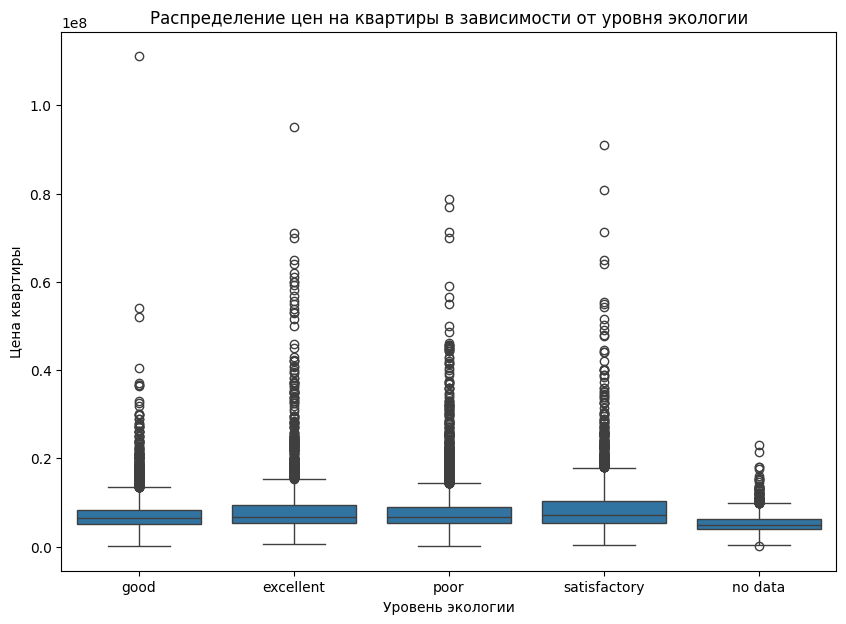

In [ ]:
# Установка размеров фигуры
plt.figure(figsize=(10, 7))

# Построение коробчатой диаграммы
sns.boxplot(
    data=sber_data,
    x='ecology',
    y='price_doc'
)

# Добавление заголовка и подписей осей
plt.title('Распределение цен на квартиры в зависимости от уровня экологии')
plt.xlabel('Уровень экологии')
plt.ylabel('Цена квартиры')

# Отображение графика
plt.show()

Задание 2.5

Постройте диаграмму рассеяния, которая покажет, как цена на квартиру (price_doc) связана с расстоянием до центра Москвы (kremlin_km). Выберите все верные утверждения.

Text(0, 0.5, 'Цена на квартиру')

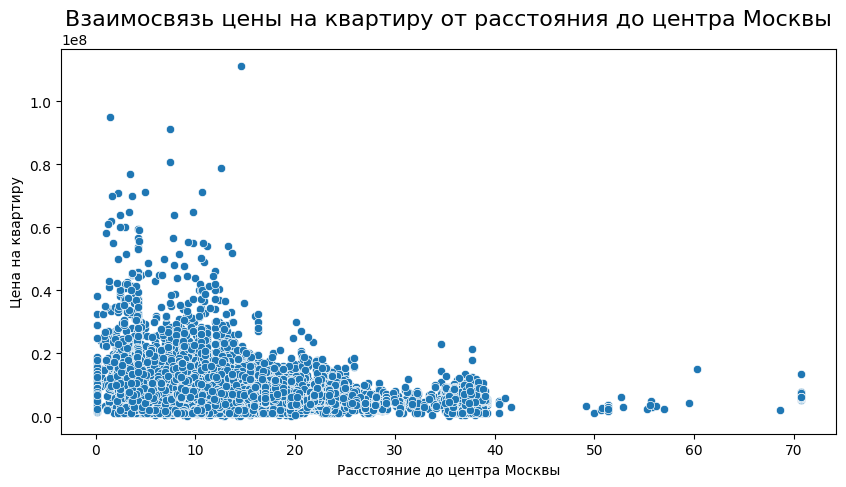

In [ ]:
fig = plt.figure(figsize=(10, 5))

scatterplot = sns.scatterplot(
    data=sber_data,
    x='kremlin_km',
    y='price_doc',
)
scatterplot.set_title('Взаимосвязь цены на квартиру от расстояния до центра Москвы', fontsize=16)
scatterplot.set_xlabel('Расстояние до центра Москвы')
scatterplot.set_ylabel('Цена на квартиру')

Дополнительные улучшения:

Добавление полупрозрачности точек:

Чтобы избежать наложения точек и лучше визуализировать плотность данных, можно установить параметр alpha (например, alpha=0.5).​

Использование цветовой палитры:

Для улучшения визуального восприятия можно задать параметр color, например, color='blue'.

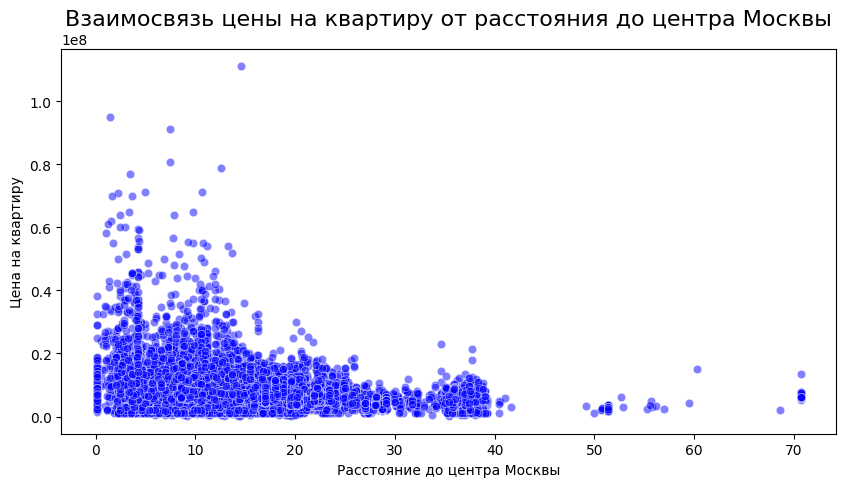

In [ ]:
# Код с дополнительными улучшениями:

# Установка размера фигуры
plt.figure(figsize=(10, 5))

# Построение диаграммы рассеяния
scatterplot = sns.scatterplot(
    data=sber_data,
    x='kremlin_km',
    y='price_doc',
    alpha=0.5,
    color='blue'
)

# Настройка заголовка и подписей осей
scatterplot.set_title('Взаимосвязь цены на квартиру от расстояния до центра Москвы', fontsize=16)
scatterplot.set_xlabel('Расстояние до центра Москвы')
scatterplot.set_ylabel('Цена на квартиру')

plt.show()

# Работа с пропусками: как их обнаружить?

В pandas пропуски обозначаются специальным символом NaN (Not-a-Number — «не число»). 

Чем так плохи пропуски, почему так важно их предобработать?

Ответ очень прост: преобладающее большинство моделей машинного обучения не умеют обрабатывать пропуски, так как они работают только с числами. Если в данных содержится пустая ячейка таблицы, модель выдаст ошибку. 

Причины появления пропусков в данных

- Ошибка ввода данных. Как правило, такая ошибка обусловлена человеческим фактором: никто не застрахован от случайного пропуска графы при заполнении данных.

- Ошибка передачи данных. Эта причина на сегодняшний момент возникает довольно редко: с появлением протоколов проверки выгружаемой информации потерять данные при передаче их по сети становится сложнее, но вероятность такого события ненулевая.

- Намеренное сокрытие информации. Одна из самых распространённых причин, особенно в социологических опросах. Дело в том, что пользователи/опрашиваемые/клиенты часто скрывают информацию о себе. Например, люди, занимающие высокие должности, могут быть связаны контрактом о неразглашении своих доходов. 

- Прямое отсутствие информации. Эта причина очень распространена в данных для рекомендательных систем. Представьте, что у нас есть таблицы фильмов и пользователей, которые просматривают их и ставят им оценки. Мы объединяем всю информацию в одну большую сводную таблицу: например, по строкам идут пользователи, а по столбцам — фильмы. Но вот незадача: у нас нет информации о рейтингах фильмов, которые пользователь ещё не посмотрел. В таком случае на пересечении строки с именем пользователя и столбца с названием фильма, который он ещё не смотрел, ставится пропуск. Главное несчастье состоит в том, что 99 % процентов такой таблицы — это сплошной пропуск.

- Мошенничество. Очень острая проблема в финансовой сфере, особенно в банковских данных. Мошенники нередко указывают ложную информацию или не указывают её вовсе.

## Как обнаружить пропуски?

Ранее мы определяли наличие пропусков в данных с помощью метода info(). Но этот метод не позволяет точно локализовать места пропущенных значений, он выводит только число непустых значений и предназначен для определения факта наличия пропусков:

Найти пропуски зачастую довольно просто за исключением тех случаев, когда пропуски скрыты.

В библиотеке pandas специально для этого реализован метод isnull(). Этот метод возвращает новый DataFrame, в ячейках которого стоят булевы значения True и False. True ставится на месте, где ранее находилось значение NaN.

In [ ]:
display(sber_data.isnull().tail())

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
30466,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30467,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30468,False,False,True,False,False,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
30469,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
30470,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


✍️ Как вы сами понимаете, результат метода isnull() — это, мягко говоря, не самый удобный метод поиска пропусков, однако он является промежуточным этапом других способов, которые мы рассмотрим далее.

## Список столбцов с пропусками

Первый способ — это вывести на экран названия столбцов, где число пропусков больше 0. 

Для этого вычислим средний по столбцам результат метода isnull(). Получим долю пропусков в каждом столбце.

Умножаем на 100 %, находим столбцы, где доля пропусков больше 0, сортируем по убыванию и выводим результат:

In [ ]:
cols_null_percent = sber_data.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display(cols_with_null)

hospital_beds_raion          47.392603
preschool_quota              21.948738
school_quota                 21.938893
life_sq                      20.947786
floor                         0.548062
metro_min_walk                0.082045
metro_km_walk                 0.082045
railroad_station_walk_km      0.082045
railroad_station_walk_min     0.082045
dtype: float64

Итак, можно увидеть, что у нас большое число пропусков (более 47 %) в столбце hospital_beds_raion (количество больничных коек в округе). 

Далее у нас идут столбцы с числом пропусков чуть больше 20 %: 

- preschool_quota (число мест в детском саду в районе);
- school_quota (число мест в школах в районе);
- life_sq (жилая площадь здания в квадратных метрах). 
Менее одного процента пропусков содержат признаки:

- floor (число этажей в доме);
- metro_min_walk (время от дома до ближайшего метро пешком в минутах);
- metro_km_walk (расстояние до ближайшего метро в километрах);
- railroad_station_walk_km (расстояние до ближайшей ж. д. станции в километрах);
- railroad_station_walk_min (время до ближайшей ж. д. станции пешком в минутах). 

## Столбчатая диаграмма пропусков

Иногда столбцов с пропусками становится слишком много и прочитать информацию о них из списка признаков с цифрами становится слишком затруднительно — цифры начинают сливаться воедино. 

Можно воспользоваться столбчатой диаграммой, чтобы визуально оценить соотношение числа пропусков к числу записей. Самый быстрый способ построить её — использовать метод plot():

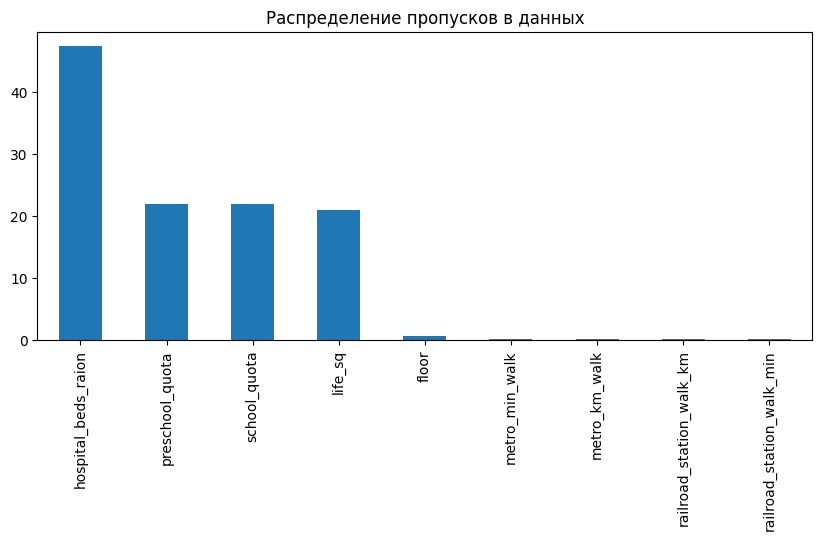

In [ ]:
cols_with_null.plot(
    kind='bar',
    figsize=(10, 4),
    title='Распределение пропусков в данных'
);

На диаграмме мы видим те же соотношения, что и раньше, но представленные в удобном для визуального восприятия формате. Из неё отчётливо видно, что число пропусков в столбце hospital_beds_raion превышает 45 %. Также мы видим признаки с числом пропусков близ 0.

## Тепловая карта пропусков 

Ещё один распространённый способ визуализации пропусков — тепловая карта. 

Её часто используют, когда столбцов с пропусками не так много (меньше 10). Она позволяет понять не только соотношение пропусков в данных, но и их характерное местоположение в таблице. 

Для создания такой тепловой карты можно воспользоваться результатом метода isnull(). Ячейки таблицы, в которых есть пропуск, будем отмечать жёлтым цветом, а остальные — синим. Для этого создадим собственную палитру цветов тепловой карты с помощью метода color_pallete() из библиотеки seaborn.

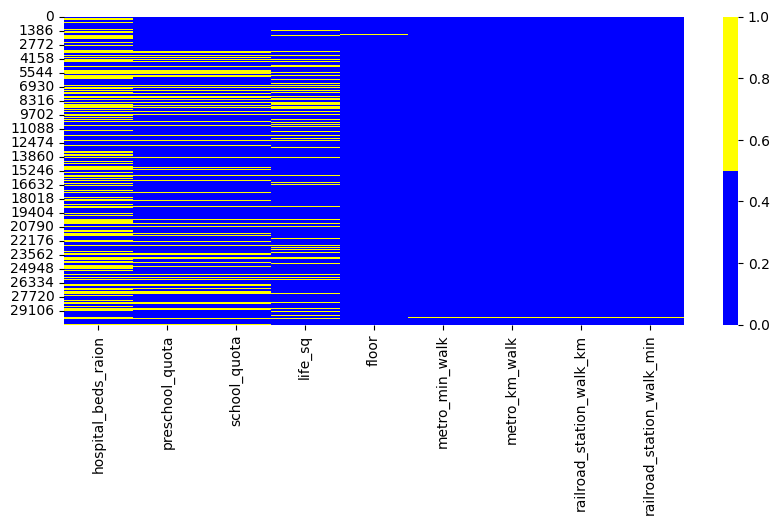

In [ ]:
colors = ['blue', 'yellow'] 
fig = plt.figure(figsize=(10, 4))
cols = cols_with_null.index
ax = sns.heatmap(
    sber_data[cols].isnull(),
    cmap=sns.color_palette(colors),
)

На полученной тепловой карте мы не видим чётких процентных соотношений для числа пропусков в данных, однако мы можем увидеть места их концентрации в таблице. Например, видно, что признаки preschool_quota и school_quota очень сильно связаны друг с другом по части пропусков: во всех записях, где хотя бы один не определён, не указан и второй (жёлтые линии для двух этих признаков полностью совпадают друг с другом).

# Работа с пропусками: методы обработки

## Методы обработки пропущенных значений

Наибольшая сложность в очистке данных от пропусков заключается в выборе метода их обработки. Все методы, которые мы рассмотрим, по сути являются простыми эвристиками, без математического обоснования. 

Не существует общего решения проблемы с отсутствующими данными. Для каждого конкретного случая приходится подбирать наиболее подходящие методы или их комбинации. При этом каждая модель уникальна и часто предполагает случайность, поэтому невозможно предсказать заранее, какая комбинация методов сработает на ваших данных лучше всего.

Однако не стоит расстраиваться! Мы рассмотрим главные рекомендации по методам, которые позволят вам работать с пропусками, как минимум, не испортив ваши данные.

### Отбрасывание записей и признаков

Первая техника — самая простая из всех. Она предполагает простое удаление записей или признаков, в которых содержатся пропуски. 

Здесь важно правильно выбрать ось удаления: если мы избавимся от большого числа строк, то рискуем потерять важные данные, а если мы удалим столбцы, то можем потерять важные признаки.

!!!!Специалисты рекомендуют при использовании метода удаления придерживаться следующих правил: удаляйте столбец, если число пропусков в нем более 30-40 %. В остальных случаях лучше удалять записи.

Для удаления строк и столбцов будем использовать метод dropna(), который позволяет удалять пропуски с тонким подходом к настройке. 

Основные параметры метода:

axis — ось, по которой производится удаление (по умолчанию 0 — строки).
how — как производится удаление строк (any — если хотя бы в одном из столбцов есть пропуск, стоит по умолчанию; all — если во всех столбцах есть пропуски). 
thresh — порог удаления. Определяет минимальное число непустых значений в строке/столбце, при котором она/он сохраняется. Например, если мы установим thresh в значение 2, то мы удалим строки, где число пропусков больше чем n-2, где  n — число признаков (если axis=0).

!!!Примечание: Начиная с версии 1.5.0 Pandas запрещает одновременно устанавливать параметры how и thresh. При использовании этих параметров одновременно возникает ошибка:
TypeError: You cannot set both the how and thresh arguments at the same time.
Это связано с тем, что, например, если установить параметр how='all' и установить thresh в какое-то конкретное значение, то возникает противоречие: мы будем пытаться удалить столбцы/строки, одновременно при условии, что во всех столбцах/строках есть пропуски, но при этом стоит ограничение константой thresh. Метод dropna() не понимает, как действовать - какое ограничение принять за основное в таких случаях - и поэтому в новой версии библиотеки было решено запретить формирование таких условий.

- Предварительно создадим копию исходной таблицы — drop_data, чтобы не повредить её. Зададимся порогом в 70 %: будем оставлять только те столбцы, в которых 70 и более процентов записей не являются пустыми . После этого удалим записи, в которых содержится хотя бы один пропуск. Наконец, выведем информацию о числе пропусков и наслаждаемся нулями. 

In [ ]:
#создаем копию исходной таблицы
drop_data = sber_data.copy()
#задаем минимальный порог: вычисляем 70% от числа строк
thresh = drop_data.shape[0]*0.7
#удаляем столбцы, в которых более 30% (100-70) пропусков
drop_data = drop_data.dropna(thresh=thresh, axis=1)#удаляем записи, в которых есть хотя бы 1 пропуск
drop_data = drop_data.dropna(how='any', axis=0)
#отображаем результирующую долю пропусков
drop_data.isnull().mean()

id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [ ]:
# Посмотрим на результирующее число записей:


print(drop_data.shape)

(20888, 60)


?
Итак, мы удалили один столбец и ⅓ всех записей для того, чтобы избавиться от пропусков. Не слишком ли это много и что с этим можно сделать?

### Заполнение недостающих значений константами

Чтобы дырявая бочка не протекала, вставьте в дырку пробку. С этой мыслью связан другой способ бороться с пропусками — заполнение константами. 

Чаще всего пустые места заполняют средним/медианой/модой для числовых признаков и модальным значением для категориальных признаков. 

![alt text](dst-3-unit-1-mod-14-12.png)

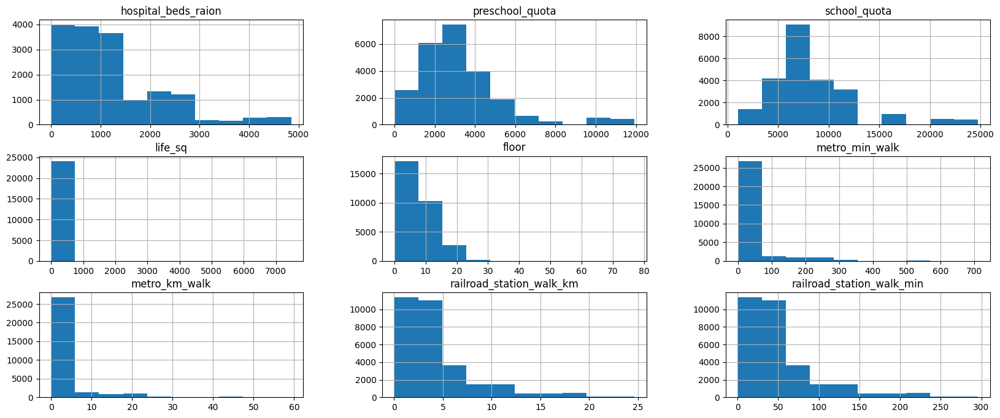

In [ ]:
# Вся сложность заключается в выборе метода заполнения. 
# Важным фактором при выборе метода является распределение
# признаков с пропусками. Давайте выведем их на экран. 

# В pandas это можно сделать с помощью метода hist():


cols = cols_with_null.index
sber_data[cols].hist(figsize=(20, 8));

Итак, рассмотрим несколько рекомендаций.

1. Для распределений, похожих на логнормальное, где пик близ нуля, а далее наблюдается постепенный спад частоты, высока вероятность наличия выбросов (о них мы поговорим чуть позже). Математически доказывается, что среднее очень чувствительно к выбросам, а вот медиана — нет. Поэтому предпочтительнее использовать медианное значение для таких признаков.

2. Если признак числовой и дискретный (например, число этажей, школьная квота), то их заполнение средним/медианой является ошибочным, так как может получиться число, которое не может являться значением этого признака. Например, количество этажей — целочисленный признак, а расчёт среднего может дать 2.871. Поэтому такой признак заполняют либо модой, либо округляют до целого числа (или нужного количества знаков после запятой) среднее/медиану.

3. Категориальные признаки заполняются либо модальным значением, либо, если вы хотите оставить информацию о пропуске в данных, значением 'unknown'. На наше счастье, пропусков в категориях у нас нет.

4. Иногда в данных бывает такой признак, основываясь на котором, можно заполнить пропуски в другом. Например, в наших данных есть признак full_sq (общая площадь квартиры). Давайте исходить из предположения, что, если жилая площадь (life_sq) неизвестна, то она будет равна суммарной площади!

Заполнение значений осуществляется с помощью метода fillna(). Главный параметр метода — value (значение, на которое происходит заполнение данных в столбце). Если метод вызывается от имени всего DataFrame, то в качестве value можно использовать словарь, где ключи — названия столбцов таблицы, а значения словаря — заполняющие константы. 

Создадим такой словарь, соблюдая рекомендации, приведённые выше, а также копию исходной таблицы. Произведём операцию заполнения с помощью метода fillna() и удостоверимся, что пропусков в данных больше нет:

In [ ]:
#создаем копию исходной таблицы
fill_data = sber_data.copy()
#создаем словарь имя столбца: число(признак) на который надо заменить пропуски
values = {
    'life_sq': fill_data['full_sq'],
    'metro_min_walk': fill_data['metro_min_walk'].median(),
    'metro_km_walk': fill_data['metro_km_walk'].median(),
    'railroad_station_walk_km': fill_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min': fill_data['railroad_station_walk_min'].median(),
    'hospital_beds_raion': fill_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': fill_data['preschool_quota'].mode()[0],
    'school_quota': fill_data['school_quota'].mode()[0],
    'floor': fill_data['floor'].mode()[0]
}
#заполняем пропуски в соответствии с заявленным словарем
fill_data = fill_data.fillna(values)
#выводим результирующую долю пропусков
fill_data.isnull().mean()

id                   0.0
full_sq              0.0
life_sq              0.0
floor                0.0
sub_area             0.0
                    ... 
theater_km           0.0
museum_km            0.0
ecology              0.0
mosque_count_1000    0.0
price_doc            0.0
Length: 61, dtype: float64

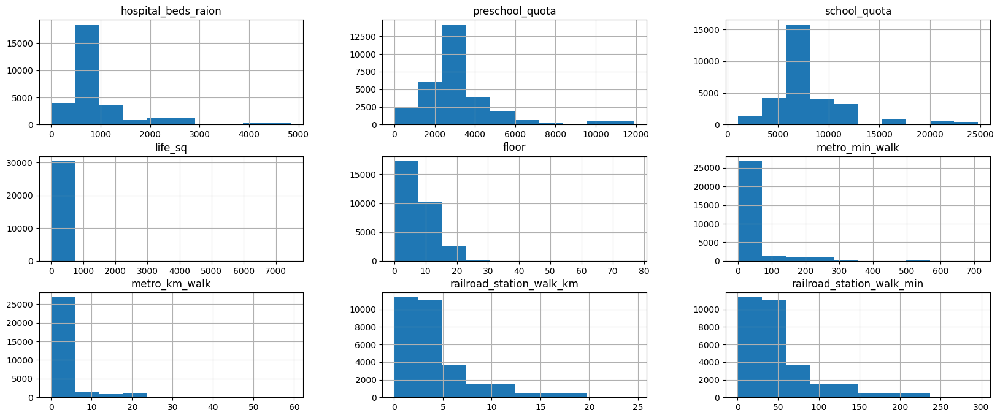

In [ ]:
# Посмотрим, на то, как изменились распределения наших признаков:

cols = cols_with_null.index
fill_data[cols].hist(figsize=(20, 8));

!!! Обратите внимание на то, как сильно изменилось распределение для признака hospital_beds_raion. Это связано с тем, что мы заполнили модальным значением почти 47 % общих данных. В результате мы кардинально исказили исходное распределение признака, что может плохо сказаться на модели.

Недостаток метода заполнения константой состоит в том, что мы можем «нафантазировать» новые данные, которые не учитывают истинного распределения.

### Заполнение недостающих значений константами с добавлением индикатора

Давайте добавим к нашим данным признаки-индикаторы, которые будут сигнализировать о том, что в столбце на определённом месте в таблице был пропуск. Это место в столбце-индикаторе будем помечать как True. 

Эта эвристика пытается снизить влияние искажения признака, указав модели на места, где мы «нафантазировали» данные.

Посмотрим на реализацию. Как обычно, создадим копию indicator_data исходной таблицы. В цикле пройдёмся по столбцам с пропусками и будем добавлять в таблицу новый признак (с припиской "was_null"), который получается из исходного с помощью применения метода isnull(). После чего произведём обычное заполнение пропусков, которое мы совершали ранее, и выведем на экран число отсутствующих значений в столбце, чтобы убедиться в результате:

In [ ]:
#создаем копию исходной таблицы
indicator_data = sber_data.copy()
#в цикле пробегаемся по названиям столбцов с пропусками
for col in cols_with_null.index:
    #создаем новый признак-индикатор как col_was_null
    indicator_data[col + '_was_null'] = indicator_data[col].isnull()
#создаем словарь имя столбца: число(признак) на который надо заменить пропуски   
values = {
    'life_sq': indicator_data['full_sq'],
    'metro_min_walk': indicator_data['metro_min_walk'].median(),
    'metro_km_walk': indicator_data['metro_km_walk'].median(),
    'railroad_station_walk_km': indicator_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min': indicator_data['railroad_station_walk_min'].median(),
    'hospital_beds_raion': indicator_data['hospital_beds_raion'].mode()[0],
    'preschool_quota': indicator_data['preschool_quota'].mode()[0],
    'school_quota': indicator_data['school_quota'].mode()[0],
    'floor': indicator_data['floor'].mode()[0]
}
#заполняем пропуски в соответствии с заявленным словарем
indicator_data = indicator_data.fillna(values)
#выводим результирующую долю пропусков
indicator_data.isnull().mean()

id                                    0.0
full_sq                               0.0
life_sq                               0.0
floor                                 0.0
sub_area                              0.0
                                     ... 
floor_was_null                        0.0
metro_min_walk_was_null               0.0
metro_km_walk_was_null                0.0
railroad_station_walk_km_was_null     0.0
railroad_station_walk_min_was_null    0.0
Length: 70, dtype: float64

!!!Метод исходит из предположения, что, если дать модели информацию о том, что в ячейке ранее была пустота, то она будет меньше доверять таким записям и меньше учитывать её в процессе обучения. Иногда такие фишки действительно работают, иногда не дают эффекта, а иногда и вовсе могут ухудшить результат обучения и затруднить процесс обучения.

Проклятие размерности гласит, что, увеличивая размерность функции, мы повышаем сложность поиска этого минимума и рискуем вовсе не найти его! Об этом страшном проклятии мы ещё будем говорить в курсе по ML и даже попробуем его победить. Но об этом чуть позже.

Однако, несмотря на свои недостатки, этот метод кажется наиболее логичным из предложенных ранее и часто используется в очистке данных.

### Комбинирование методов

Наверняка вы уже догадались, что необязательно использовать один метод. Вы можете их комбинировать. Например, мы можем:

- удалить столбцы, в которых более 30 % пропусков;
- удалить записи, в которых более двух пропусков одновременно;
- заполнить оставшиеся ячейки константами.

Посмотрим на реализацию такого подхода в коде:

In [ ]:
#создаём копию исходной таблицы
combine_data = sber_data.copy()

#отбрасываем столбцы с числом пропусков более 30% (100-70)
n = combine_data.shape[0] #число строк в таблице
thresh = n*0.7
combine_data = combine_data.dropna(thresh=thresh, axis=1)

#отбрасываем строки с числом пропусков более 2 в строке
m = combine_data.shape[1] #число признаков после удаления столбцов
combine_data = combine_data.dropna(thresh=m-2, axis=0)

#создаём словарь 'имя_столбца': число (признак), на который надо заменить пропуски 
values = {
    'life_sq': combine_data['full_sq'],
    'metro_min_walk': combine_data['metro_min_walk'].median(),
    'metro_km_walk': combine_data['metro_km_walk'].median(),
    'railroad_station_walk_km': combine_data['railroad_station_walk_km'].median(),
    'railroad_station_walk_min': combine_data['railroad_station_walk_min'].median(),
    'preschool_quota': combine_data['preschool_quota'].mode()[0],
    'school_quota': combine_data['school_quota'].mode()[0],
    'floor': combine_data['floor'].mode()[0]
}
#заполняем оставшиеся записи константами в соответствии со словарем values
combine_data = combine_data.fillna(values)
#выводим результирующую долю пропусков
display(combine_data.isnull().mean())

id                                       0.0
full_sq                                  0.0
life_sq                                  0.0
floor                                    0.0
sub_area                                 0.0
preschool_quota                          0.0
preschool_education_centers_raion        0.0
school_quota                             0.0
school_education_centers_raion           0.0
school_education_centers_top_20_raion    0.0
healthcare_centers_raion                 0.0
university_top_20_raion                  0.0
sport_objects_raion                      0.0
additional_education_raion               0.0
culture_objects_top_25_raion             0.0
shopping_centers_raion                   0.0
office_raion                             0.0
oil_chemistry_raion                      0.0
railroad_terminal_raion                  0.0
nuclear_reactor_raion                    0.0
metro_min_avto                           0.0
metro_km_avto                            0.0
metro_min_

In [ ]:
# Выведем результирующее число строк и столбцов:

print(combine_data.shape)

(26800, 60)


!!! Вы можете придумывать свои собственные комбинации методов и использовать их для борьбы с пропусками, главное — найти баланс между потерей информации и её искажением.

# Резюме по методам работы с пропусками

Ещё раз хотим подчеркнуть, что выбор метода или комбинации методов является исключительно вашим решением. Однако важно держать в голове несколько рекомендаций:

- Если какой-то из признаков имеет более 30-40 % пропусков, лучше избавьтесь от него: его заполнение может привести к сильному искажению общего распределения, а удаление записей — к большой утрате данных. Однако если этот признак очень важен для прогнозирования, вам придётся поколдовать над ним, чтобы «заплатки», которыми вы закрываете пропуски, выглядели правдоподобно.

- Заполняйте данные с умом! Если перед вами количественный признак, то использование нецелого числа в качестве константы является как минимум нелогичным.

- Вы можете оставить пропуски как есть, просто заменив их на какой-то специальный символ. Например, для числовых неотрицательных признаков можно использовать число -1, а для категориальных — строку 'unknown'.

- Если вам позволяют сроки вашего проекта, попробуйте несколько кардинально разных подходов работы с пропусками.

# Другие методы заполнения отсутствующих значений

Существуют и другие популярные способы избавиться от дыр в данных. Приведём только идею методов и их краткое описание.

- Например, можно предсказать пропуски с помощью модели. Такой подход основывается на том, что вы считаете признак с отсутствующими значениями целевым, а остальные признаки — факторами и строите модель, предсказывающую пропуски в данных. На практике часто для заполнения «дыр» в данных используют метод ближайшего соседа (KNN) или линейную регрессию.

- Ещё один подход — заполнение, основанное на группах. Можно сгруппировать данные по некоторым признакам и заполнять константой, полученной в группе. Например, в наших данных для признака жилой площади можно было бы заполнять пропуски средней площадью квартир в районе.

# Выбросы: почему появляются и чем опасны?

Ещё одна типичная проблема для больших данных — это наличие в них выбросов. 

Выброс (аномалия) — это наблюдение, которое существенно выбивается из общего распределения и сильно отличается от других данных.

Чем опасны выбросы?

Так или иначе, проблема выбросов состоит в том, что они могут «шокировать» модель.

Чаще всего выбросы либо исключают из данных, либо корректируют значения на что-то правдоподобное, либо, если выбросов много, создают специальный датасет и обучают модели для них отдельно.

Причины появления выбросов: 

1. Ошибка ввода данных. Как и с пропусками, здесь играет роль человеческий фактор. Ввести лишний «ноль» на клавиатуре и не заметить этого — нередкий случай.

2. Ошибки отбора выборки. Когда начинающие специалисты составляют обучающую выборку для моделирования, они часто допускают ошибку, не выделив в отдельную группу часть данных. Типичный пример: смешать вместе данные об уровне жизни среднего класса, опрошенного на улице, и добавить туда людей из списка Forbes.

3. Преднамеренное искажение или мошенничество. Пользователи приложения часто намеренно указывают неверные данные о себе. Например, прибавляют к своему возрасту лишнюю сотню лет, создавая головную боль дата-сайентистам.

Существует множество способов определить потенциальные выбросы. Какие-то из них основаны на простой логике, какие-то на математике, а некоторые и вовсе являются эвристиками. Проблема заключается в том, что ни один из методов не даёт никаких гарантий, поэтому необходимо проверять их результаты. Более того, используя разные методы, вы можете получить различных кандидатов на выбросы.

## Метод ручного поиска и здравого смысла

Это самый трудоёмкий метод, основанный на житейской логике, методе пристального взгляда и небольшом количестве статистики. Он предполагает поиск невозможных и нелогичных значений в данных.

Пусть у нас есть признак, по которому мы будем искать выбросы. Давайте рассчитаем его статистические показатели (минимум, максимум, среднее, квантили) и по ним попробуем определить наличие аномалий.

Сделать это можно с помощью уже знакомого вам метода describe(). Рассчитаем статистические показатели для признака жилой площади (life_sq).

In [ ]:
sber_data['life_sq'].describe()

count    24088.000000
mean        34.403271
std         52.285733
min          0.000000
25%         20.000000
50%         30.000000
75%         43.000000
max       7478.000000
Name: life_sq, dtype: float64

Что нам говорит метод describe()? Во-первых, у нас есть квартиры с нулевой жилой площадью. Во-вторых, в то время как 75-й квантиль равен 43, максимум превышает 7 тысяч квадратных метров (целый дворец, а не квартира!). 

In [ ]:
# Найдём число квартир с нулевой жилой площадью:

print(sber_data[sber_data['life_sq'] == 0].shape[0])

45


Это могут быть апартаменты — вид коммерческой недвижимости, которая юридически не является жилой площадью, но законно продаётся по ценам, сопоставимым с квартирными. Оставим их в покое.     

In [ ]:
# А теперь выведем здания с жилой площадью более 7 000 квадратных метров:

display(sber_data[sber_data['life_sq'] > 7000])

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
13546,13549,79,7478.0,8.0,Poselenie Voskresenskoe,NaN,0,NaN,0,0,...,5.072389,1.210613,0.826052,1.582378,0.756119,21.472421,14.917332,no data,0,7705000


Вот он, красавец! Выброс налицо: гигантская жилая площадь (life_sq), да ещё почти в 100 раз превышает общую площадь (full_sq).

Логичен вопрос: а много ли у нас таких квартир, у которых жилая площадь больше, чем суммарная?

Давайте проверим это с помощью фильтрации:

In [ ]:
outliers = sber_data[sber_data['life_sq'] > sber_data['full_sq']]
print(outliers.shape[0])

37


Таких квартир оказывается 37 штук. Подобные наблюдения уже не поддаются здравому смыслу — они являются ошибочными, и от них стоит избавиться. Для этого можно воспользоваться методом drop() и удалить записи по их индексам:

In [ ]:
cleaned = sber_data.drop(outliers.index, axis=0)
print(f'Результирующее число записей: {cleaned.shape[0]}')

Результирующее число записей: 30434


In [ ]:
# Ещё пример: давайте посмотрим на признак числа этажей (floor).

display(sber_data['floor'].describe())

count    30304.000000
mean         7.670803
std          5.319989
min          0.000000
25%          3.000000
50%          6.500000
75%         11.000000
max         77.000000
Name: floor, dtype: float64

Снова видим подозрительную максимальную отметку в 77 этажей.

In [ ]:
# Проверим все квартиры, которые находятся выше 50 этажей:

display(sber_data[sber_data['floor']> 50])

,id,full_sq,life_sq,floor,sub_area,preschool_quota,preschool_education_centers_raion,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,...,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,theater_km,museum_km,ecology,mosque_count_1000,price_doc
23584,23587,57,33.0,77.0,Lomonosovskoe,3091.0,5,8359.0,7,1,...,0.310557,0.731683,0.489763,0.86354,0.863266,2.920671,2.757058,satisfactory,0,13700000


Убеждаемся в том, что здания выше 70 этажей находятся на территории комплекса Москва-Сити (Пресненский район). В Ломоносовском районе таких жилых высоток нет. Получается, что данное наблюдение — выброс.

## Метод межквартильного размаха (метод Тьюки)

Отличным помощником в поиске потенциальных выбросов является визуализация. Если признак является числовым, то можно построить гистограмму или коробчатую диаграмму, чтобы найти аномалии.

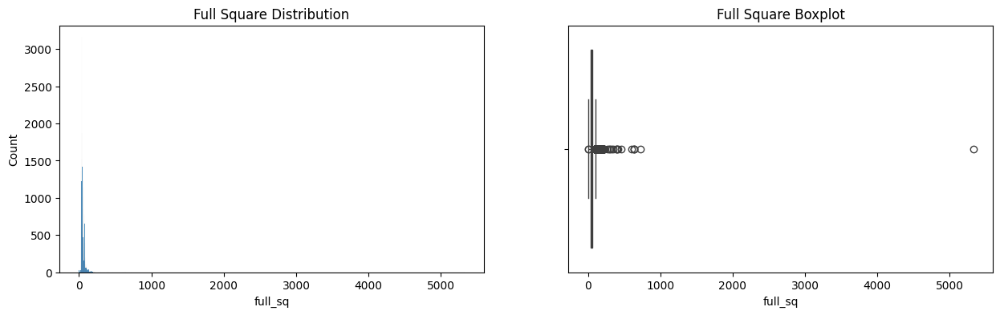

In [ ]:
 #Построим гистограмму и коробчатую диаграмму для признака полной площади (full_sq):

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=sber_data, x='full_sq', ax=axes[0]);
histplot.set_title('Full Square Distribution');
boxplot = sns.boxplot(data=sber_data, x='full_sq', ax=axes[1]);
boxplot.set_title('Full Square Boxplot');

Врага нужно знать в лицо! Запомните эти картинки: именно так выглядят типичные графики распределений с выбросами в данных. Гистограмма, реализованная в seaborn, автоматически выбирает число столбцов, необходимое для наилучшей визуализации распределения. Когда признак содержит выбивающиеся значения, число столбцов становится очень велико и в итоге получается такая «кракозябра». 

По этой же причине получается сплюснутая под весом выбросов коробчатая диаграмма. Она помогает более чётко увидеть потенциальные аномалии, которые находятся за пределами усов (1.5 межквартильных размаха).

Основная масса квартир имеет общую площадь менее 250 квадратных метров, и лишь несколько невзрачных наблюдений выбиваются из этого интервала. Максимальная площадь, судя по гистограмме, превышает 5 000 квадратных метров.


Визуализация помогает определить наличие выбросов. Для того чтобы их найти, можно воспользоваться статистическими подходами. 

Одним из таких подходов является метод межквартильного размаха (его еще называют методом Тьюки), который используется для построения коробчатой диаграммы.

Алгоритм метода:

→ вычислить 25-ый и 75-ый квантили (первый и третий квартили) —  Q_{75} и Q_{25} для признака, который мы исследуем;

→ вычислить межквартильное расстояние: IQR=Q_{75}-Q_{25} ;

→ вычислить верхнюю и нижнюю границы Тьюки: 

bound_{lower}=Q_{25} - 1.5 * IQR
bound_{upper}=Q_{75} + 1.5 * IQR

→ найти наблюдения, которые выходят за пределы границ 
[bound_{lower}, bound_{upper}].



В соответствии с этим алгоритмом напишем функцию outliers_iqr(), которая вам может ещё не раз пригодиться в реальных задачах. Эта функция принимает на вход DataFrame и признак, по которому ищутся выбросы, а затем возвращает потенциальные выбросы, найденные с помощью метода Тьюки, и очищенный от них датасет.

Квантили вычисляются с помощью метода quantile(). Потенциальные выбросы определяются при помощи фильтрации данных по условию выхода за пределы верхней или нижней границы.

In [ ]:
def outliers_iqr(data, feature):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

In [ ]:
# Применим эту функцию к таблице sber_data и признаку full_sq, 
# а также выведем размерности результатов:

outliers, cleaned = outliers_iqr(sber_data, 'full_sq')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 963
Результирующее число записей: 29508


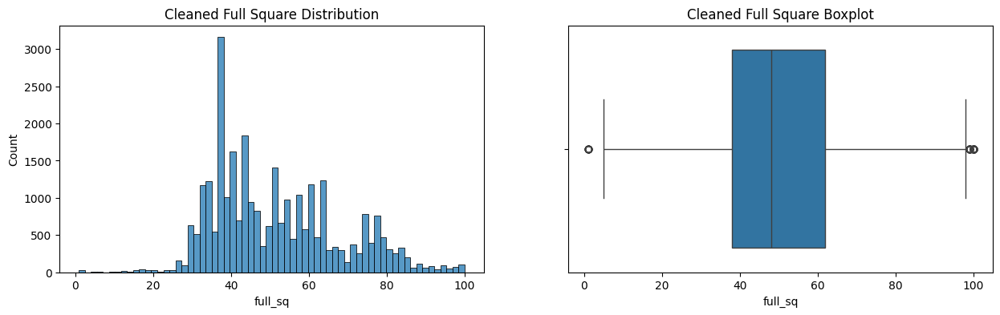

In [ ]:
# Согласно классическому методу Тьюки, под выбросы у нас попали 963 записи 
# в таблице. Давайте построим гистограмму и коробчатую диаграмму на новых 
# данных cleaned_sber_data:

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=cleaned, x='full_sq', ax=axes[0]);
histplot.set_title('Cleaned Full Square Distribution');
boxplot = sns.boxplot(data=cleaned, x='full_sq', ax=axes[1]);
boxplot.set_title('Cleaned Full Square Boxplot');

На первый взгляд — стерильно. Однако если присмотреться, то коробчатая диаграмма всё ещё продолжает говорить, что в данных есть одиночные выбросы с обеих сторон от границ. К тому же у нас сильно урезался диапазон жилой площади — максимальная площадь составляет около 100 кв. м. 

?
Как же так, неужели метод не работает?

Причина кроется в том, что после удаления выбросов квартили рассчитываются заново по новым данным, и так оказалось, что из-за свойств распределения были снова найдены точки, которые считаются выбросами.

Классический метод межквартильного размаха не учитывает особенностей распределения! Он требует, чтобы данные были распределены плюс-минус нормально (гистограмма должна быть похожа на колокол) и требует от распределения примерной симметричности (чтобы у гистограммы были одинаковые хвосты в обе стороны).

У нас же распределение (даже после отсечения выбросов) отличается от заявленных критериев. Оно несимметрично: правый хвост изначального распределения гораздо длиннее левого (для Москвы вполне естественны квартиры с площадью свыше 100 квадратных метров) и вовсе не колоколообразно. Попросту говоря, выбор метода поиска не оправдал себя.

Но не стоит расстраиваться! Никто не говорил, что вы должны должны ограничиваться только 1.5 межквартильных размахов. Вы можете сами подбирать число размахов влево и/или вправо и таким образом отбирать выбросы, учитывая особенности ваших данных. 

In [ ]:
import pandas as pd
import numpy as np

def outliers_iqr_mod(data, feature, left=1.5, right=1.5):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75)
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)

    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_iqr_mod(sber_data, 'full_sq', left=1, right=6)
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 59
Результирующее число записей: 30412


In [ ]:
outliers, cleaned = outliers_iqr_mod(sber_data, 'full_sq', left=1, right=6)
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу Тьюки: 59
Результирующее число записей: 30412


Если мы построим гистограмму и коробчатую диаграмму на полученных данных, то увидим вот такую картинку:

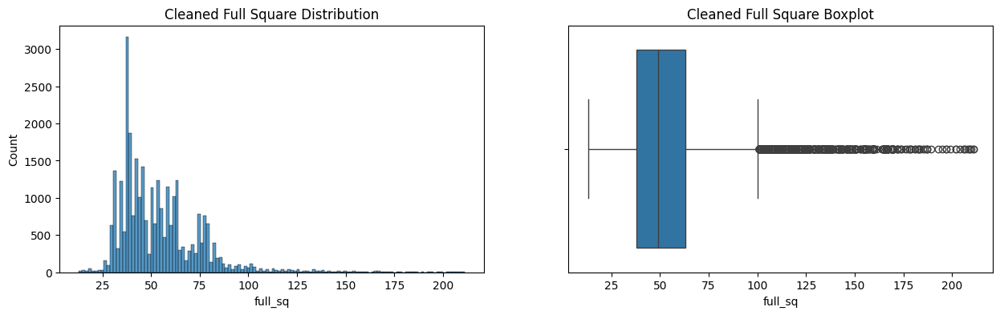

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
histplot = sns.histplot(data=cleaned, x='full_sq', ax=axes[0]);
histplot.set_title('Cleaned Full Square Distribution');
boxplot = sns.boxplot(data=cleaned, x='full_sq', ax=axes[1]);
boxplot.set_title('Cleaned Full Square Boxplot');

Согласитесь, это уже больше похоже на реальный рынок недвижимости: основная часть квартир имеет площадь в интервале от 25 до 85 кв. м, а далее частота наблюдений постепенно падает.

## Метод z-отклонений (метод сигм)

Последний метод, который мы рассмотрим, — это метод, основанный на правиле трёх сигм для нормального распределения. 

Правило трёх сигм гласит: если распределение данных является нормальным, то 99,73 % лежат в интервале от , где   (мю) — математическое ожидание (для выборки это среднее значение), а  (сигма) — стандартное отклонение. Наблюдения, которые лежат за пределами этого интервала, будут считаться выбросами.

![alt text](dst-3-unit-1-mod-14-25.png)

А что делать, если данные не распределены нормально? 

На такой случай есть один трюк. Иногда для распределений, похожих на логнормальное, может помочь логарифмирование. Оно может привести исходное распределение к подобию нормального. Причем, основание логарифма может быть любым.

Рассмотрим логарифмирование на примере. 

Построим две гистограммы признака расстояния до МКАД (mkad_km): первая — в обычном масштабе, а вторая — в логарифмическом. Логарифмировать будем с помощью функции log() из библиотеки numpy (натуральный логарифм — логарифм по основанию числа e). Признак имеет среди своих значений 0. Из математики известно, что логарифма от 0 не существует, поэтому мы прибавляем к нашему признаку 1, чтобы не логарифмировать нули и не получать предупреждения.

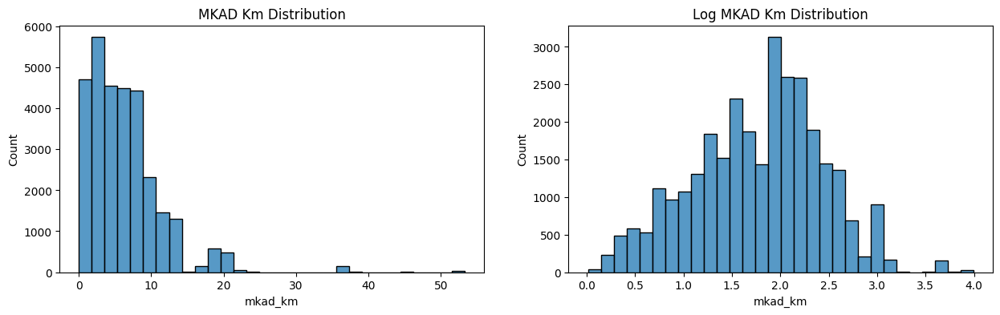

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

#гистограмма исходного признака
histplot = sns.histplot(sber_data['mkad_km'], bins=30, ax=axes[0])
histplot.set_title('MKAD Km Distribution');

#гистограмма в логарифмическом масштабе
log_mkad_km= np.log(sber_data['mkad_km'] + 1)
histplot = sns.histplot(log_mkad_km , bins=30, ax=axes[1])
histplot.set_title('Log MKAD Km Distribution');

Что мы тут видим? 

Левое распределение напоминает логнормальное распределение с наличием потенциальных выбросов-«пеньков», далеко отстоящих от основной массы наблюдений.

Взяв натуральный логарифм от левого распределения, мы получаем правое, которое напоминает слегка перекошенное нормальное. Слева от моды (самого высокого столбика) наблюдается чуть больше наблюдений, нежели справа. По-научному это будет звучать так: «распределение имеет левостороннюю асимметрию».

Примечание: Численный показатель асимметрии можно вычислить с помощью метода:


skew():
print(log_mkad_km.skew())
# -0.14263612203024953
Асимметрия распределения называется правосторонней, если она положительная:
A8 > 0;

Асимметрия распределения называется левосторонней, если она отрицательная:
A8 < 0.

In [ ]:
#skew():
#print(log_mkad_km.skew())

Давайте реализуем алгоритм метода z-отклонения. Описание алгоритма метода:

→ вычислить математическое ожидание  (среднее) и стандартное отклонение  признака ;

→ вычислить нижнюю и верхнюю границу интервала как:
bound_{lower}= mu - 3\sigma
bound_{lower}= mu + 3\sigma

→ найти наблюдения, которые выходят за пределы границ.

Напишем функцию outliers_z_score(), которая реализует этот алгоритм. 

На вход она принимает DataFrame и признак, по которому ищутся выбросы. В дополнение добавим в функцию возможность работы в логарифмическом масштабе: для этого введём аргумент log_scale. Если он равен True, то будем логарифмировать рассматриваемый признак, иначе — оставляем его в исходном виде.

In [ ]:
# Как и раньше, функция будет возвращать выбросы и очищенные от них данные:

def outliers_z_score(data, feature, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - 3 * sigma
    upper_bound = mu + 3 * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

In [ ]:
# Применим эту функцию к таблице sber_data и признаку mkad_km, 
# а также выведем размерности результатов:

outliers, cleaned = outliers_z_score(sber_data, 'mkad_km', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 33
Результирующее число записей: 30438


In [ ]:
# Итак, метод z-отклонения нашел нам 33 потенциальных выброса по признаку 
# расстояния до МКАД. Давайте узнаем, в каких районах (sub_area) представлены 
# эти квартиры:

print(outliers['sub_area'].unique())

['Poselenie Rogovskoe' 'Poselenie Kievskij']


Наши потенциальные выбросы — это квартиры из поселений «Роговское» и «Киевский». Снова обращаемся к силе интернета и «пробиваем» наших подозреваемых. Эти поселения — самые удалённые районы Москвы; первое из них — это и вовсе граница с Калужской областью. 

?
И тут возникает закономерный вопрос: а стоит ли считать такие наблюдения за выбросы? 

Вопрос в действительности не имеет определенного ответа: с одной стороны, метод прямо-таки говорит нам об этом, а с другой — эти наблюдения имеют право на существование, ведь они являются частью Москвы.

Возможно, мы не учли того факта, что наш логарифм распределения всё-таки не идеально нормален и в нём присутствует некоторая асимметрия. Возможно, стоит дать некоторое «послабление» на границы интервалов? Давайте отдельно построим гистограмму прологарифмированного распределения, а также отобразим на гистограмме вертикальные линии, соответствующие среднему (центру интервала в методе трёх сигм) и границы интервала mu + 3 * sigma. Вертикальные линии можно построить с помощью метода axvline(). Для среднего линия будет обычной, а для границ интервала — пунктирной (параметр ls ='--'):

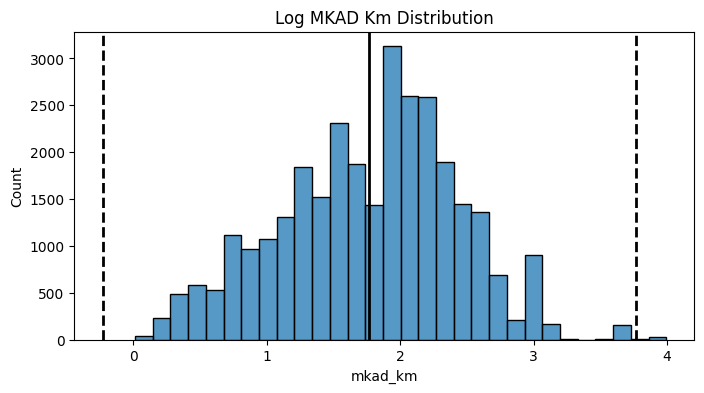

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_mkad_km = np.log(sber_data['mkad_km'] + 1)
histplot = sns.histplot(log_mkad_km, bins=30, ax=ax)
histplot.axvline(log_mkad_km.mean(), color='k', lw=2)
histplot.axvline(log_mkad_km.mean()+ 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.axvline(log_mkad_km.mean()- 3 * log_mkad_km.std(), color='k', ls='--', lw=2)
histplot.set_title('Log MKAD Km Distribution');

Итак, мы графически построили интервал метода трёх сигм поверх нашего распределения. Он показывает, какие наблюдения мы берём в интервал, а какие считаем выбросами. Легко заметить, что среднее значение (жирная вертикальная линия) находится левее моды. Это свойство распределений с левосторонней асимметрией. Также видны наблюдения, которые мы не захватили своим интервалом (небольшой «пенёк» правее верхней границы) — это и есть наши квартиры из поселений «Роговское» и «Киевский». Очевидно, что если немного (меньше чем на одну сигму) «сдвинуть» верхнюю границу вправо, то мы захватим эти наблюдения. Давайте сделаем это.

Давайте расширим правило трёх сигм, чтобы иметь возможность учитывать особенности данных. Добавьте в функцию outliers_z_score(data, feature, log_scale=False) параметры left и right, которые будут задавать число сигм (стандартных отклонений) влево и вправо соответственно, определяющее границы метода z-отклонения. По умолчанию оба параметры равны 3.

Результирующую функцию назовите outliers_z_score_mod().

Можете протестировать работу функции на DataFrame test_sber_data.csv. Проверять ваше решение мы будем, подавая на вход функции вместо data произвольный датафрейм.

In [ ]:
import numpy as np

def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
        
    mu = x.mean()
    sigma = x.std()
    
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    
    return outliers, cleaned


Задание 6.4

Проверьте, что будет, если дать «послабление» вправо, увеличив число сигм. Наша задача — узнать, начиная с какой границы поселения «Роговское» и «Киевское» перестают считаться выбросами. Примените свою функцию outliers_z_score_mod() к признаку mkad_km с параметрами left=3, right=3.5, log_scale=True. Чему равно результирующее число выбросов?

In [ ]:
import numpy as np

def outliers_z_score_mod(data, feature, log_scale=True, left=3, right=3.5):
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
        
    mu = x.mean()
    sigma = x.std()
    
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    
    return outliers, cleaned


In [ ]:
# Применим эту функцию к таблице sber_data и признаку mkad_km, 
# а также выведем размерности результатов:

outliers, cleaned = outliers_z_score_mod(sber_data, 'mkad_km', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 0
Результирующее число записей: 30471


Стоило нам немного увеличить правую границу метода z-отклонений, как мы получили отсутствие выбросов в признаке. Давать ли такие «послабления» или нет — это ваше решение и полностью зависит от специфики задачи, однако вы можете пользоваться этим трюком, чтобы более тщательно подходить к поиску аномалий.

# Резюме по методам поиска выбросов

Мы рассмотрели классические методы выявления аномальных данных. Как вы сами поняли, каждый из них имеет свои преимущества и недостатки.

1. Метод ручного поиска тяжело автоматизировать, однако вы сами организовываете проверки, следите за процессом отсеивания выбросов и руководствуетесь не только статистикой, но и здравым смыслом. К тому же из всех представленных только этот метод способен выявить логические нестыковки в данных (например, общая площадь меньше жилой или число этажей более 77 в районе, где нет таких зданий). Обычно этот метод используется в комплексе с другими, чтобы удостовериться в том, что найденные данные действительно являются выбросами, и произвести логическую очистку, на которую неспособны другие методы.

2. Методы межквартильного размаха и z-отклонений довольно просты в реализации и основаны на стройной математической теории, а не на эвристиках. Но это их преимущество и недостаток. Оба метода разработаны для данных, распределённых приблизительно нормально. Проблема в том, что далеко не всё в мире имеет нормальное распределение. Необходимо внимательно «рыться» в данных, совершать дополнительные преобразования, чтобы привести их хотя бы к подобию нормального распределения, либо подбирать границы методов, чтобы учитывать особенности распределений. В противном случае методы начинают считать выбросами всё, что не вписывается в жёсткие границы, и вы рискуете лишиться важных данных! Учитывайте это в своей работе и всегда проверяйте результаты.

# Другие методы поиска выбросов

Конечно, наука о данных не ограничивается тремя методами. Скажем даже больше: в машинном обучении есть отдельная активно развивающаяся подобласть, именуемая Outliers (Anomaly) Detection. Она включает в себя большое количество методов для поиска аномалий в совершенно различных видах данных: от временных рядов до географических данных. Специалисты этой области обучают целые модели, которые помогают отыскать выбросы в данных. 

Мы рассмотрели самые простые, но очень распространённые методы поиска выбросов, главный недостаток которых состоит в том, что они основываются на информации только по одному признаку. Для глубокого поиска аномалий могут применяться методы, которые используют информацию обо всех признаках.

Например, для поиска аномалий часто используется метод кластеризации DBSCAN, о котором мы ещё будем говорить в модуле по кластеризации данных далее. Метод пытается объединить данные в группы (кластеры), например: квартиры низкого, среднего и премиального класса, опираясь на все признаки. Всё, что не попало ни в какой из кластеров, помечается как выброс (шум).

![alt text](dst-3-unit-1-mod-14-28.png)

Но ситуация остаётся прежней: ни один из методов не гарантирует, что найденные наблюдения действительно являются выбросами и подлежат исключению из данных.

Задание 6.5

Постройте гистограмму для признака price_doc в логарифмическом масштабе. А также, добавьте на график линии, отображающие среднее и границы интервала для метода трех сигм. Выберите верные утверждения:

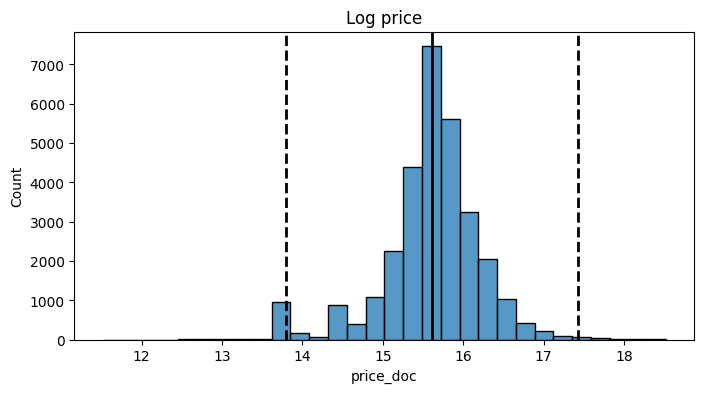

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
log_price = np.log(sber_data['price_doc'])
histplot = sns.histplot(log_price, bins=30, ax=ax)
histplot.axvline(log_price.mean(), color='k', lw=2)
histplot.axvline(log_price.mean()+ 3 * log_price.std(), color='k', ls='--', lw=2)
histplot.axvline(log_price.mean()- 3 * log_price.std(), color='k', ls='--', lw=2)
histplot.set_title('Log price');

Задание 6.6

Найдите потенциальные выбросы по признаку price_doc с помощью метода z-отклонения. Используйте логарифмический масштаб распределения. Сделайте «послабление» на 0.7 сигм в обе стороны распределения. Сколько выбросов вы получили?

In [ ]:
import numpy as np

def outliers_z_score_mod(data, feature, log_scale=True, left=3.7, right=3.7):
    if log_scale:
        x = np.log(data[feature] + 1)
    else:
        x = data[feature]
        
    mu = x.mean()
    sigma = x.std()
    
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    
    return outliers, cleaned

In [ ]:
# Применим эту функцию к таблице sber_data и признаку mkad_km, 
# а также выведем размерности результатов:

outliers, cleaned = outliers_z_score_mod(sber_data, 'price_doc', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

Число выбросов по методу z-отклонения: 52
Результирующее число записей: 30419


Задание 6.7

Добавьте фишку с логарифмированием в свою функцию outliers_iqr_mod(). Добавьте в неё параметр log_scale. Если он выставлен в True, то производится логарифмирование признака. Примените полученную функцию к признаку price_doc. Число межквартильных размахов в обе стороны обозначьте как 3. Чему равно число выбросов, полученных таким методом?

При логарифмировании признака price_doc добавлять к нему 1 не нужно, он не имеет нулевых значений!

In [ ]:
import pandas as pd
import numpy as np

def outliers_iqr_mod(data, feature, left=1.5, right=1.5, log_scale=False):
    if log_scale:
        x = np.log(data[feature])
    else:
        x= data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned

In [ ]:
# Применим эту функцию к таблице sber_data и признаку mkad_km, 
# а также выведем размерности результатов:

outliers, cleaned = outliers_iqr_mod(sber_data, 'price_doc', left=3, right=3, log_scale=True)
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')

Число выбросов по методу Тьюки: 92


# Работа с дубликатами и неинформативными признаками

Иногда данные могут содержать повторяющиеся записи (дубликаты).

Дубликатами называются записи, для которых значения (всех или большинства) признаков совпадают. 

Мы уже сталкивались с такой проблемой, когда рассматривали датасет с информацией о фильмах и их рейтингах. В двух таблицах с рейтингами возникали дубликаты, из-за которых мы не могли правильно объединить данные. 

В том случае дубликаты было очень просто найти: это была последняя строка первой и первая строка второй таблиц. Но так бывает не всегда. Иногда дубликаты тщательно скрываются в данных и необходимо приложить немало усилий, чтобы их отыскать.

Чем опасны дубликаты?

Дублирующаяся информация никогда не приводит ни к чему хорошему. В Data Science одинаковые записи не несут полезной информации и искажают реальную статистику. Модель несколько раз видит одно и то же наблюдение и начинает подстраиваться под него. Если дубликатов много, это может стать большой проблемой при обучении.

Обнаружение и ликвидация дубликатов

Способ обнаружения дубликатов зависит от того, что именно вы считаете дубликатом. Например, за дубликаты можно посчитать записи, у которых совпадают все признаки или их часть. Если в таблице есть столбец с уникальным идентификатором (id), вы можете попробовать поискать дубликаты по нему: одинаковые записи могут иметь одинаковый id.

✍️ Проверим, есть у нас такие записи: для этого сравним число уникальных значений в столбце id с числом строк. Число уникальных значений вычислим с помощью метода nunique():

In [18]:
sber_data['id'].nunique() == sber_data.shape[0]

True

Столбец с id задаёт каждой строке свой уникальный номер, поэтому сама по себе каждая строка является уникальной. Однако содержимое других столбцов может повторяться.

Чтобы отследить дубликаты, можно воспользоваться методом duplicated(), который возвращает булеву маску для фильтрации. Для записей, у которых совпадают признаки, переданные методу, он возвращает True, для остальных — False.

У метода есть параметр subset — список признаков, по которым производится поиск дубликатов. По умолчанию используются все столбцы в DataFrame и ищутся полные дубликаты.

Найдём число полных дубликатов таблице sber_data. Предварительно создадим список столбцов dupl_columns, по которым будем искать совпадения (все столбцы, не включая id). 

Создадим маску дубликатов с помощью метода duplicated() и произведём фильтрацию. Результат заносим в переменную sber_duplicates. Выведем число строк в результирующем DataFrame:

In [19]:
dupl_columns = list(sber_data.columns)
dupl_columns.remove('id')

mask = sber_data.duplicated(subset=dupl_columns)
sber_duplicates = sber_data[mask]
print(f'Число найденных дубликатов: {sber_duplicates.shape[0]}')

Число найденных дубликатов: 562


Итак, 562 строки в таблице являются полными копиями других записей. Ручной поиск совпадающих строк по 30 тысячам записей был бы практически невыполним, а с помощью pandas мы быстро, а главное, легко обнаружили дублирующиеся данные!

Теперь нам необходимо от них избавиться. Для этого легче всего воспользоваться методом drop_duplicates(), который удаляет повторяющиеся записи из таблицы. 

In [20]:
# Создадим новую таблицу sber_dedupped, которая будет версией исходной таблицы,
# очищенной от полных дубликатов.

sber_dedupped = sber_data.drop_duplicates(subset=dupl_columns)
print(f'Результирующее число записей: {sber_dedupped.shape[0]}')

Результирующее число записей: 29909


## Неинформативные признаки

Неинформативными называются признаки, в которых большая часть строк содержит одинаковые значения (например, пол клиентов в мужском барбершопе), либо наоборот — признак, в котором для большинства записей значения уникальны (например, номер телефона клиента). 

Чем опасны неинформативные признаки?

Такие признаки не играют роли при моделировании и лишь засоряют таблицу, увеличивая размерность данных. Они усиливают уже знакомое нам проклятие размерности, которое увеличивает время обучения модели и потенциально может снизить ее качество. 

Поэтому от таких признаков необходимо безжалостно избавляться.

Обнаружение и ликвидация неинформативных признаков

Чтобы считать признак неинформативным, прежде всего нужно задать какой-то определённый порог. Например, часто используют пороги в 0.95 и 0.99. Это означает: признак неинформативен, если в нем 95 % (99 %) одинаковых значений или же 95 % (99 %) данных полностью уникальны.

К сожалению, в pandas пока нет волшебной палочки, которая мгновенно бы выдавала список столбцов, обладающих низкой информативностью. Однако процедура их поиска легко реализуется вручную.

Разберём алгоритм:

→ Создаём пустой список low_information_cols, куда будем добавлять названия признаков, которые мы посчитаем неинформативными.

→ В цикле пройдёмся по всем именам столбцов в таблице и для каждого будем совершать следующие действия:

рассчитаем top_freq — наибольшую относительную частоту с помощью метода value_counts() с параметром normalize=True. Метод вернёт долю от общих данных, которую занимает каждое уникальное значение в признаке.
Например, для столбца oil_chemistry_raion (нефтехимический район) результат будет следующим:

![alt text](dst-3-unit-1-mod-14-29.png)

Отсюда нам нужен максимум.

рассчитаем nunique_ratio — отношение числа уникальных значений в столбце к размеру всего столбца. Число уникальных значений в столбце получим с помощью метода nunique(), а размер признака — с помощью метода count(). Например, для столбца id число уникальных значений — 30471; оно же равно размеру таблицы. Поэтому результат отношения будет 1.
сравним каждое из полученных чисел с пороговым значением (у нас это 0.95) и добавим в список неинформативных признаков, если условие истинно.

In [21]:
#список неинформативных признаков
low_information_cols = [] 

#цикл по всем столбцам
for col in sber_data.columns:
    #наибольшая относительная частота в признаке
    top_freq = sber_data[col].value_counts(normalize=True).max()
    #доля уникальных значений от размера признака
    nunique_ratio = sber_data[col].nunique() / sber_data[col].count()
    # сравниваем наибольшую частоту с порогом
    if top_freq > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(top_freq*100, 2)}% одинаковых значений')
    # сравниваем долю уникальных значений с порогом
    if nunique_ratio > 0.95:
        low_information_cols.append(col)
        print(f'{col}: {round(nunique_ratio*100, 2)}% уникальных значений')

id: 100.0% уникальных значений
oil_chemistry_raion: 99.03% одинаковых значений
railroad_terminal_raion: 96.27% одинаковых значений
nuclear_reactor_raion: 97.17% одинаковых значений
big_road1_1line: 97.44% одинаковых значений
mosque_count_1000: 98.08% одинаковых значений


In [22]:
# Итак, мы нашли шесть неинформативных признаков. Теперь можно удалить их 
# с помощью метода drop(), передав результирующий список в его аргументы.

information_sber_data = sber_data.drop(low_information_cols, axis=1)
print(f'Результирующее число признаков: {information_sber_data.shape[1]}')

Результирующее число признаков: 55


Однако всегда следует скептически относиться к результатам, которые предоставил алгоритм поиска неинформативных признаков. В противном случае можно лишиться важных данных. 

Например, в ваших данных есть признак цены акций, которая всё время меняется. В каждый момент времени её цена уникальна, то есть число уникальных значений в столбце совпадает с размером столбца. Казалось бы, по критерию информативности это кандидат на выбывание, но если мы рассматриваем задачу предсказания спроса на эти самые акции, то очевидно, что цена — это очень важный фактор, несмотря на свою уникальность. Именно цена на акции определяет спрос на них.

Могут возникнуть ситуации, когда присутствует огромная разница в частотах для каждого уникального значения в столбце, но это вовсе не значит, что признак неинформативен. Например, у нас могут быть данные о различных переводах между счетами пользователей. В этих данных может быть очень важный признак мошенничества (два возможных значения — да и нет). Как правило, соотношение между мошенниками и обычными пользователями около — 2/98 % (мошенников 1-2 %, а обычных пользователей — 98-99 %). Но стоит ли удалять данный признак из данных зависит от поставленной перед нами задачи.

Будьте внимательны и рассудительны при поиске неинформативных признаков. Лучшее решение — для начала использовать все признаки для построения базовой модели, а затем уже выбирать те, которые обладают наибольшей информативностью.

Более подробно мы рассмотрим данные нюансы в блоке по машинному обучению.

Важность признаков

На самом деле информативность признаков определяется не только числом уникальных значений, но и их влиянием на целевой признак (тот, который мы хотим предсказать). Это называется важностью признака. 

Признаки, которые обладают низкой важностью, называют нерелевантными признаками. 

Например, если бы в наших данных о квартирах был признак, содержащий информацию о температуре воздуха за окном, он был бы нерелевантным.

Нерелевантные признаки могут быть не такими очевидными. В таких случаях применяются более сложные способы их поиска с использованием статистики и моделей машинного обучения. Мы поговорим об этом позже, когда вплотную подойдём к Machine Learning.

In [24]:
diabetes = pd.read_csv('data/diabetes_data.csv')
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Gender
0,6,98,58,33,190,34.0,0.430,43,0,Female
1,2,112,75,32,0,35.7,0.148,21,0,Female
2,2,108,64,0,0,30.8,0.158,21,0,Female
3,8,107,80,0,0,24.6,0.856,34,0,Female
4,7,136,90,0,0,29.9,0.210,50,0,Female


In [25]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 778 entries, 0 to 777
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               778 non-null    int64  
 1   Glucose                   778 non-null    int64  
 2   BloodPressure             778 non-null    int64  
 3   SkinThickness             778 non-null    int64  
 4   Insulin                   778 non-null    int64  
 5   BMI                       778 non-null    float64
 6   DiabetesPedigreeFunction  778 non-null    float64
 7   Age                       778 non-null    int64  
 8   Outcome                   778 non-null    int64  
 9   Gender                    778 non-null    object 
dtypes: float64(2), int64(7), object(1)
memory usage: 60.9+ KB


# объектно-ориентированное программированиу (ООП)

Свойства
![alt text](dst-3-unit-1-15-3.png)

Методы
![alt text](dst-3-unit-1-15-4.png)

В сравнении двух изображений видно, что свойствам устанавливаются значения, а методам — нет. То есть методы — это определённое поведение, которым характеризуется объект, а свойства могут изменяться.

ООП, как и любой другой тип, характеризуется своими особенностями (принципами). Рассмотрим их подробнее.

1. Наследование

Этот принцип базируется на том, что новый класс описывается на основе уже существующего (родительского), то есть не только перенимает все свойства родительского класса, но ещё и получает новые.

В животных выделим собаку и лошадь. Вроде бы тоже перенимают все свойства млекопитающих, животных, но каждый из них добавляет ещё свои новые свойства. Это и есть наследование.

2. 	Абстракция

Абстракция означает выделение главных, наиболее значимых характеристик предмета и, наоборот, отбрасывание второстепенных, незначительных. 

Например, в каждой компании в отделе кадров есть картотека по сотрудникам. Но если мы сравним картотеку IT-компании и базу артистов театра и кино, то поймем, что указаны там, скорее всего, разные свойства людей. Вряд ли для IT-компании важен будет типаж человека (цвет волос, глаз и так далее), а вот для компании, которая занимается съёмкой фильмов, возможно, это будет приоритетнее, чем, например, номер ИНН.

3. Инкапсуляция

Это свойство системы, позволяющее объединить данные и методы, работающие с ними, в классе и скрыть детали реализации от пользователя. Инкапсуляция также означает ограничение доступа к данным и возможностям их изменения.

В основе лежит слово «капсула». В эту «капсулу» мы прячем какие-то важные для нас данные, которые не хотим, чтобы кто-то менял. Например, имя и фамилию. Изменить их может только сам человек, пройдя определенные процедуры. У любого другого человека нет возможности просто так взять и поменять чужое имя (ну если только не придумать прозвище).

В программировании есть свойства, которые можно изменять, но есть и такие, которые пользователь не может изменить. Например, можно наложить ограничение на изменяемость уникального идентификатора у класса пользователя.

Также инкапсуляция заключается и в возможности наложения ограничения на вводимые данные. Допустим, есть класс people, одним из свойств которого является age. Мы знаем, что возраст — положительное значение. Инкапсуляция в данном случае будет означать, что отрицательное значение возраста ввести не получится.

4. Полиморфизм

Это свойство системы, позволяющее иметь множество реализаций одного интерфейса. 

Понятнее будет на примере. У нас есть два разных автомобиля, но мы точно знаем: чтобы повернуть налево, нужно повернуть налево и руль. Это и есть одинаковость интерфейса, а вот есть там гидроусилитель или нет — различие реализации.

## Объекты и классы

### Объекты

In [ ]:
#Некоторые данные и действия над ними могут объединяться вместе в единый объект.
# В Python всё по сути является объектом. Объект числа хранит своё значение 
# — данные, мы можем вызвать его методы, совершать действия. 

 number = 2.5   
# Вызовем метод is_integer. Он скажет нам, является ли number целым числом  
print(number.is_integer())  
# => False  
  
# Давайте попробуем представить number как обыкновенную дробь  
print(number.as_integer_ratio())  
# => (5, 2)  
# Действительно 2.5 = 5/2 

In [ ]:
# Посмотрим на список: он хранит данные своих элементов, мы можем совершать 
# над ними действия встроенными методами.

 people = ["Vasiliy", "Stanislav", "Alexandra", "Vasiliy"]  
  
# Посчитаем число Василиев с помощью метода count  
print(people.count("Vasiliy"))  
# => 2  
  
# Теперь отсортируем   
people.sort()  
print(people)  
# => ['Alexandra', 'Stanislav', 'Vasiliy', 'Vasiliy']

### Классы

У всех встроенных объектов есть свой класс. В примере для числа 2.5 мы видим класс действительных чисел (float), для списка — класс списка (list). Класс — это некая заготовка или чертёж, которая описывает общую структуру, свойства и действия для объектов.  

In [27]:
number = 2.5  
print(number.__class__)  
# => <class 'float'>  
  
people = ["Vasiliy", "Stanislav", "Alexandra", "Vasiliy"]  
print(people.__class__)  
# => <class 'list'> 

<class 'float'>
<class 'list'>


In [ ]:
# Определим пустой класс: он не делает ничего, но позволит нам посмотреть на 
# синтаксис.

 # Используем ключевое слово class, за которым идёт название класса, в примере это SalesReport  
class SalesReport():  
    pass  
  
# Сравните это с определением пустой функции  
# Команда pass не делает ничего; на её месте могли быть другие инструкции  
# Мы используем её только потому, что синтаксически python требует, чтобы там было хоть что-то  
def build_report():  
    pass  
  
  
# И давайте определим ещё один класс  
# Для имён классов традиционно используются имена в формате CamelCase, 
# где начала слов отмечаются большими буквами  
# Это позволяет легко отличать их от функций, которые пишутся в формате snake_case  
class SkillfactoryStudent():  
    pass

## Объекты из классов

In [29]:
# Мы написали свой первый класс — давайте создадим по нему объект. 
# Вызываем класс и получаем новый объект аналогично тому, как вызывается функция. 
# Получаем результат.

class SalesReport():  
    pass  
  
# создаём объект по классу  
report = SalesReport()  
  
# мы можем создавать множество объектов по одному классу  
report_2 = SalesReport()  
  
# Это будут разные объекты.   
print(report == report_2)  
# => False  

False


Созданный таким образом объект часто называют экземпляром класса (instance). Такое название вы будете часто встречать в статьях и книгах.

## Атрибуты и методы

In [30]:
# Мы создали объект по пустому классу. Давайте добавим ему данные. 
# Сделаем класс для отчётов по продажам SalesReport. 
# Пусть у нас в компании есть менеджеры по продажам, которые заключают сделки, 
# и мы хотим посчитать для них метрики общего объёма продаж.

 # По-прежнему пока создаём пустой класс  
class SalesReport():  
    pass  
  
# Создаём первый отчёт по продажам   
report = SalesReport()  
  
# Мы добавим новый атрибут объекту.  
# Для этого через точку напишем имя атрибута и дальше как с обычной переменной  
report.amount = 10  
  
# То же самое делаем для второго отчёта.  
report_2 = SalesReport()  
report_2.amount = 20  
  
# Создадим вспомогательную функцию, она будет печатать общую сумму из отчёта  
def print_report(report):  
    print("Total amount:", report.amount)  
      
print_report(report) # => Total amount: 10  
print_report(report_2) # => Total amount: 20 

Total amount: 10
Total amount: 20


Для разных отчётов вывелись разные значения, хотя объекты создавались из одного класса. Функция print_report делает операцию над отчётом. Так как классы увязывают данные и действия над ними, положим print_report внутрь класса.

In [31]:
 class SalesReport():  
    # Наш новый метод внутри класса.  
    # Мы определяем его похожим образом с обычными функциями,  
    #   но только помещаем внутрь класса и первым аргументом передаём self  
    def print_report(self):  
        print("Total amount:", self.amount)  
          
          
# Дальше мы применяем report так же, как и в примере выше   
report = SalesReport()  
report.amount = 10  
  
report_2 = SalesReport()  
report_2.amount = 20  
  
# Используем наши новые методы  
report.print_report() # => Total amount: 10  
report_2.print_report() # => Total amount: 20 

Total amount: 10
Total amount: 20


Мы определили метод внутри класса, и он стал доступен у всех экземпляров этого класса. 

Методы в целом похожи на обычные функции, но их ключевое отличие — доступ к самому объекту. 

В методе мы первым аргументом получаем self — в нашем случае это отчёт, что позволяет использовать атрибуты объекта внутри метода, как мы сделали с amount. Self передаётся автоматически. При вызове метода мы не передавали никакие аргументы.

In [ ]:
#Давайте для примера определим ещё пару методов:

class SalesReport():  
    # Позволим добавлять много разных сделок   
    def add_deal(self, amount):   
        # На первой сделке создадим список для хранения всех сделок   
        if not hasattr(self, 'deals'):  
            self.deals = []  
        # Добавим текущую сделку  
        self.deals.append(amount)  
          
    # Посчитаем сумму всех сделок      
    def total_amount(self):  
        return sum(self.deals)  
      
    def print_report(self):  
        print("Total sales:", self.total_amount())  
          
# Используем наши новые возможности  
# Добавим две сделки и распечатаем отчёт  
report = SalesReport()  
report.add_deal(10_000)  
report.add_deal(30_000)  
report.print_report() # => Total sales: 40000  

Атрибут deals, определённый в одном методе, становится доступен сразу во всех методах класса. Через self становятся доступны и остальные методы, например print_report использует метод total_amount. Это позволяет компактно упаковывать логику внутри класса: внешнее использование становится гораздо лаконичнее.

# Метод _INIT_

Мы определили несколько методов в классе SalesReport. С ним есть пара проблем. 

Если мы вызовем total_amount до add_deal, то список сделок ещё не будет создан, и мы получим ошибку. Также проверка на наличие списка в методе add_deal не кажется оптимальным решением, потому что создать список нужно один раз, а проверять его наличие мы вынуждены на каждой сделке.

In [32]:
class SalesReport():  
    def add_deal(self, amount):   
        if not hasattr(self, 'deals'):  
            self.deals = []  
        self.deals.append(amount)  
          
    def total_amount(self):  
        return sum(self.deals)  
      
    def print_report(self):  
        print("Total sales:", self.total_amount())  
          
report = SalesReport()  
report.total_amount()  
# => AttributeError

AttributeError: 'SalesReport' object has no attribute 'deals'

Обе проблемы решились бы, если задавать атрибутам исходное значение. Для этого у классов есть метод инициализации __init__. Если мы определим метод с таким именем, код в нём вызовется при создании объекта.

In [33]:
class SalesReport():  
    def __init__(self):  
        self.deals = []  
          
    def add_deal(self, amount):   
        self.deals.append(amount)  
          
    def total_amount(self):  
        return sum(self.deals)  
      
    def print_report(self):  
        print("Total sales:", self.total_amount())  
   
report = SalesReport()  
print(report.deals)  
# => []  
report.total_amount()  
# => 0  

[]


0

При создании отчёта вызвался __init__, deals определился в нём пустым списком и проблемы ушли. 

__init__ — это технический метод, поэтому его имя начинается и заканчивается двумя подчёркиваниями. Он получает первым аргументом сам объект, в нём могут выполняться любые операции. Оставшиеся аргументы он получает из вызова при создании: если мы напишем report = SalesReport("Info", 20), то вторым и третьим аргументом в __init__ передадутся "Info" и 20.

In [34]:
class SalesReport():  
    # Будем принимать в __init__ ещё и имя менеджера  
    def __init__(self, manager_name):  
        self.deals = []  
        self.manager_name = manager_name  
          
    def add_deal(self, amount):   
        self.deals.append(amount)  
          
    def total_amount(self):  
        return sum(self.deals)  
      
    def print_report(self):  
        # И добавлять это имя в отчёт  
        print("Manager:", self.manager_name)  
        print("Total sales:", self.total_amount())  
          
   
report = SalesReport("Ivan Taranov")  
report.add_deal(10_000)  
report.add_deal(30_000)  
report.print_report()  
# =>   
# Manager: Ivan Taranov  
# Total sales: 40000

Manager: Ivan Taranov
Total sales: 40000


Кроме __init__ у классов можно определить ряд технических методов, которые также называют магическими. Дело в том, что они не вызываются напрямую, но позволяют реализовать операции сложения object_1 + object_2 или сравнения object_1 > object_2. 

краткое резюме

✔️ Мы рассмотрели базовый синтаксис классов и синтаксис создания объектов. Давайте вспомним некоторые важные моменты:

атрибут объекта — это просто его переменная;
метод объекта — это его функция;
метод объекта автоматически получает первым аргументом сам объект под именем self;
класс описывает объект через его атрибуты и методы;
мы можем создавать множество экземпляров одного класса, и значения их атрибутов независимы друг от друга;
если определить метод __init__, то он будет выполняться при создании объекта;
всё это позволяет компактно увязывать данные и логику внутри объекта.
Чтобы продемонстрировать, что мы имеем в виду под компактностью, давайте добавим ещё метрик в отчёт. 

Допустим, теперь мы хотим получать средний размер сделки и список клиентов, из которого исключены повторения (в случае, если компания заключала несколько сделок с одним и тем же клиентом).

In [35]:
 class SalesReport():  
    def __init__(self, employee_name):  
        self.deals = []  
        self.employee_name = employee_name  
      
    def add_deal(self, company, amount):   
        self.deals.append({'company': company, 'amount': amount})  
          
    def total_amount(self):  
        return sum([deal['amount'] for deal in self.deals])  
      
    def average_deal(self):  
        return self.total_amount()/len(self.deals)  
      
    def all_companies(self):  
        return list(set([deal['company'] for deal in self.deals]))  
      
    def print_report(self):  
        print("Employee: ", self.employee_name)  
        print("Total sales:", self.total_amount())  
        print("Average sales:", self.average_deal())  
        print("Companies:", self.all_companies())  
      
      
report = SalesReport("Ivan Semenov")  
  
report.add_deal("PepsiCo", 120_000)  
report.add_deal("SkyEng", 250_000)  
report.add_deal("PepsiCo", 20_000)  
  
report.print_report()  
# => Employee:  Ivan Semenov  
# Total sales: 390000  
# Average sales: 130000.0  
# Companies: ['PepsiCo', 'SkyEng'] 

Employee:  Ivan Semenov
Total sales: 390000
Average sales: 130000.0
Companies: ['PepsiCo', 'SkyEng']


## Отслеживание состояния

Одно из классических предписаний для классов — у каждого из множества объектов есть некоторые меняющиеся состояния. 

Вернёмся к примеру: есть база клиентов с основной информацией; в реальном времени нам приходит информация о покупках. Запустим промокампанию, чтобы поощрить старых клиентов, которые сделали у нас много заказов, и выдать им скидку:

In [36]:
class Client():  
    # Базовые данные  
    def __init__(self, email, order_num, registration_year):  
        self.email = email  
        self.order_num = order_num  
        self.registration_year = registration_year  
        self.discount = 0  
          
    # Оформление заказа  
    def make_order(self, price):  
        self.update_discount()  
        self.order_num += 1  
        # Здесь было бы оформление заказа, но мы просто выведем его цену  
        discounted_price = price * (1 - self.discount)   
        print(f"Order price for {self.email} is {discounted_price}")  
              
    # Назначение скидки  
    def update_discount(self):   
        if self.registration_year < 2018 and self.order_num >= 5:  
            self.discount = 0.1   
              
  
# Применение  
          
# Сделаем подобие базы  
client_db = [   
    Client("max@gmail.com", 2, 2019),  
    Client("lova@yandex.ru", 10, 2015),  
    Client("german@sberbank.ru", 4, 2017)  
]  
  
  
# Сгенерируем заказы  
client_db[0].make_order(100)  
# => Order price for max@gmail.com is 100  
  
client_db[1].make_order(200)  
# => Order price for lova@yandex.ru is 180.0  
  
client_db[2].make_order(500)  
# => Order price for german@sberbank.ru is 500  
  
client_db[2].make_order(500)  
# => Order price for german@sberbank.ru is 450.0 

Order price for max@gmail.com is 100
Order price for lova@yandex.ru is 180.0
Order price for german@sberbank.ru is 500
Order price for german@sberbank.ru is 450.0


Два важных момента:

У нас получился простой интерфейс. С функциями нам пришлось бы передавать много параметров или делать вложенный словарь.
В классах хорошо реализуется скрытая логика и естественное сохранение состояний. В примере на втором и четвёртом заказах автоматически появилась скидка.

## Комбинация операций

Классы могут пригодиться, если вы регулярно делаете над данными одну и ту же последовательность разноплановых функций. Вы можете упаковать их в класс и в дальнейшем сразу получать результат по загруженным данным.

У нас есть численные данные из разных источников. Если они в виде строк, то нужно привести их к числам, а пропуски — заполнить значениями. Сделаем доступ к медиане, среднему значению и стандартному отклонению:

In [37]:
import statistics  
  
class DataFrame():  
    def __init__(self, column, fill_value=0):  
        # Инициализируем атрибуты  
        self.column = column  
        self.fill_value = fill_value  
        # Заполним пропуски  
        self.fill_missed()  
        # Конвертируем все элементы в числа  
        self.to_float()  
          
    def fill_missed(self):  
        for i, value in enumerate(self.column):  
            if value is None or value == '':  
                self.column[i] = self.fill_value  
                  
    def to_float(self):  
        self.column = [float(value) for value in self.column]  
      
    def median(self):  
        return statistics.median(self.column)  
      
    def mean(self):  
        return statistics.mean(self.column)  
      
    def deviation(self):  
        return statistics.stdev(self.column)  
      
  
      
# Воспользуемся классом  
df = DataFrame(["1", 17, 4, None, 8])  
  
print(df.column)  
# => [1.0, 17.0, 4.0, 0.0, 8.0]  
print(df.deviation())  
# => 6.89  
print(df.median())  
# => 4.0  

[1.0, 17.0, 4.0, 0.0, 8.0]
6.892024376045111
4.0


Мы получили очень лаконичный интерфейс для использования класса. В __init__ мы использовали значение по умолчанию для fill_value, а методы позволяют нам определять необязательные параметры.

## Класс-обёртка 

Классы можно использовать тогда, когда у вас есть процесс, который требует сложной конфигурации, повторяющейся из раза в раз. Можно написать класс-обёртку, который сведёт этот процесс к одному-двум методам.

Представим, вы делаете обработку данных и в конце каждого дня сохраняете результат в архив. Вы хотите, чтобы данные каждого дня лежали в отдельном файле для этого дня, при этом можно было бы получить данные за произвольный день. 

Перед запуском кода создайте папку с названием archive там же, где находится ноутбук:

In [39]:
import pickle  
from datetime import datetime  
from os import path  
  
class Dumper():  
    def __init__(self, archive_dir="archive/"):  
        self.archive_dir = archive_dir  
          
    def dump(self, data):  
        # Библиотека pickle позволяет доставать и класть объекты в файл  
        with open(self.get_file_name(), 'wb') as file:  
            pickle.dump(data, file)  
              
    def load_for_day(self, day):  
        file_name = path.join(self.archive_dir, day + ".pkl")   
        with open(file_name, 'rb') as file:  
            sets = pickle.load(file)  
        return sets  
          
    # возвращает корректное имя для файла   
    def get_file_name(self):   
        today = datetime.now().strftime("%y-%m-%d")   
        return path.join(self.archive_dir, today + ".pkl")  
      
      
# Пример использования  
  
data = {  
    'perfomance': [10, 20, 10],  
    'clients': {"Romashka": 10, "Vector": 34}  
}  
  
  
dumper = Dumper()  
  
# Сохраним данные  
dumper.dump(data)  
  
# Восстановим для сегодняшней даты  
file_name = datetime.now().strftime("%y-%m-%d")
restored_data = dumper.load_for_day(file_name)
print(restored_data)  
# => {'perfomance': [10, 20, 10], 'clients': {'Romashka': 10, 'Vector': 34}}  

{'perfomance': [10, 20, 10], 'clients': {'Romashka': 10, 'Vector': 34}}


Сохранение и восстановление работает в пару строк. В результате мы можем приводить достаточно сложные операции к простому виду.

## Импорт и организация кода

Классы, как и библиотечные функции, можно импортировать в другие программы. Для этого нужно положить класс в отдельный файл в корне проекта и использовать ключевое слово import. 

In [ ]:
# Например, если мы положим Dumper в файл dumper.py в корне проекта, 
# то его можно импортировать командой:

from dumper import Dumper

Пишем from <имя файла без .py> import <имя класса>. Имя файла должно начинаться с буквы и не совпадать с именами библиотечных модулей. Если файлов с классами много, их можно складывать в папки, предварительно положив туда пустой файл __init__.py — это требование Python.

In [ ]:
Сгруппируем классы из примеров в папке helpers. Структура файлов:

helpers
-- __init__.py
-- dumper.py
-- data_frame.py
-- client.py

In [ ]:
# Импортируем, соединяя все шаги через точку с помощью того же синтаксиса, 
# что использовался для импорта библиотечных функций.

from helpers.dumper import Dumper  
from helpers.data_frame import DataFrame  
from helpers.client import Client  

from duck.egg import Needle

## Путь к файлу

В операционных системах UNIX разделительным знаком при записи пути является «/» (слеш), в Windows — «\» (обратный слеш). Эти знаки служат для разделения названия каталогов, составляющих путь к файлу. Все вы видели, например, такой путь на ОС Windows: C:\Program Files. Это и есть путь до папки Program Files.

Существует два типа пути:

абсолютный;
относительный.

Абсолютный путь всегда считается от «корня», той папки, откуда потом «вырастают» все остальные папки. Для Windows это диск С:, D: и т. д., для Unix это “/”. Абсолютный путь всегда уникальный.

Абсолютный путь — это путь, который указывает на одно и то же место в файловой системе, вне зависимости от текущего рабочего каталога или других обстоятельств. Его ещё называют полным.

![alt text](FPW_C3.4._1.png)

Относительный путь — это путь по отношению к текущему рабочему каталогу пользователя.

Чтобы поработать с путями, есть модуль os. Функция os.chdir() позволяет нам изменить директорию, которую мы в данный момент используем. Если вам нужно знать, какой путь вы в данный момент используете, для этого нужно вызвать os.getcwd().

Примечание: Все дальнейшие пути указаны для конкретной машины на ОС Linux. У вас эти результаты будут отличаться.

In [ ]:
# получить текущий путь
import os   # <--- Эта строка обязательна

start_path = os.getcwd()
print(start_path)

d:\dev\demo\Skillfactor


In [ ]:
# Далее попробуем подняться на директорию выше:

os.chdir("..") # подняться на один уровень выше
os.getcwd()

'd:\\dev\\demo'

In [47]:
# Теперь вернемся в ту директорию, из которой стартовали. 
# Изначально мы сохраняли её в переменной start_path.

os.chdir(start_path)
os.getcwd() # '/home/nbuser/library'

'd:\\dev\\demo\\Skillfactor'

In [ ]:
# С помощью функции os.listdir() можно получить весь список файлов, 
# находящихся в директории. Если не указать никаких аргументов, то будет
# взята текущая директория.

# список файлов и директорий в папке
import os

print(os.listdir()) 

if 'tmp.py' not in os.listdir():
    print("Файл отсутствует в данной директории")

['archive', 'churn_data.ipynb', 'data', 'dst-3-unit-1-15-3.png', 'dst-3-unit-1-15-4.png', 'dst-3-unit-1-mod-14-12.png', 'dst-3-unit-1-mod-14-25.png', 'dst-3-unit-1-mod-14-28.png', 'dst-3-unit-1-mod-14-29.png', 'dst-3-unit-1-mod-14-35-1.png', 'dst-3-unit-1-mod-14-35.png', 'dst3-u1-md12_3_1.png', 'dst3-u1-md13_8_1.png', 'dst3-u1-md13_8_10.png', 'dst3-u1-md13_8_2.png', 'dst3-u1-md13_8_3.png', 'dst3-u1-md13_8_4.png', 'dst3-u1-md13_8_5.png', 'dst3-u1-md13_8_6.png', 'dst3-u1-md13_8_7.png', 'dst3-u1-md13_8_8.png', 'dst3-u1-md13_8_9.png', 'DS_2_5_Visualizaion_Matplotlib.ipynb', 'DS_2_5_Visualization_Pandas.ipynb', 'DS_2_5_Visualization_Plotly.ipynb', 'DS_2_5_Visualization_Seaborn.ipynb', 'FPW_C3.4._1.png', 'helpers', 'lessons_and_solution.ipynb', 'plotly', 'work.ipynb']
Файл отсутствует в данной директории


Для того чтобы склеивать пути с учётом особенностей ОС, следует использовать функцию 

os.path.join(). 

Это связано с тем, что в разных операционных системах могут быть разные разделители каталогов, например в ОС Windows этим разделителем является «\», а в Linux — «/», как мы и говорили в начале юнита. Поэтому, чтобы поиск файла проходил гладко в обеих системах (ведь ваш скрипт могут запускать на любой системе в связи с кросс-платформенностью Python), лучше всё-таки использовать os.path.join().

In [49]:
# соединяет пути с учётом особенностей операционной системы
print(start_path)
print(os.path.join(start_path, 'test'))

# /home/nbuser/library
# /home/nbuser/library/test

d:\dev\demo\Skillfactor
d:\dev\demo\Skillfactor\test


## Работа с файлами

In [ ]:
# Для того чтобы начать работать с файлом, надо его открыть с помощью команды 
# специальной функции open.

f = open('path/to/file', 'filemode', encoding='utf8')

Давайте по порядку разберём все аргументы:

path/to/file — путь к файлу может быть относительным или абсолютным. Можно указывать в Unix-стиле (path/to/file) или в Windows-стиле (path\to\file).
filemode — режим, в котором файл нужно открывать.

Записывается в виде строки, может принимать следующие значения:
r — открыть на чтение (по умолчанию);
w — перезаписать и открыть на запись (если файла нет, то он создастся);
x — создать и открыть на запись (если уже есть — исключение);
a — открыть на дозапись (указатель будет поставлен в конец);
t — открыть в текстовом виде (по умолчанию);
b — открыть в бинарном виде.

encoding — указание, в какой кодировке файл записан (utf8, cp1251 и т. д.) По умолчанию стоит utf-8. При этом можно записывать кодировку как через дефис, так и без: utf-8 или utf8.

Открытие файла на запись является блокирующей операцией, то есть она останавливает работу нашей программы до того, пока файл не откроется.

Теперь давайте поговорим про то, как записывать какую-либо информацию в файл.

При открытии файла внутри него ставится указатель текущей позиции для чтения. При открытии в режиме чтения ('r') или записи ('w') указатель ставится на начало, в режиме 'a' (добавление новых записей в конец файла) — в конец.

In [56]:
# Откроем файл на запись и с помощью метода write запишем в него строку. 
# В качестве результата метод write возвращает количество записанных символов.

f = open('test.txt', 'w', encoding='utf8')

# Запишем в файл строку
f.write("This is a test string\n")
f.write("This is a new string\n")

21

После вызова команды write ваши данные не сразу попадут и сохранятся в файл. Связано это с особенностями внутренней работы операционных систем. Если для вас критично своевременное попадание информации на жесткий диск компьютера, то после записи вызывайте f.flush() или закрывайте файл. Закрыть файл можно с помощью метода close().

In [57]:
# обязательно нужно закрыть файл иначе он будет заблокирован ОС
f.close()

In [58]:
# Теперь давайте посмотрим, как читать данные из файла.

# Откроем файл для чтения, в который только что записали две строки:

f = open('test.txt', 'r', encoding='utf8')

После того, как файл открыт для чтения, мы можем читать из него данные.

f.read(n) — операция, читающая с текущего места n символов, если файл открыт в t режиме, или n байт, если файл открыт в b режиме, и возвращающая прочитанную информацию.

In [59]:
print(f.read(10)) # This is a 

This is a 


После прочтения указатель на содержимое остается на той позиции, где чтение закончилось. Если n не указать, будет прочитано «от печки», то есть от текущего места указателя и до самого конца файла.

In [60]:
# считали остаток файла
f.read() # test string\nThis is a new string\n

'test string\nThis is a new string\n'

In [61]:
# После работы обязательно закрываем файл:

# обязательно закрываем файл
f.close()

## Чтение и запись построчно

Зачастую с файлами удобнее работать построчно, поэтому для этого есть отдельные методы:

writelines — записывает список строк в файл;
readline — считывает из файла одну строку и возвращает её;
readlines — считывает из файла все строки в список и возвращает их.


Метод f.writelines(sequence) не будет сам за вас дописывать символ конца строки ('\n'), поэтому при необходимости его нужно прописать вручную.

In [62]:
f = open('test.txt', 'a', encoding='utf8') # открываем файл на дозапись

sequence = ["other string\n", "123\n", "test test\n"]
f.writelines(sequence) # берет строки из sequence и записывает в файл (без переносов)

f.close()

In [63]:
# Попробуем теперь построчно считать файл с помощью readlines:

f = open('test.txt', 'r', encoding='utf8')

print(f.readlines()) # считывает все строки в список и возвращает список

f.close()

['This is a test string\n', 'This is a new string\n', 'other string\n', '123\n', 'test test\n']


Метод f.readline() возвращает строку (символы от текущей позиции до символа переноса строки \n, который остаётся в конце строки и опускается только в последней строке файла, если файл не заканчивается новой строкой):

In [64]:
f = open('test.txt', 'r', encoding='utf8')

print(f.readline()) # This is a test string
print(f.read(4)) # This
print(f.readline()) # is a new string

f.close()

This is a test string

This
 is a new string



## Файл как итератор

Объект файл является итератором, поэтому его можно использовать в цикле for.

?
Для чего это нужно?

Итераторы представляют собой такой объект, который вычисляет какие-то действия на каждом шаге, а не все сразу. На примере файла это выглядит примерно так. Предположим, у вас есть огромный текстовый файл, который весит несколько гигабайт. Если попытаться разом считать его полностью с помощью f.readlines(), то он будет загружен в вашу программу, в то время как переменная, в которую будет записан файл, станет весить столько же, сколько и объём считанного файла.

В большинстве задач с обработкой текста он весь сразу не нужен, поэтому мы можем, например, считывать его построчно, обрабатывать строку и забывать из нашей программы, чтобы считать новую. Тогда весь файл огромного объема не будет «висеть» в памяти компьютера.

Не стоит считывать файл полностью — в большинстве задач с обработкой текста весь файл разом читать не требуется. В таком случае с файлом работают построчно.

In [65]:
f = open('test.txt')  # можно перечислять строки в файле
for line in f:
    print(line, end='')

# This is a test string
# This is a new string
# other string
# 123
# test test

f.close()

# Цикл for, как мы помним, — это цикл, который перебирает по очереди.

This is a test string
This is a new string
other string
123
test test


## Менеджер контекста with

После работы с файлом его необходимо закрыть с помощью метода close(). Файл освобождается для операционной системы (если он был открыт для записи), и другие приложения могут получать к нему доступ. Если не закрыть файл явно, то информация, записываемая в него, может быть утеряна, или файл может повредиться.

Для явного указания места работы с файлом, а также чтобы не забывать закрывать файл после обработки, существует менеджер контекста with.

In [ ]:
# В блоке менеджера контекста открытый файл «жив» и с ним можно работать,
# при выходе из блока - файл закрывается.
with open("test.txt", 'rb') as f:
    a = f.read(10)
    b = f.read(23)

f.read(3) # Error!

ValueError: read of closed file

Тело менеджера контекста определяется одним отступом вправо относительно отступов ключевого слова with. Менеджер контекста неявно вызывает закрытие файла после работы, что освобождает вас от забот о том, закрыли ли вы файл или нет. Закрытие файла происходит при любом стечении обстоятельств, даже если внутри with будет ошибка. 

# Исключения

Предположим, мы написали программу. Она даже запустилась и вроде даже что-то сделала. Но в один прекрасный момент всё вылетело, а в терминале вылезло непонятное сообщение:

Traceback (most recent call last):
File "<stdin>", line 1, in <module>
ValueError: invalid literal for int() with base 10: "odin"

Эта ошибка относится к типу исключительных ситуаций. Исключительные ситуации порой возникают в случаях, когда вы написали код правильно, он запустился и отработал своё, а запустив код на следующий день, вы видите ошибку. 

?
Но как? В прошлый раз всё ведь запускалось без ошибок…

Дело в том, что исключения могут возникнуть не только из-за ошибок в написании кода, а ещё и от взаимодействия пользователя с вашей программой, от состояния системы, на которой она запущена, погоды или ретроградного Меркурия. Да от чего угодно помимо вашего кода! 

Итак, в этом юните вы узнаете, как работать с исключительными ситуациями или же исключениями в языке Python.

Исключения — это такие ошибки, которые возникают не во время компиляции программы, а в процессе её исполнения, в случаях, если что-то идёт не так.

После возникновения исключения программа попытается экстренно завершить работу или перейти к обработчику исключения, если такой есть. Поскольку Python — интерпретируемый язык, то, по сути, исключения и вставляют нам палки в колёса, прерывая выполнение программы.

Ошибки бывают двух видов:

- отлавливаемые — все, что наследуются от класса Exception;
- не отлавливаемые — SystemExit, KeyboardInterrupt и т. д.

Давайте же посмотрим на пример кода, который вызывает исключение.

Название исключения	             Когда возникает	           Название в Python

Исключение, возникающее
 при делении на 0	           При делении на ноль.	            ZeroDivisionError

Ошибка значения	            При невозможности привести
                               один тип к другому.	                   ValueError

Файл не найден	             Если попытаться открыть
                             файл для чтения, который
                              не был создан.	                FileNotFoundError

Недостаточно прав	         Если попытаться открыть
                             файл из корневых каталогов 
                             при запуске программы 
                             не от имени администратора.	      PermissionError

Это лишь несколько из них. Список всех исключений доступен в документации. Можете ознакомиться с ним, чтобы быть в курсе, какие ошибки могут возникнуть в простых программах.

In [ ]:
print("Перед исключением")
c = 1 / 0  # Здесь что-то не так….
print("После исключения")

Строка «После исключения» не будет выведена на экран: как только интерпретатор дойдёт до строчки c = 1 / 0, он экстренно завершит работу и выведет нам сообщение об ошибке деления на ноль.

В этом примере мы чётко видим, что может возникнуть ошибка. Но в большинстве случаев это бывает не столь очевидно. Поэтому давайте слегка поменяем наш код:

In [ ]:
print("Перед исключением")
# теперь пользователь сам вводит числа для деления
a = int(input("a: "))
b = int(input("b: "))
c = a / b  # здесь может возникнуть исключение деления на ноль
print(c)  # печатаем c = a / b если всё хорошо
print("После исключения")

После выполнения этого кода у пользователя может возникнуть такая же ошибка, если он введёт b = 0.

?
Как же сделать так, чтобы программа не вылетала при ошибке и продолжала свою работу? 

Очень просто! Для этого и нужна конструкция try-except.

Давайте посмотрим на следующий код:

In [ ]:
try:  # Добавляем конструкцию try-except для отлова нашей ошибки
    print("Перед исключением")
    # теперь пользователь сам вводит числа для деления
    a = int(input("a: "))
    b = int(input("b: "))
    c = a / b  # здесь может возникнуть исключение деления на ноль
    print(c)  # печатаем c = a / b если всё хорошо
except ZeroDivisionError as e: # Добавляем тип именно той ошибки, которую хотим отловить.     
    print(e)  # Выводим информацию об ошибке
    print("После исключения")
 
print("После После исключения")

В данном случае тоже может возникнуть ошибка деления на ноль, если пользователь введёт b = 0. Поэтому мы отлавливаем ошибку ZeroDivisionError. В блоке try помещается «опасный» кусок кода, который может вызывать исключения, а в блоке except указывается класс ошибки, которую мы хотим отловить, а затем помещается код, который нужно выполнить в случае возникновении ошибки. 

После возникновении ошибки код в блоке try прервётся, перейдёт в блок except, а затем продолжит выполняться дальше — программа не вылетает, как это было без обработчика исключений. В этом и есть главная суть конструкции try-except.

Это ещё не всё! Есть также блоки finally и else. Код в блоке else выполнялся после завершения цикла. С try-except есть нечто похожее. Посмотрите на пример кода ниже.

Можно так:

In [ ]:
try:
    *ваш код*
except Ошибка:
    *Код отлова*
else:
    *Код, который выполнится если всё хорошо прошло в блоке try*
finally:
    *Код, который выполнится по любому*

Важно! Обратите внимание на отступы — код внутри конструкции сдвинут на второй уровень вложенности.

In [ ]:
# Рассмотрим применение этих блоков на примере:

try:
    print("Перед исключением")
    a = int(input("a: "))
    b = int(input("b: "))
    c = a / b
    print(c)  # печатаем c = a / b если всё хорошо
except ZeroDivisionError as e:
    print("После исключения")
else:  # код в блоке else выполняется только в том случае, если код в блоке try выполнился успешно (т.е. не вылетело никакого исключения).
    print("Всё ништяк")
finally:  # код в блоке finally выполнится в любом случае, при выходе из try-except
    print("Finally на месте")
 
print("После После исключения")

Здесь результат работы программы будет зависеть от ввода пользователя. Если пользователь введёт всё правильно, то он должен увидеть следующее:

Перед исключением
*результат деления a/b*
Всё ништяк
Finally на месте
После После исключения

Если же возникнет ошибка, то пользователь увидит следующее:

Перед исключением
После исключения
Finally на месте
После После исключения

Код в блоке else не выполнится, поскольку было исключение, а код в блоке finally выполняется в обоих случаях.

Конечно, мы можем вызывать ошибки самостоятельно с помощью конструкции raise. Используется это, как правило, для отладки кода и остановки программы в критических ситуациях.

In [ ]:
# Например:

age = int(input("Сколько тебе лет?"))

 
if age > 100 or age <= 0:
    raise ValueError("Тебе не может быть столько лет")
 
print(f"Тебе {age} лет!") # Возраст выводится только если пользователь ввёл правильный возраст.

Здесь ошибка ValueError возникнет, если пользователь ввёл неправильный возраст, и остановит работу программы, выдав в консоль:

raise ValueError("Тебе не может быть столько лет")
Traceback (most recent call last):
File "<stdin>", line 1, in <module>
ValueError: Тебе не может быть столько лет

В консоль выводится именно то сообщение, которое вы передадите в аргумент конструктора класса исключения. Если не хотите никаких сообщений, то просто оставьте скобки пустыми. 

Стоит отметить, что отлавливать вызываемые с помощью raise ошибки тоже можно.

In [ ]:
# Стоит отметить, что отлавливать вызываемые с помощью raise ошибки тоже можно.
# Например:

try:
    age = int(input("Сколько тебе лет?"))

    if age > 100 or age <= 0:
        raise ValueError("Тебе не может быть столько лет")

    # Возраст выводится только если пользователь ввёл правильный возраст.
    print(f"Тебе {age} лет!")
except ValueError:
    print("Неправильный возраст")

                     Давайте кратко подведём итоги:

1. Исключения — это ошибки, которые выбрасываются при неправильной работе программы, и останавливают её выполнение, если они не обработаны.

2. Конструкция try-except выглядит следующим образом и служит для обработки исключений:
try:
    *код, который может вызвать ту или иную ошибку*
except *ошибка*:
    *код, который выполнится в случае возникновения ошибки*
else:
    *код, который выполнится только в случае если в try ничего не сломалось*
finally:
    *код, который выполнится по любому*

3. Блоки finally и else являются не обязательными, но могут быть использованы для вашего удобства. Код из блока finally выполняется в любом случае, независимо от исхода в блоках try-except. Код из блока else выполняется только в случае успешного выполнения кода в try.

4. Выбрасывать ошибки можно и по своему желанию с помощью конструкции raise *Тип ошибки* (сообщение, которое нужно вывести в консоль).

## Тонкости обработки исключений. Собственные классы исключений

Вы уже знакомы с конструкцией try-except, научились отлавливать стандартные исключения и поднимать их при необходимости. В этом уроке мы закончим говорить об конструкции try-except, обсудим небольшие нюансы работы с ней, а также попробуем написать собственные классы-исключения.

Пожалуйста, посмотрите на схему, представленную ниже.

BaseException
 +-- SystemExit
 +-- KeyboardInterrupt
 +-- GeneratorExit
 +-- Exception
  	+-- StopIteration
  	+-- StopAsyncIteration
  	+-- ArithmeticError
  	|	FloatingPointError
  	|	OverflowError
  	|	ZeroDivisionError
  	+-- AssertionError
  	+-- AttributeError
  	+-- BufferError
  	+-- EOFError
  	+-- ImportError
  	|	+-- ModuleNotFoundError
  	+-- LookupError
  	|	+-- IndexError
  	|	+-- KeyError
  	+-- MemoryError
  	+-- NameError
  	|	+-- UnboundLocalError
  	+-- OSError
  	|	+-- BlockingIOError
  	|	+-- ChildProcessError
  	|	+-- ConnectionError
  	|	|	+-- BrokenPipeError
  	|	|	+-- ConnectionAbortedError
  	|	|	+-- ConnectionRefusedError
  	|	|	+-- ConnectionResetError
  	|	+-- FileExistsError
  	|	+-- FileNotFoundError
  	|	+-- InterruptedError
  	|	+-- IsADirectoryError
  	|	+-- NotADirectoryError
  	|	+-- PermissionError
  	|	+-- ProcessLookupError
  	|	+-- TimeoutError
  	+-- ReferenceError
  	+-- RuntimeError
  	|	+-- NotImplementedError
  	|	+-- RecursionError
  	+-- SyntaxError
  	|	+-- IndentationError
  	|     	+-- TabError
  	+-- SystemError
  	+-- TypeError
  	+-- ValueError
  	|	+-- UnicodeError
  	|     	+-- UnicodeDecodeError
  	|     	+-- UnicodeEncodeError
  	|     	+-- UnicodeTranslateError
  	+-- Warning
       	+-- DeprecationWarning
       	+-- PendingDeprecationWarning
       	+-- RuntimeWarning
       	+-- SyntaxWarning
       	+-- UserWarning
       	+-- FutureWarning
       	+-- ImportWarning
       	+-- UnicodeWarning
       	+-- BytesWarning
       	+-- ResourceWarning

Эта система — дерево стандартных исключений.

Как нетрудно было догадаться, исключения представлены определёнными классами, которые в той или иной степени наследуются от BaseException.

Классы +-- SystemExit +-- KeyboardInterrupt +-- GeneratorExit являются исключениями, которые нельзя поймать, поскольку их возникновение не зависит от выполнения программы. А все, что наследуются от Exception, можно отловить и обработать (хорошенько так). Однако некоторые из них возникают очень редко.

In [ ]:
# Главное здесь — понять, что «ловить» в блоке except можно не только сам класс,
# но и его родителя, например:

try:
    raise ZeroDivisionError  # возбуждаем исключение ZeroDivisionError
except ArithmeticError:  # ловим его родителя
    print("Hello from arithmetic error")

# Результат: Hello from arithmetic error

Такой способ отлова будет работать прекрасно. Но делать так не стоит, потому что вы рискуете упустить детали. С другой стороны, порой даже на больших проектах можно встретить что-то подобное:

In [ ]:
# пример из реального проекта
try:
    *код которые мог вызывать ошибку*
except Exception:
    pass

Иными словами, если что-то пошло не так, то мы просто закрываем на это глаза и идём дальше по коду. Код настоящего дзен-буддиста, что тут ещё скажешь.

Действуя от обратного, однако, надо быть осторожным. Если, например, надо поймать несколько исключений, то идти следует вверх по дереву.

In [ ]:
# Например:

try:
    raise ZeroDivisionError
except ArithmeticError:
    print("Arithmetic error")
except ZeroDivisionError:
    print("Zero division error")
    
       
# Здесь результатом работы программы будет вывод на экран:
# Arithmetic error


ArithmeticError является более абстрактным (находящимся выше в иерархическом дереве, родительским) классом. Если вы хотите ловить сначала исключения-потомки, а затем родительские исключения, убедитесь, что в блоке except отлов родительского исключения стоит ниже, чем отлов исключения-потомка. Иначе говоря, ваша конструкция отлова исключений должна идти от конкретного класса к более абстрактному.

In [ ]:
# Вот правильный пример для наглядности:

try:
    raise ZeroDivisionError
except ZeroDivisionError:  # сначала пытаемся поймать потомка
    print("Zero division error")
except ArithmeticError:  # потом ловим родителя
    print("Arithmetic error")


# В данном случае код сработает как надо, и мы увидим:
# Zero division error

Если кратко обобщить, то можно сказать так: исключения — это тоже классы. Будучи классами, они могут наследоваться. «Отлавливать» можно как сам класс, так и его родителя (в любом колене). В этом случае надо убедиться в том, чтобы сначала обрабатывались более конкретные исключения, иначе они могут быть перекрыты их родителями и попросту упущены.

Иногда может понадобиться написать собственное исключение. Например, вы пишете собственную игру и вам нужно обработать ситуацию, когда ваш персонаж пытается выучить способность, при этом не достигнув нужного уровня. Или пытается положить в уже заполненный инвентарь ещё какой-то предмет.

In [ ]:
# Принцип написания и отлова собственного исключения следующий:

class MyException(Exception):  # создаём пустой класс исключения 
    pass

 
try:
    raise MyException("message")  # поднимаем наше исключение
except MyException as e:  # ловим его
    print(e)  # выводим информацию об исключении

Лучше всего, чтобы исключения были связаны между собой, то есть наследовались от общего класса исключения. Если продолжить пример с игрой из прошлого абзаца, то общим классом был бы GameplayException.

Наследуются исключения для того, чтобы можно было, продолжая всё тот же пример, отлавливать отдельно игровые исключения и отдельно исключения, касающиеся ресурсов (закончилась оперативная память, место на диске и так далее.

In [ ]:
# Давайте теперь попробуем построить собственные исключения с наследованием:

class ParentException(Exception):  # создаём пустой класс исключения, наследуемся от exception
    pass

 
class ChildException(ParentException):  # создаём пустой класс исключения-потомка, наследуемся от ParentException
    pass

 
try:
    raise ChildException("message")  # поднимаем исключение-потомок
except ParentException as e:  # ловим его родителя
    print(e)  # выводим информацию об исключении

В этом случае мы успешно обработали собственный класс-наследник, хотя он и не является ParentException. Когда исключение возникает, в каждом блоке except по порядку интерпретатор проверяет, является ли исключение наследником или самим классом отлавливаемого исключения, и если да, то выполняет код в except.

Кстати говоря, класс с самописным исключением необязательно должен быть пустым. Если вы хотите добавить собственные аргументы в конструктор, дополнительно произвести какие-либо операции, то можете спокойно это делать, главное — не забыть о нескольких нюансах:

In [ ]:
class ParentException(Exception):
    def __init__(self, message, error):  # допишем к нашему пустому классу конструктор, который будет печатать дополнительно в консоль информацию об ошибке.
        super().__init__(message)  # помним про вызов конструктора родительского класса
        print(f"Errors: {error}")  # печатаем ошибку

 
class ChildException(ParentException): # создаём пустой класс исключения-потомка, наследуемся от ParentException
    def __init__(self, message, error):
        super().__init__(message, error)
 
 
try:
    raise ChildException("message", "error")  # поднимаем исключение-потомок, передаём дополнительный аргумент
except ParentException as e:
    print(e)  # выводим информацию об исключении


# В консоли мы увидим следующее:

# Errors: error
# message

Сначала мы увидим то, что напишет нам конструктор родительского класса, а потом уже —сообщение об ошибке.

Конечно же, собственный класс исключений можно модернизировать как угодно: добавлять дополнительные аргументы, писать собственные методы, наследоваться хоть до десятого колена и так далее. Суть одна — помните про иерархию и полиморфизм, остальное за вас сделает Python.

Давайте подведём итоги:

1. Исключения — это такие особенные классы, которые, как и любые классы, можно наследовать. Если вы хотите ловить несколько исключений, то сначала ловите потомков, а потом родителей, чтобы ничего не упустить.

2. Чтобы создать собственный класс, нужно просто написать пустой класс и наследовать его от класса Exception, этого будет достаточно.

3. Необязательно «отлавливать» сам класс. При необходимости можно отлавливать его родителя, это тоже будет работать, но вы можете упустить важную информацию.

#  Язык разметки Markdown